In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.cm import get_cmap
import numpy as np

In [2]:
# Load the CSV files
rank_df = pd.read_csv("../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv")   # Pre-assigned rank
score_df = pd.read_csv("../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv")  # Model scores


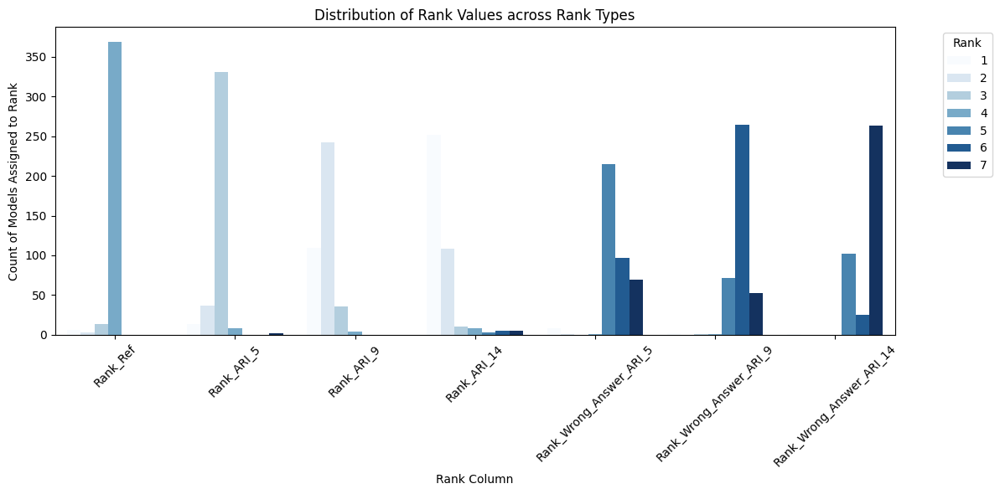

In [3]:
# Extract all rank columns
rank_columns = [col for col in rank_df.columns if "Rank" in col]

# Melt the dataframe to long format for plotting
melted_df = rank_df[rank_columns].melt(var_name='Rank_Type', value_name='Rank_Value')

# Set up the plot
plt.figure(figsize=(12, 6))
sns.countplot(data=melted_df, x='Rank_Type', hue='Rank_Value', palette='Blues')

# Labels and formatting
plt.title("Distribution of Rank Values across Rank Types")
plt.xlabel("Rank Column")
plt.ylabel("Count of Models Assigned to Rank")
plt.legend(title="Rank", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

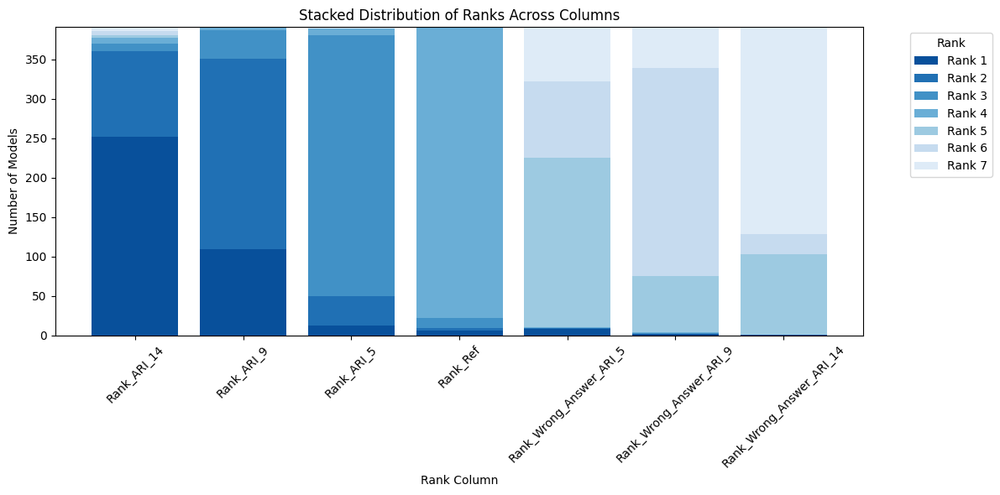

In [4]:
# Select all rank-related columns
rank_cols = [col for col in rank_df.columns if "Rank" in col]

# Melt to long format
melted = rank_df[rank_cols].melt(var_name="Rank_Type", value_name="Rank_Value")

# Pivot to get count of each rank value per column
rank_distribution = (
    melted
    .groupby(["Rank_Type", "Rank_Value"])
    .size()
    .unstack(fill_value=0)
)

# Ensure ranks are in numeric order 1→7
rank_distribution = rank_distribution[sorted(rank_distribution.columns)]

# NOW reindex to your desired x-axis order:
desired_order = [
    "Rank_ARI_14",
    "Rank_ARI_9",
    "Rank_ARI_5",
    "Rank_Ref",
    "Rank_Wrong_Answer_ARI_5",
    "Rank_Wrong_Answer_ARI_9",
    "Rank_Wrong_Answer_ARI_14"
]
rank_distribution = rank_distribution.reindex(desired_order)

# Define color shades (dark for Rank 1, light for Rank 7)
num_ranks = len(rank_distribution.columns)
colors = sns.color_palette("Blues", n_colors=num_ranks)[::-1]

# Plot stacked bars
fig, ax = plt.subplots(figsize=(12, 6))
bottom = [0] * len(rank_distribution)

for idx, rank in enumerate(rank_distribution.columns):
    ax.bar(
        rank_distribution.index,
        rank_distribution[rank],
        bottom=bottom,
        label=f"Rank {rank}",
        color=colors[idx]
    )
    bottom = [i + j for i, j in zip(bottom, rank_distribution[rank])]

# Format plot
ax.set_title("Stacked Distribution of Ranks Across Columns")
ax.set_xlabel("Rank Column")
ax.set_ylabel("Number of Models")
plt.xticks(rotation=45)
ax.legend(title="Rank", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [5]:
score_df.head()

,Unnamed: 0,Score_Ref_Answer,Score_ARI_5,Score_ARI_9,Score_ARI_14,Score_Wrong_Answer_ARI_5,Score_Wrong_Answer_ARI_9,Score_Wrong_Answer_ARI_14
0,0,9.0,10.0,10.0,10.0,9.0,3.0,8.0
1,1,7.0,10.0,9.0,10.0,2.0,2.0,2.0
2,2,10.0,9.0,10.0,10.0,2.0,2.0,2.0
3,3,10.0,8.0,10.0,10.0,1.0,2.0,1.0
4,4,9.0,10.0,10.0,10.0,2.0,2.0,2.0


In [6]:
# 2. Define the exact score columns
score_columns = [
    'Score_ARI_5', 'Score_ARI_9', 'Score_ARI_14','Score_Ref_Answer',
    'Score_Wrong_Answer_ARI_5', 'Score_Wrong_Answer_ARI_9', 'Score_Wrong_Answer_ARI_14'
]

# 3. Filter only relevant columns
filtered_scores = score_df[score_columns].copy()

# 4. Initialize storage for (score_name, rank)
rank_storage = pd.DataFrame(columns=['score_name', 'rank'])

# 5. Loop through each row and calculate intra-row ranks
for _, row in filtered_scores.iterrows():
    scores = {
        'score_ari_5': row['Score_ARI_5'],
        'score_ari_9': row['Score_ARI_9'],
        'score_ari_14': row['Score_ARI_14'],
        'score_ref_answer': row['Score_Ref_Answer'],
        'score_wrong_ari_5': row['Score_Wrong_Answer_ARI_5'],
        'score_wrong_ari_9': row['Score_Wrong_Answer_ARI_9'],
        'score_wrong_ari_14': row['Score_Wrong_Answer_ARI_14'],
    }

    temp_df = pd.DataFrame(scores.items(), columns=['score_name', 'score_value'])
    temp_df['rank'] = temp_df['score_value'].rank(method='max', ascending=False)

    rank_storage = pd.concat([rank_storage, temp_df[['score_name', 'rank']]], ignore_index=True)

# 6. Count frequency of each rank per score_name
rank_counts = rank_storage.groupby(['score_name', 'rank']).size().reset_index(name='count')

# 7. Pivot the table
pivot_data = rank_counts.pivot(index='score_name', columns='rank', values='count').fillna(0)

# 8. Rename columns for clarity (optional)
pivot_data.columns = [f'rank_{int(col)}_count' for col in pivot_data.columns]

# 9. Show the final pivoted table
print(pivot_data)


C:\Users\apareek\AppData\Local\Temp\ipykernel_33148\3167801500.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rank_storage = pd.concat([rank_storage, temp_df[['score_name', 'rank']]], ignore_index=True)


                    rank_1_count  rank_2_count  rank_3_count  rank_4_count  \
score_name                                                                   
score_ari_14                72.0         108.0         118.0          86.0   
score_ari_5                  0.0          14.0         103.0         253.0   
score_ari_9                  2.0          95.0         159.0         127.0   
score_ref_answer             3.0          24.0         127.0         214.0   
score_wrong_ari_14           1.0           2.0           3.0           8.0   
score_wrong_ari_5            0.0           0.0           2.0           5.0   
score_wrong_ari_9            0.0           1.0           2.0           3.0   

                    rank_5_count  rank_6_count  rank_7_count  
score_name                                                    
score_ari_14                 4.0           0.0           3.0  
score_ari_5                 20.0           1.0           0.0  
score_ari_9                  7.0           1.

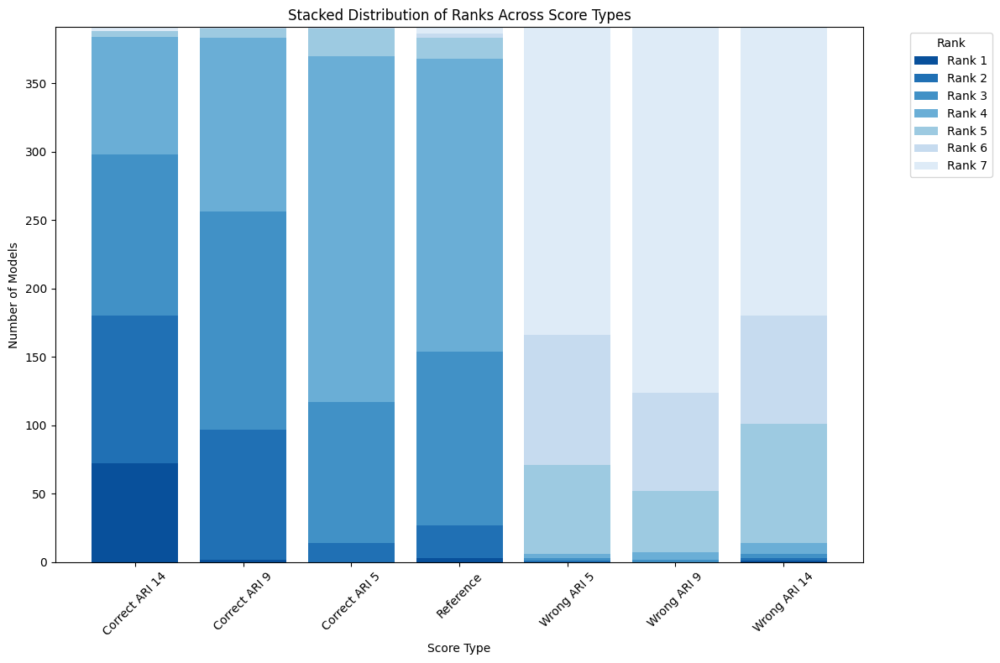

In [7]:
# 1) Specify the new order
new_order = [
    'score_ari_14',
    'score_ari_9',
    'score_ari_5',
    'score_ref_answer',
    'score_wrong_ari_9',
    'score_wrong_ari_5',
    'score_wrong_ari_14'
]

# 2) Reindex pivot_data
pivot_data = pivot_data.reindex(new_order)

# 3) (Optional) relabel to nicer names
pivot_data.index = [
    'Correct ARI 14',
    'Correct ARI 9',
    'Correct ARI 5',
    'Reference',
    'Wrong ARI 5',
    'Wrong ARI 9',
    'Wrong ARI 14',
]

rank_cols = sorted(pivot_data.columns, key=lambda c: int(c.split('_')[1]))
colors = sns.color_palette("Blues", n_colors=len(rank_cols))[::-1]

fig, ax = plt.subplots(figsize=(12, 8))
bottom = [0] * len(pivot_data)

for idx, col in enumerate(rank_cols):
    ax.bar(
        pivot_data.index,
        pivot_data[col],
        bottom=bottom,
        label=f'Rank {idx+1}',
        color=colors[idx]
    )
    bottom = [i + j for i, j in zip(bottom, pivot_data[col])]

ax.set_xlabel('Score Type')
ax.set_ylabel('Number of Models')
ax.set_title('Stacked Distribution of Ranks Across Score Types')
ax.legend(title='Rank', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\apareek\AppData\Local\Temp\ipykernel_33148\3816070.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("Blues")


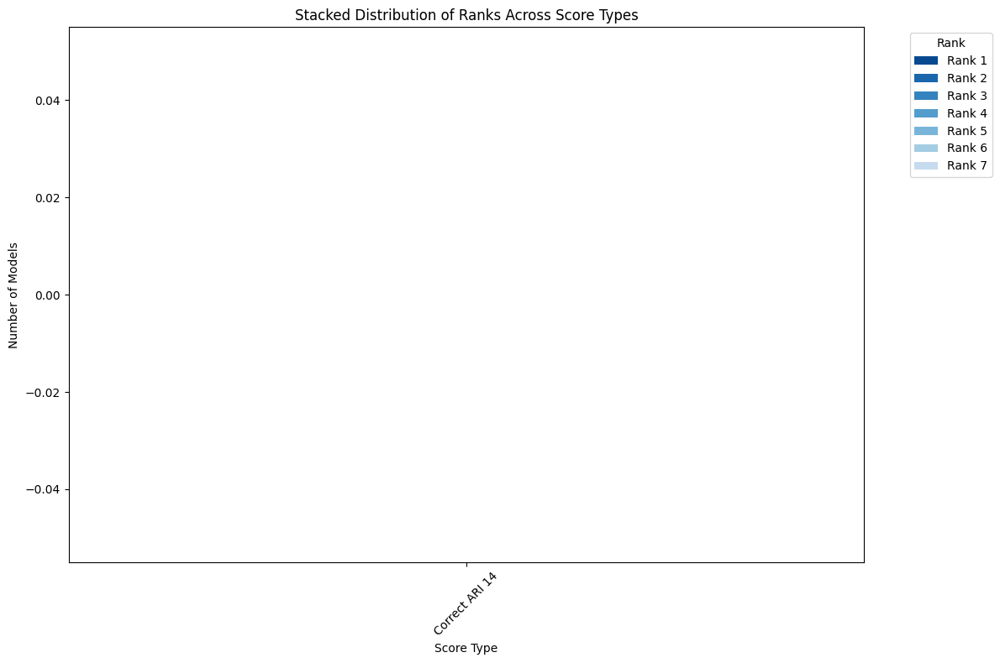

In [8]:
# 1) Specify the new order
new_order = [
    'score_ari_14',
    'score_ari_9',
    'score_ari_5',
    'score_ref_answer',
    'score_wrong_ari_5',
    'score_wrong_ari_9',
    'score_wrong_ari_14'
]

# 2) Reindex pivot_data
pivot_data = pivot_data.reindex(new_order)

# 3) Relabel to nicer names
pivot_data.index = [
    'Correct ARI 14',
    'Correct ARI 9',
    'Correct ARI 5',
    'Reference',
    'Wrong ARI 5',
    'Wrong ARI 9',
    'Wrong ARI 14',
]

# Sort rank columns numerically
rank_cols = sorted(pivot_data.columns, key=lambda c: int(c.split('_')[1]))

# Use a smoother gradient (avoid extremes)
n = len(rank_cols)
cmap = get_cmap("Blues")
colors = cmap(np.linspace(0.25, 0.9, n))[::-1]  # darkest = Rank 1

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
bottom = np.zeros(len(pivot_data))

for idx, col in enumerate(rank_cols):
    ax.bar(
        pivot_data.index,
        pivot_data[col],
        bottom=bottom,
        label=f'Rank {idx+1}',
        color=colors[idx],
        edgecolor='none'  # removes harsh lines between segments
    )
    bottom += pivot_data[col].values

ax.set_xlabel('Score Type')
ax.set_ylabel('Number of Models')
ax.set_title('Stacked Distribution of Ranks Across Score Types')
ax.legend(title='Rank', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\apareek\AppData\Local\Temp\ipykernel_33148\1070773900.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("coolwarm")  # diverging map


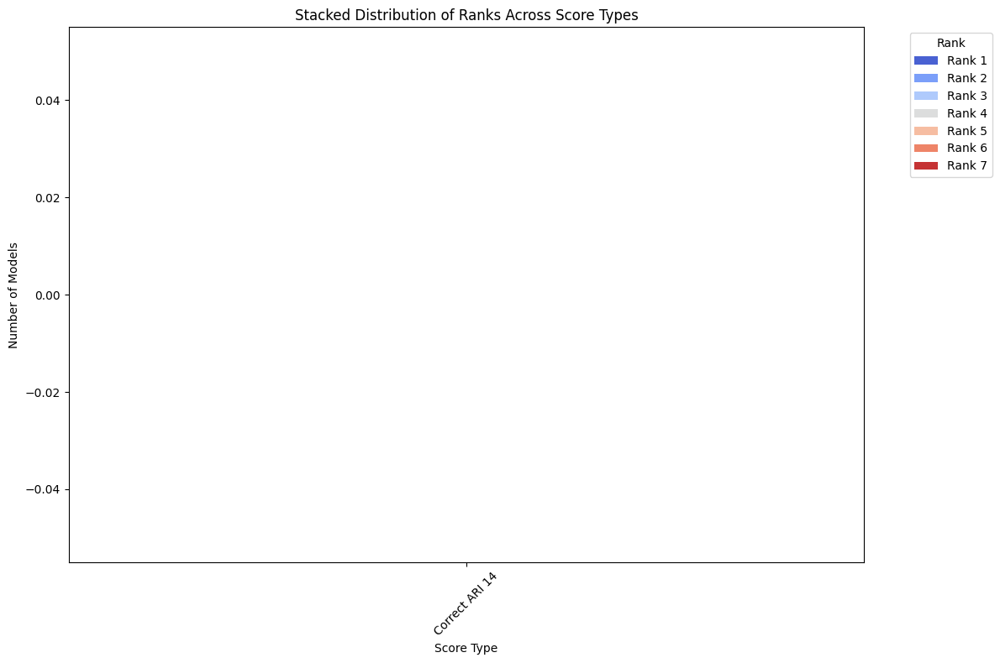

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Keep your ordering and labels
new_order = [
    'score_ari_14',
    'score_ari_9',
    'score_ari_5',
    'score_ref_answer',
    'score_wrong_ari_5',
    'score_wrong_ari_9',
    'score_wrong_ari_14'
]
pivot_data = pivot_data.reindex(new_order)
pivot_data.index = [
    'Correct ARI 14',
    'Correct ARI 9',
    'Correct ARI 5',
    'Reference',
    'Wrong ARI 5',
    'Wrong ARI 9',
    'Wrong ARI 14',
]

# Sort rank columns numerically
rank_cols = sorted(pivot_data.columns, key=lambda c: int(c.split('_')[1]))

# Blue → white → red diverging palette
n = len(rank_cols)
cmap = get_cmap("coolwarm")  # diverging map
colors = cmap(np.linspace(0.05, 0.95, n))  # avoid extreme ends

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
bottom = np.zeros(len(pivot_data))

for idx, col in enumerate(rank_cols):
    ax.bar(
        pivot_data.index,
        pivot_data[col],
        bottom=bottom,
        label=f'Rank {idx+1}',
        color=colors[idx],
        edgecolor='none'
    )
    bottom += pivot_data[col].values

ax.set_xlabel('Score Type')
ax.set_ylabel('Number of Models')
ax.set_title('Stacked Distribution of Ranks Across Score Types')
ax.legend(title='Rank', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


C:\Users\apareek\AppData\Local\Temp\ipykernel_33148\3305314141.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("viridis")


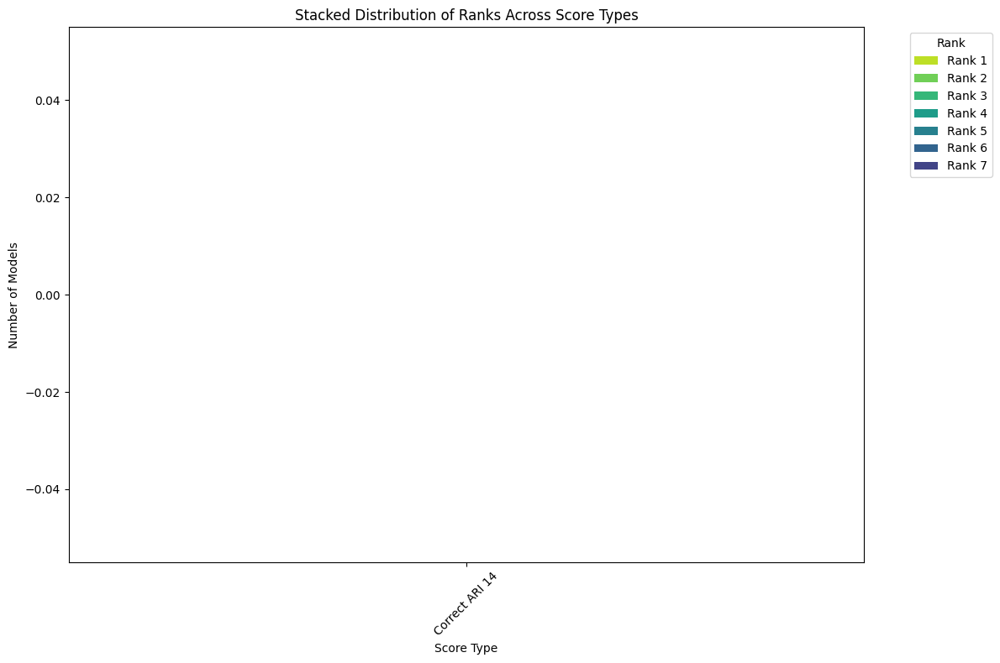

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# # --- keep your ordering and labels ---
# new_order = [
#     'score_ari_14',
#     'score_ari_9',
#     'score_ari_5',
#     'score_ref_answer',
#     'score_wrong_ari_5',
#     'score_wrong_ari_9',
#     'score_wrong_ari_14'
# ]
# pivot_data = pivot_data.reindex(new_order)
# pivot_data.index = [
#     'Correct ARI 14',
#     'Correct ARI 9',
#     'Correct ARI 5',
#     'Reference',
#     'Wrong ARI 5',
#     'Wrong ARI 9',
#     'Wrong ARI 14',
# ]

# Sort rank columns numerically
rank_cols = sorted(pivot_data.columns, key=lambda c: int(c.split('_')[1]))

# Use viridis sequential palette (avoid extremes for smoother look)
n = len(rank_cols)
cmap = get_cmap("viridis")
colors = cmap(np.linspace(0.2, 0.9, n))[::-1]  # darkest = Rank 1

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
bottom = np.zeros(len(pivot_data))

for idx, col in enumerate(rank_cols):
    ax.bar(
        pivot_data.index,
        pivot_data[col],
        bottom=bottom,
        label=f'Rank {idx+1}',
        color=colors[idx],
        edgecolor='none'
    )
    bottom += pivot_data[col].values

ax.set_xlabel('Score Type')
ax.set_ylabel('Number of Models')
ax.set_title('Stacked Distribution of Ranks Across Score Types')
ax.legend(title='Rank', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [11]:
# 2. Define the exact score columns
score_columns = [
    'Score_ARI_5', 'Score_ARI_9', 'Score_ARI_14','Score_Ref_Answer',
    'Score_Wrong_Answer_ARI_5', 'Score_Wrong_Answer_ARI_9', 'Score_Wrong_Answer_ARI_14'
]

# 3. Filter only relevant columns
filtered_scores = score_df[score_columns].copy()

# 4. Initialize storage for (score_name, rank)
rank_storage = pd.DataFrame(columns=['score_name', 'rank'])

# 5. Loop through each row and calculate intra-row ranks
for _, row in filtered_scores.iterrows():
    scores = {
        'score_ari_5': row['Score_ARI_5'],
        'score_ari_9': row['Score_ARI_9'],
        'score_ari_14': row['Score_ARI_14'],
        'score_ref_answer': row['Score_Ref_Answer'],
        'score_wrong_ari_5': row['Score_Wrong_Answer_ARI_5'],
        'score_wrong_ari_9': row['Score_Wrong_Answer_ARI_9'],
        'score_wrong_ari_14': row['Score_Wrong_Answer_ARI_14'],
    }

    temp_df = pd.DataFrame(scores.items(), columns=['score_name', 'score_value'])
    temp_df['rank'] = temp_df['score_value'].rank(method='min', ascending=False)

    rank_storage = pd.concat([rank_storage, temp_df[['score_name', 'rank']]], ignore_index=True)

# 6. Count frequency of each rank per score_name
rank_counts = rank_storage.groupby(['score_name', 'rank']).size().reset_index(name='count')

# 7. Pivot the table
pivot_data = rank_counts.pivot(index='score_name', columns='rank', values='count').fillna(0)

# 8. Rename columns for clarity (optional)
pivot_data.columns = [f'rank_{int(col)}_count' for col in pivot_data.columns]

# 9. Show the final pivoted table
print(pivot_data)


C:\Users\apareek\AppData\Local\Temp\ipykernel_33148\1604523131.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rank_storage = pd.concat([rank_storage, temp_df[['score_name', 'rank']]], ignore_index=True)


                    rank_1_count  rank_2_count  rank_3_count  rank_4_count  \
score_name                                                                   
score_ari_14               380.0           5.0           2.0           1.0   
score_ari_5                144.0          29.0          88.0         119.0   
score_ari_9                273.0          63.0          35.0          19.0   
score_ref_answer           193.0          32.0          65.0          89.0   
score_wrong_ari_14           8.0           4.0           1.0          12.0   
score_wrong_ari_5            0.0           1.0           1.0           9.0   
score_wrong_ari_9            4.0           1.0           1.0           6.0   

                    rank_5_count  rank_6_count  rank_7_count  
score_name                                                    
score_ari_14                 0.0           1.0           2.0  
score_ari_5                 11.0           0.0           0.0  
score_ari_9                  0.0           1.

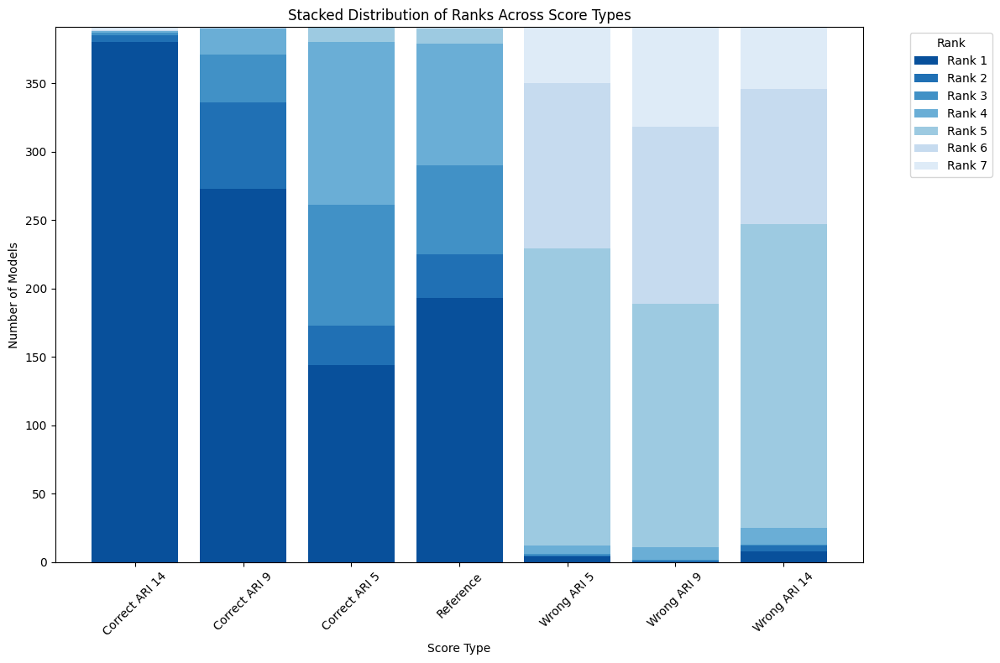

In [12]:
# 1) Specify the new order
new_order = [
    'score_ari_14',
    'score_ari_9',
    'score_ari_5',
    'score_ref_answer',
    'score_wrong_ari_9',
    'score_wrong_ari_5',
    'score_wrong_ari_14'
]

# 2) Reindex pivot_data
pivot_data = pivot_data.reindex(new_order)

# 3) (Optional) relabel to nicer names
pivot_data.index = [
    'Correct ARI 14',
    'Correct ARI 9',
    'Correct ARI 5',
    'Reference',
    'Wrong ARI 5',
    'Wrong ARI 9',
    'Wrong ARI 14',
]

rank_cols = sorted(pivot_data.columns, key=lambda c: int(c.split('_')[1]))
colors = sns.color_palette("Blues", n_colors=len(rank_cols))[::-1]

fig, ax = plt.subplots(figsize=(12, 8))
bottom = [0] * len(pivot_data)

for idx, col in enumerate(rank_cols):
    ax.bar(
        pivot_data.index,
        pivot_data[col],
        bottom=bottom,
        label=f'Rank {idx+1}',
        color=colors[idx]
    )
    bottom = [i + j for i, j in zip(bottom, pivot_data[col])]

ax.set_xlabel('Score Type')
ax.set_ylabel('Number of Models')
ax.set_title('Stacked Distribution of Ranks Across Score Types')
ax.legend(title='Rank', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [42]:
import importlib
import llm_eval_plots  # first import

# Now reload after editing the file
importlib.reload(llm_eval_plots)

<module 'llm_eval_plots' from 'c:\\Users\\apareek\\WorkStation\\llm_evaluator_ari_evaluation\\thesis_project\\reports\\llm_eval_plots.py'>

In [43]:
from llm_eval_plots import LLMEvalVisualizer, default_score_rename_map, default_rank_order
import matplotlib.pyplot as plt


In [60]:

def plot_trend_graphs(score_file,rank_file,Model):
    viz = LLMEvalVisualizer(
    score_source=score_file,
    rank_source=rank_file,
).load()

    # 1) Listwise (pre-assigned) ranks → stacked distribution
    dist = viz.listwise_rank_distribution(desired_order=default_rank_order())
    viz.plot_stacked_distribution(dist, title=f"Listwise Rank Distribution-{Model}", normalize=True)
    plt.show()

    # 2) Pairwise scores → intra-row ranks → counts → stacked distribution
    score_cols = list(default_score_rename_map().keys())
    pair_counts = viz.pairwise_rank_counts(score_cols, rename_map=default_score_rename_map())
    viz.plot_stacked_distribution(pair_counts, title=f"Pairwise Rank Distribution-{Model}")
    plt.show()

    # 3) Violin plot
    viz.plot_violin_scores(score_cols, rename_map=default_score_rename_map(), title=f"Score Distributions (Violin)-{Model}")
    plt.show()

    # 4) Density (KDE)
    # viz.plot_density(score_cols, rename_map=default_score_rename_map(), title=f"Score Density (KDE)-{Model}", cmap_name="viridis")
    # common_xlim = (0, 14)     # or compute from both CSVs once
    common_ylim = (0, 1.5)    # pick a y-top that fits both plots

    viz.plot_density(
    score_columns=list(default_score_rename_map().keys()),
    rename_map=default_score_rename_map(),
    title=f"",
    cmap_name="viridis",
    bw_adjust=1.0,
    # xlim=common_xlim,
    # ylim=common_ylim,
    )
    plt.show()


    viz.plot_ridgeline_scores(
        score_columns=score_cols,
        rename_map=default_score_rename_map(),
        cmap_name="Blues",
        overlap=0.6,
        linewidth=1.4,
        Model=Model
    )
    
    # viz.plot_confusion_matrices(normalize=None)      # raw counts
    viz.plot_confusion_matrices(normalize="row")     # row-normalized percentages
    viz.plot_confusion_matrices(normalize="col")     # column-normalized percentages




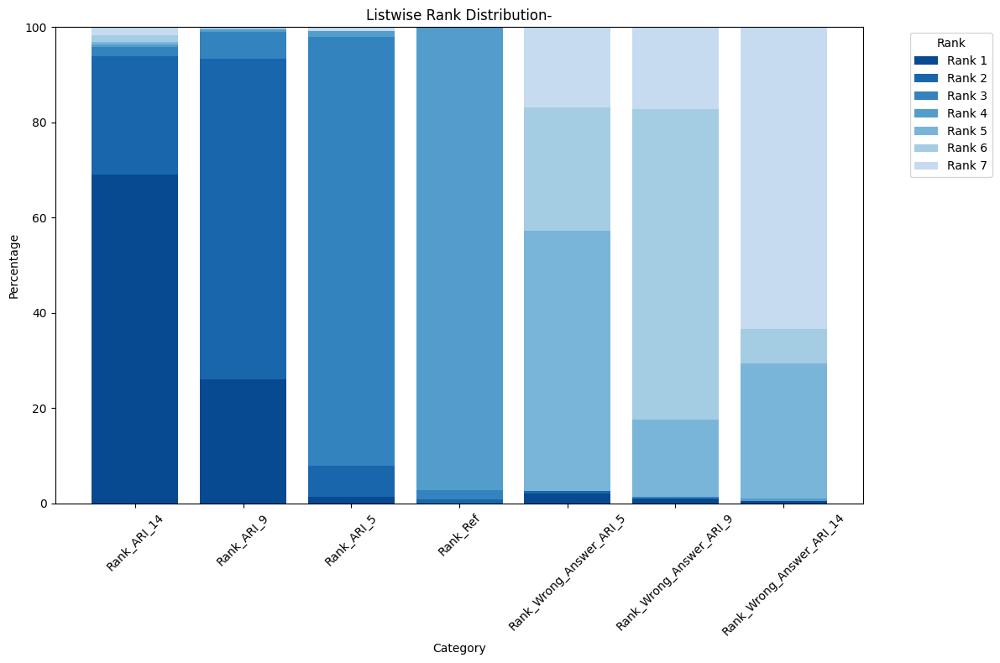

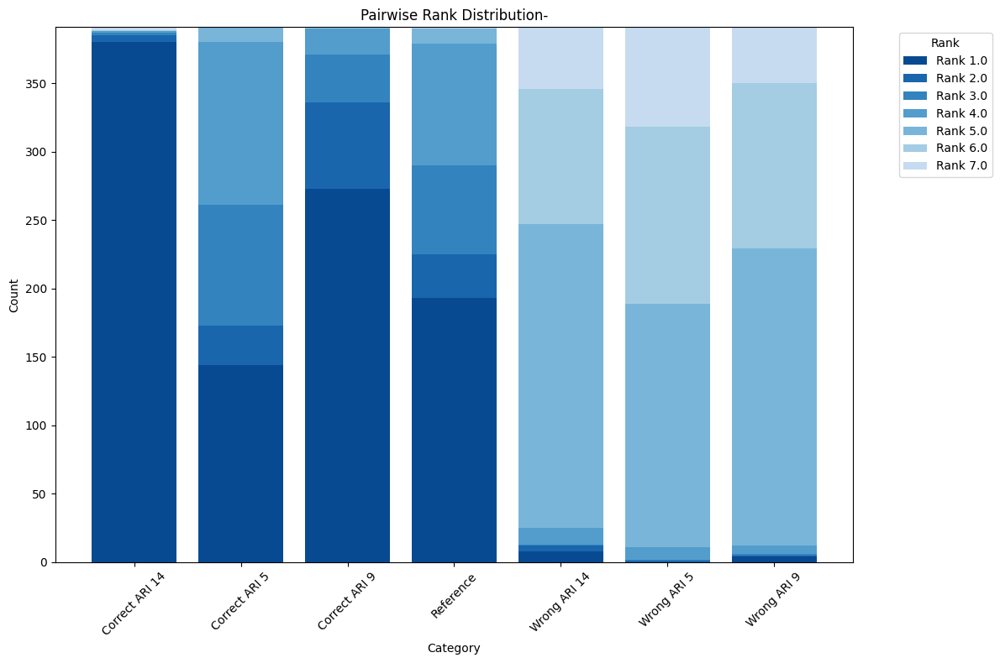

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


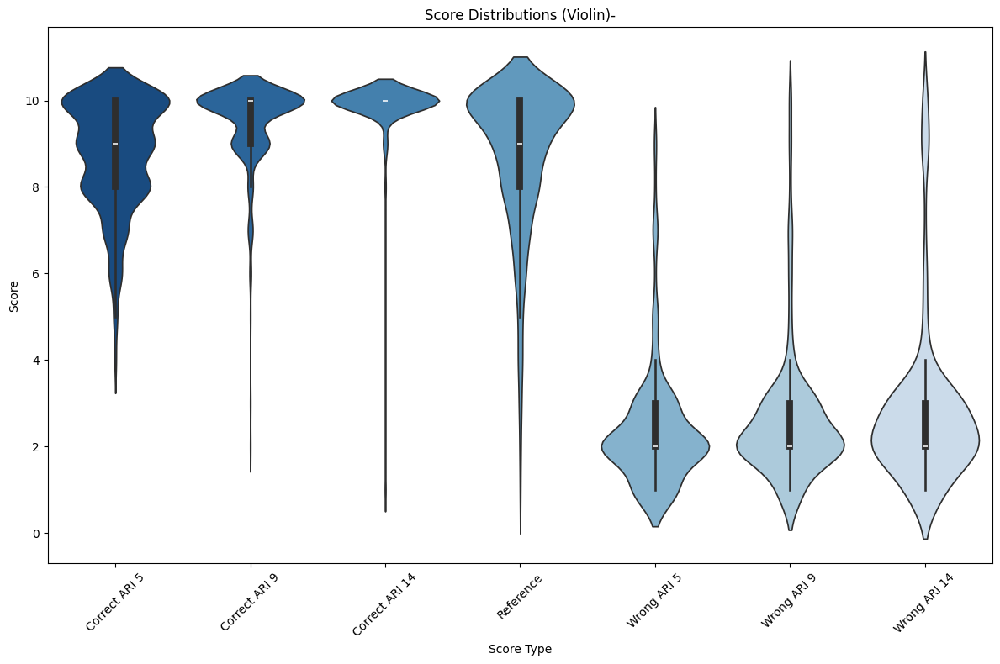

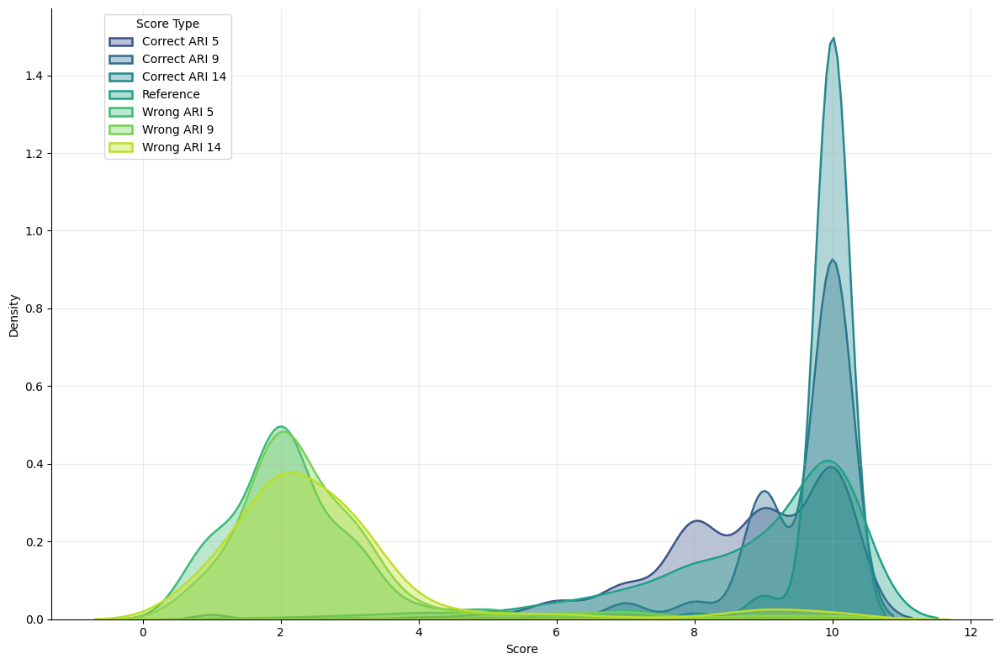

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

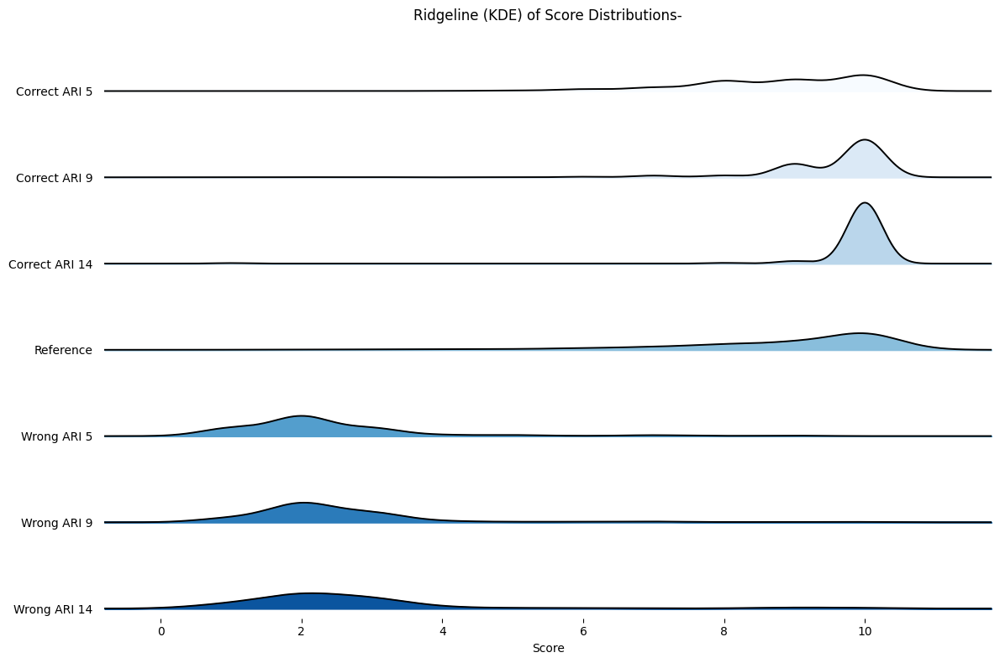

In [45]:
rank_file  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv"
score_file = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"

plot_trend_graphs(score_file, rank_file,"")


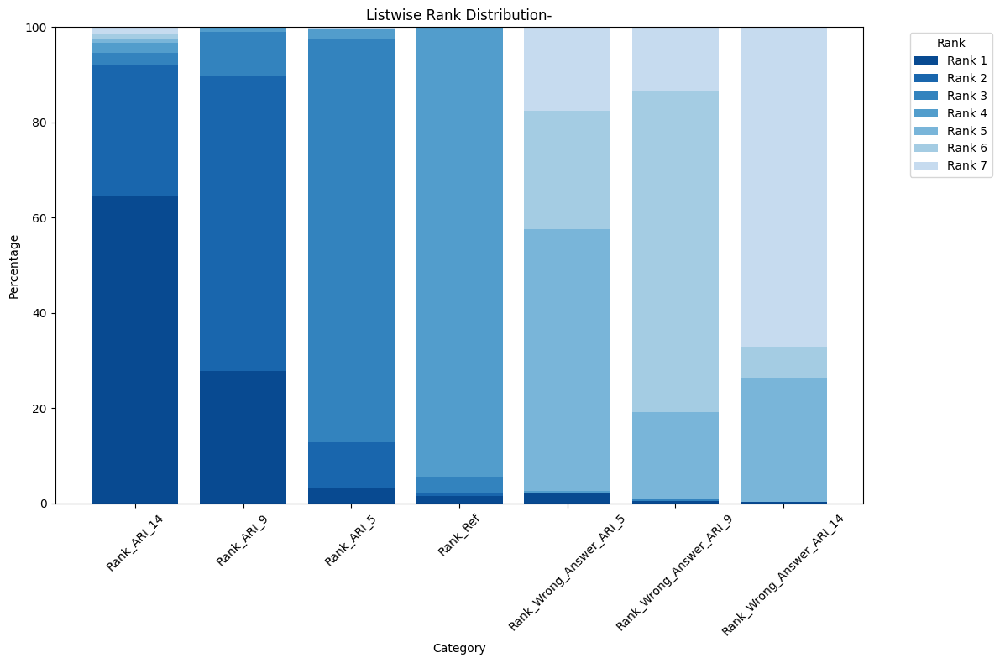

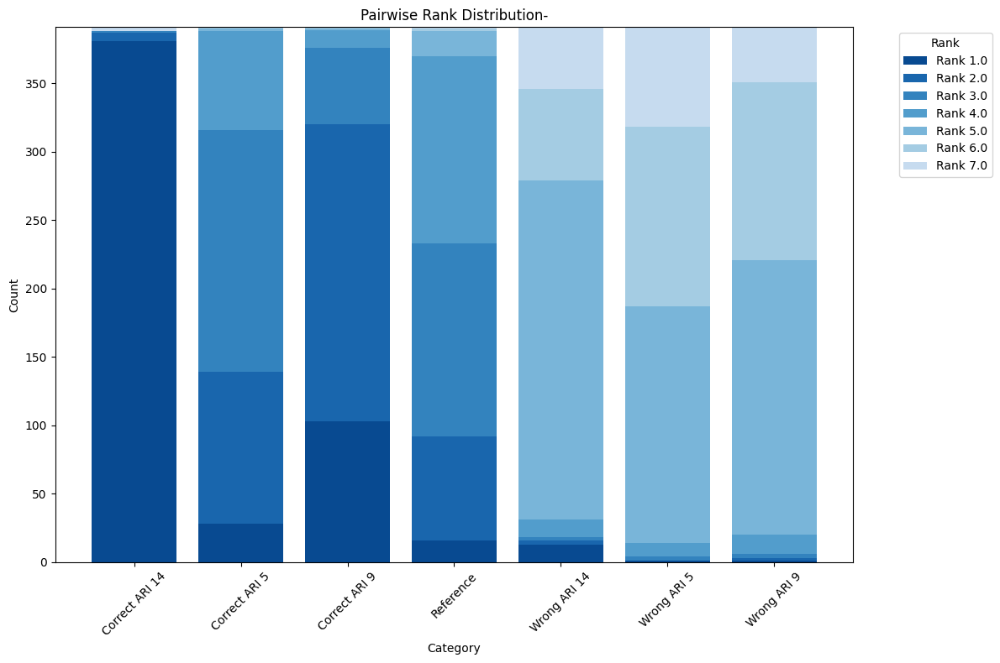

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


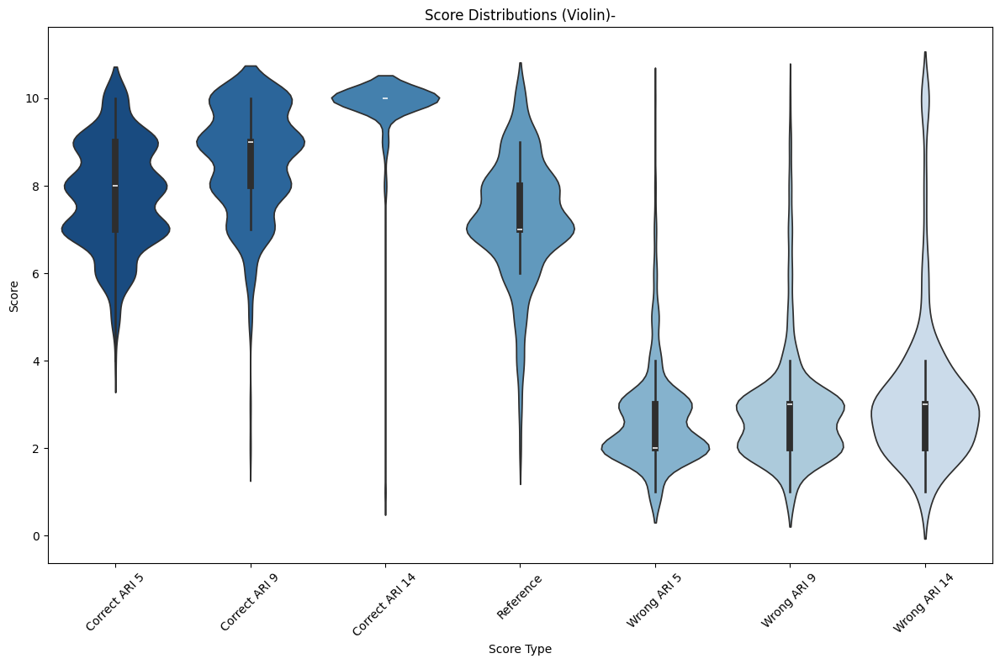

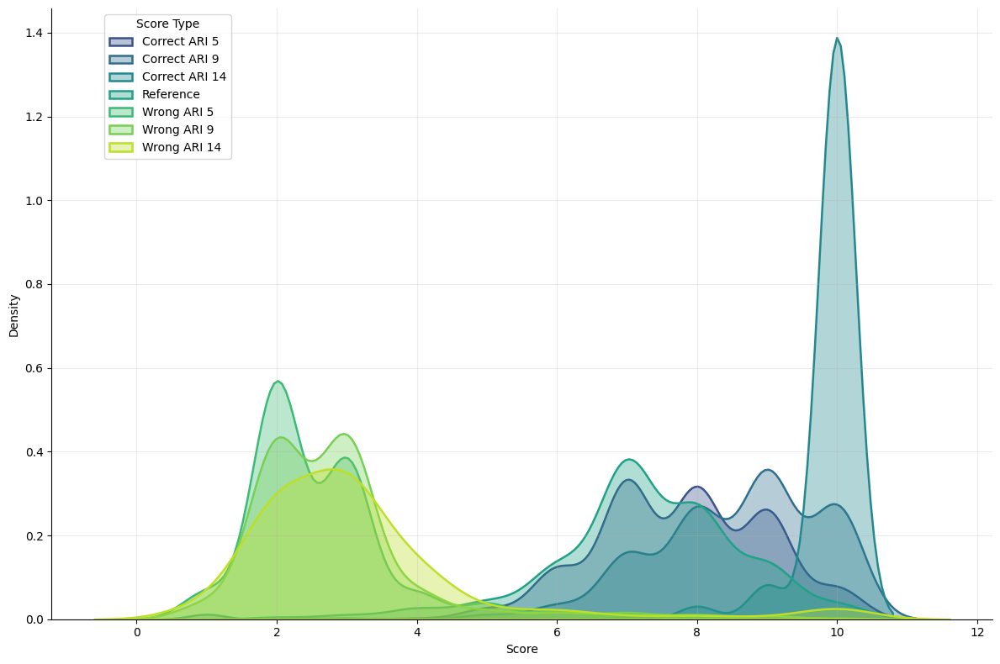

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

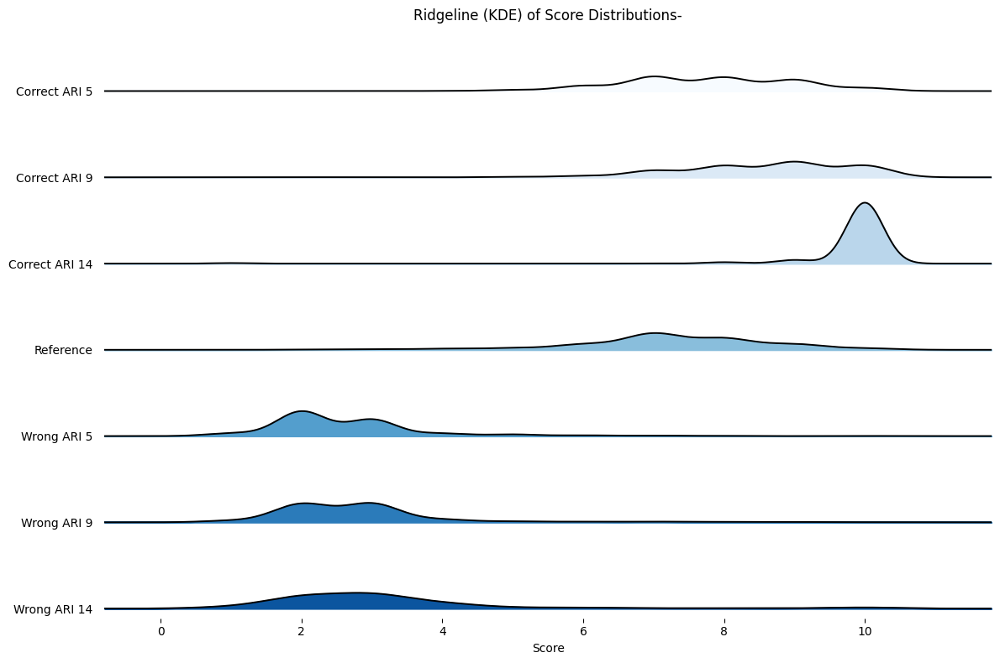

In [46]:
rank_file  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
score_file = "../resultFiles/GPT4/Default/Score/filtered_all_score_cot.csv"

plot_trend_graphs(score_file, rank_file,"")

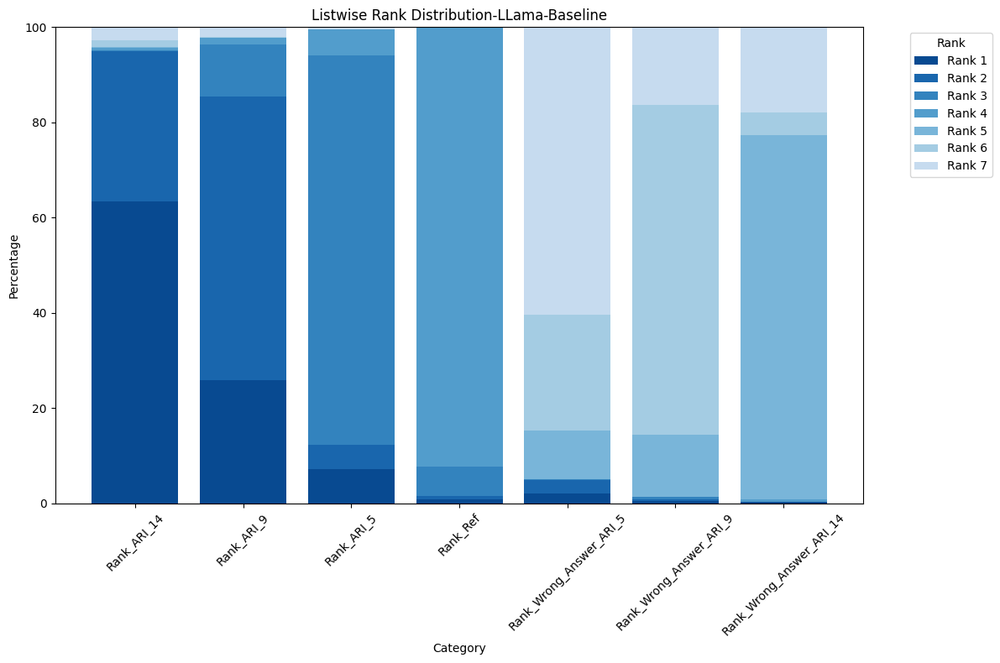

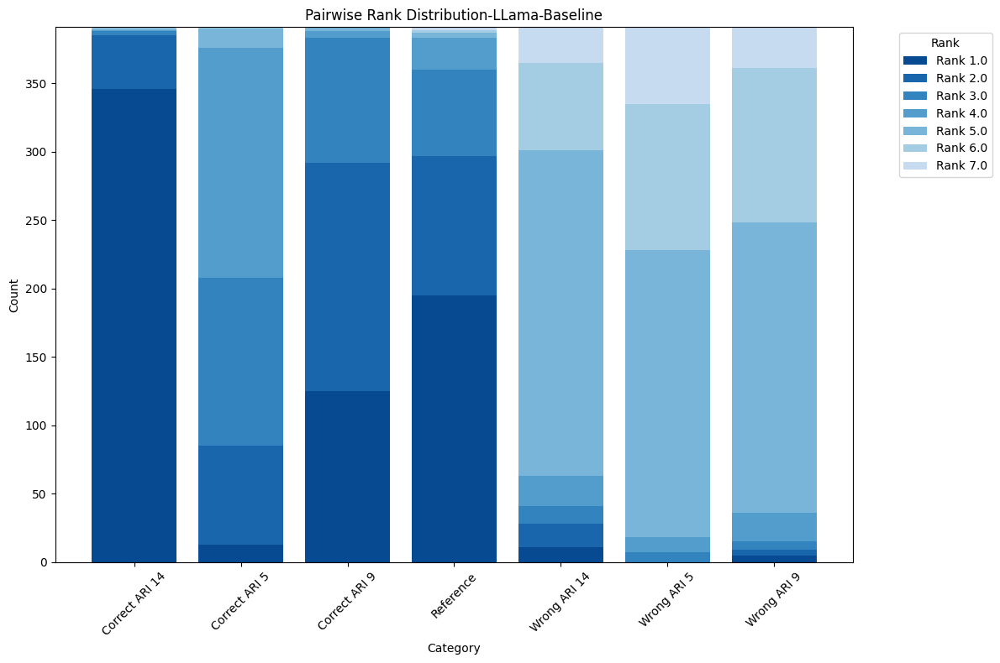

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


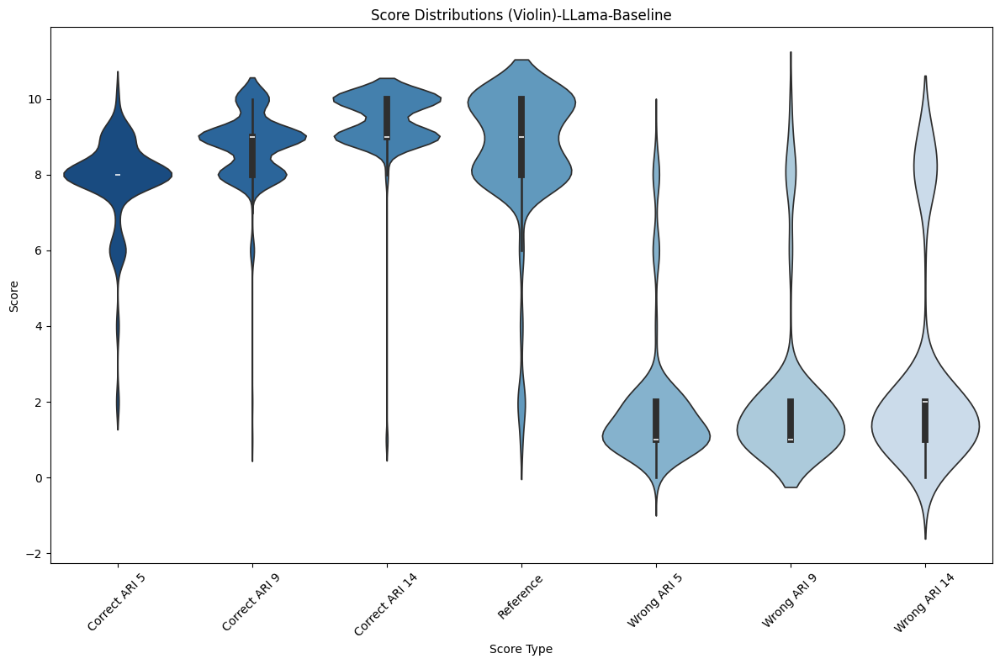

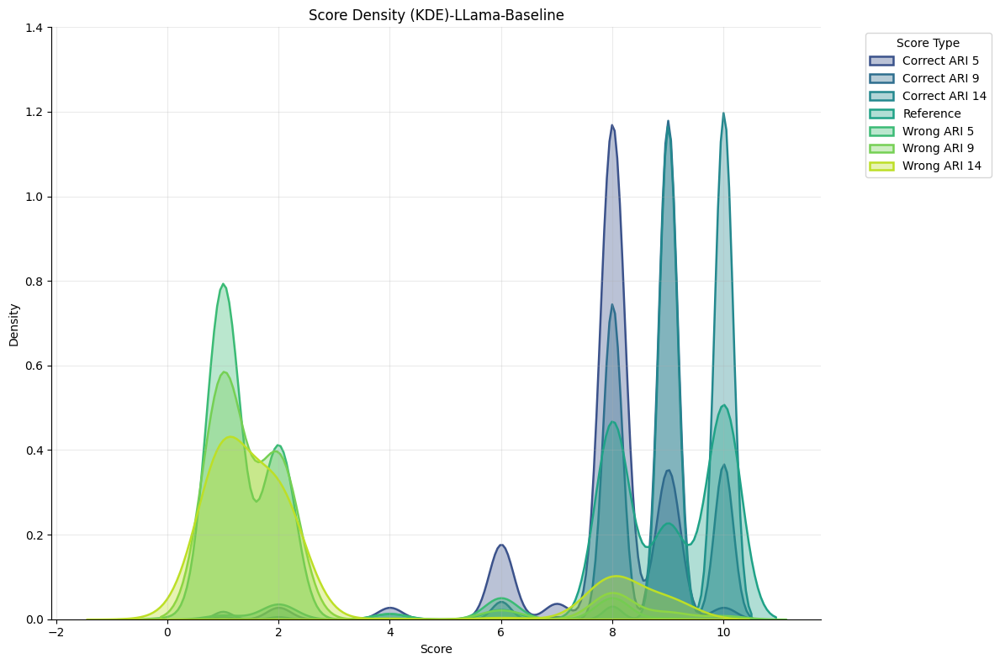

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

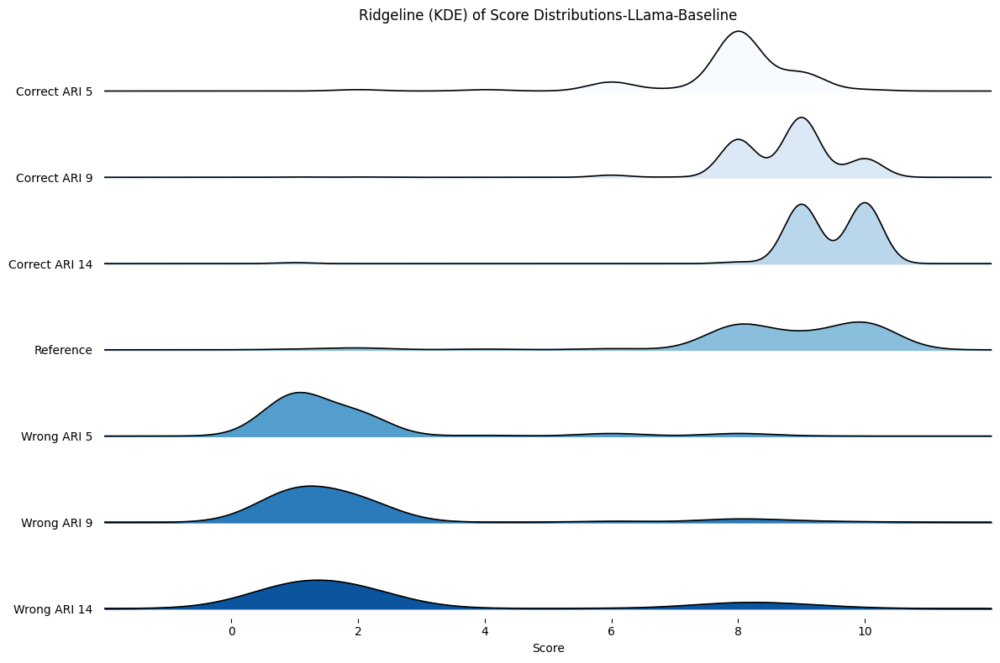

In [155]:
rank_file  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"  # <-- no trailing comma
score_file = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"          # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"LLama-Baseline")  # or: plot_trend_graphs(score_file=score_file, rank_file=rank_file)

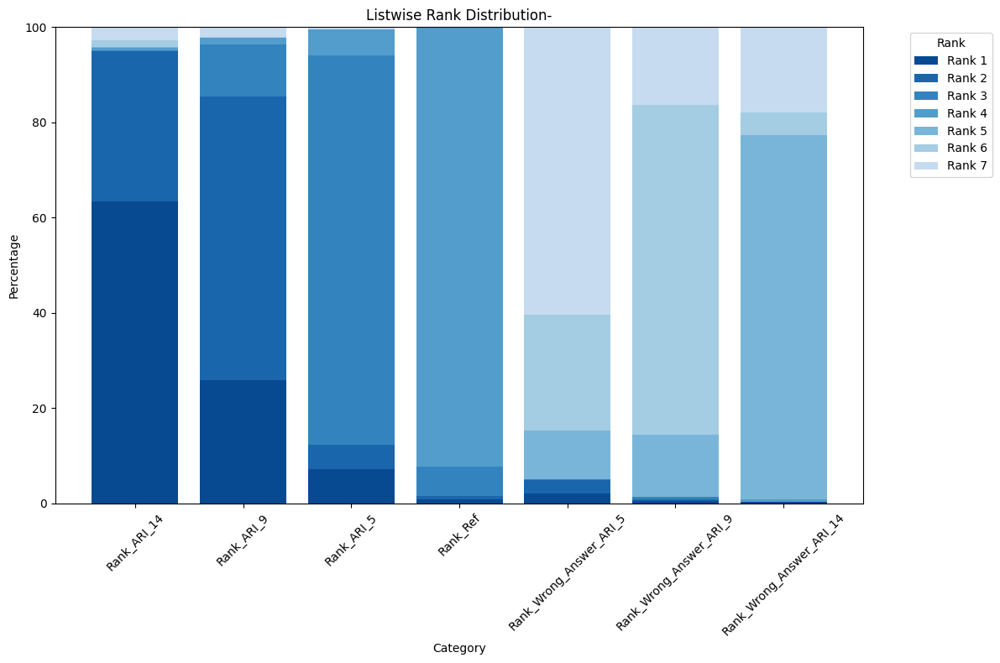

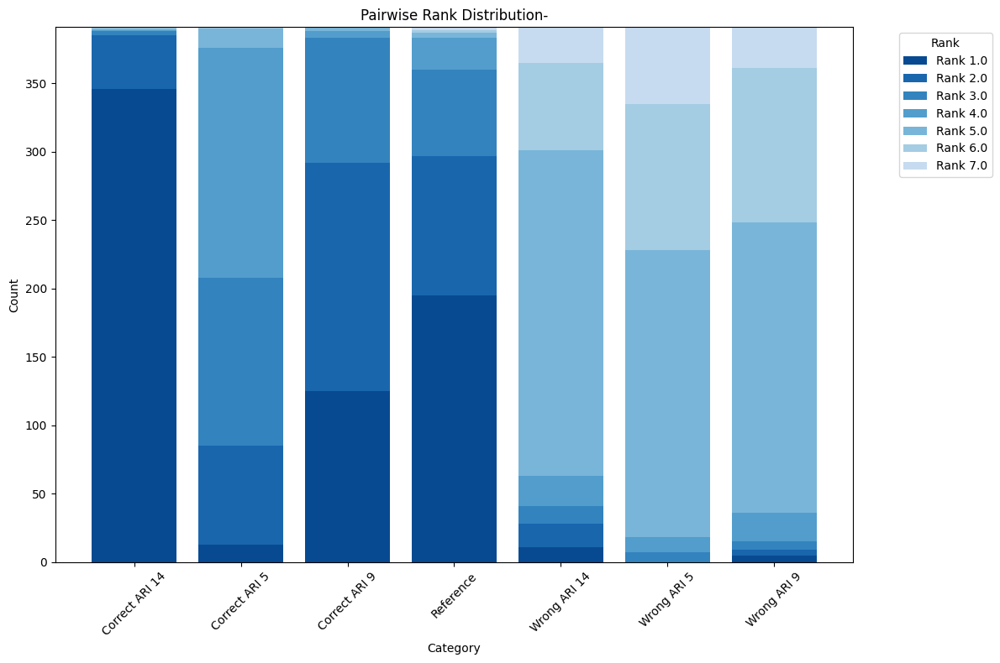

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


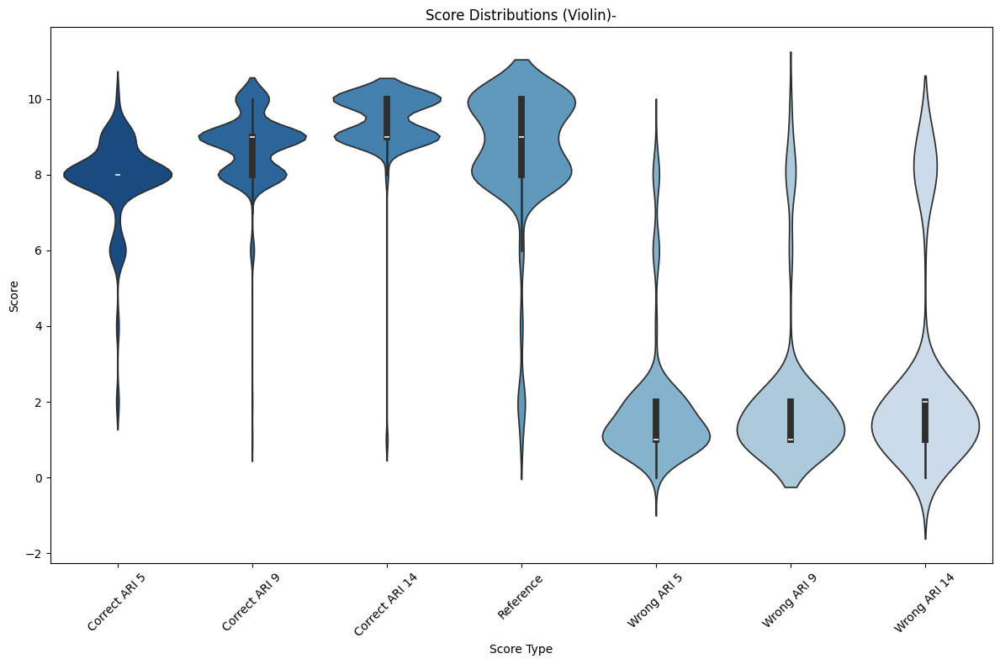

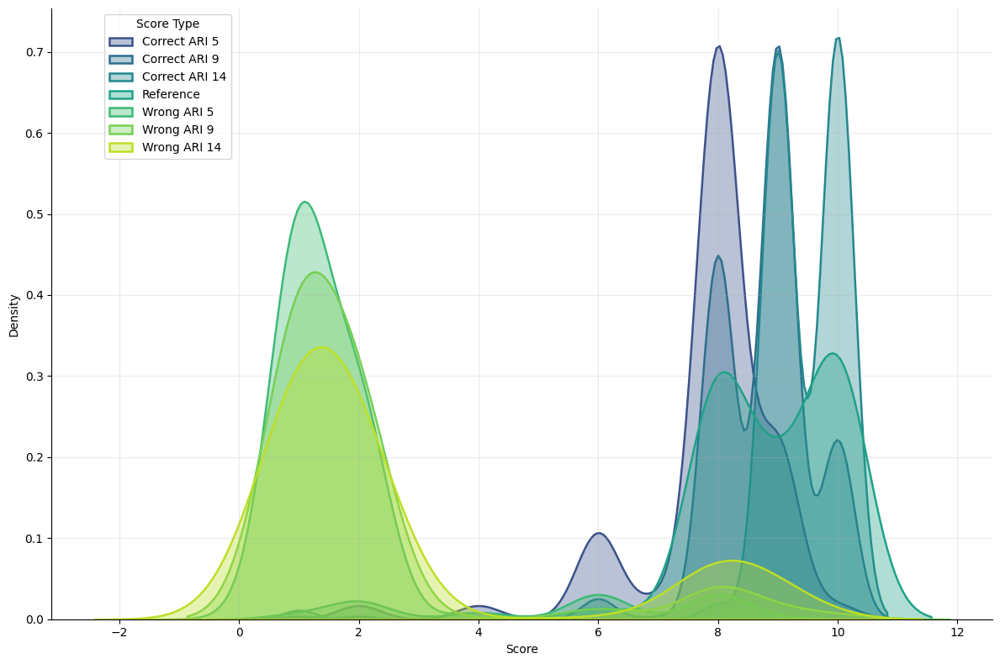

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

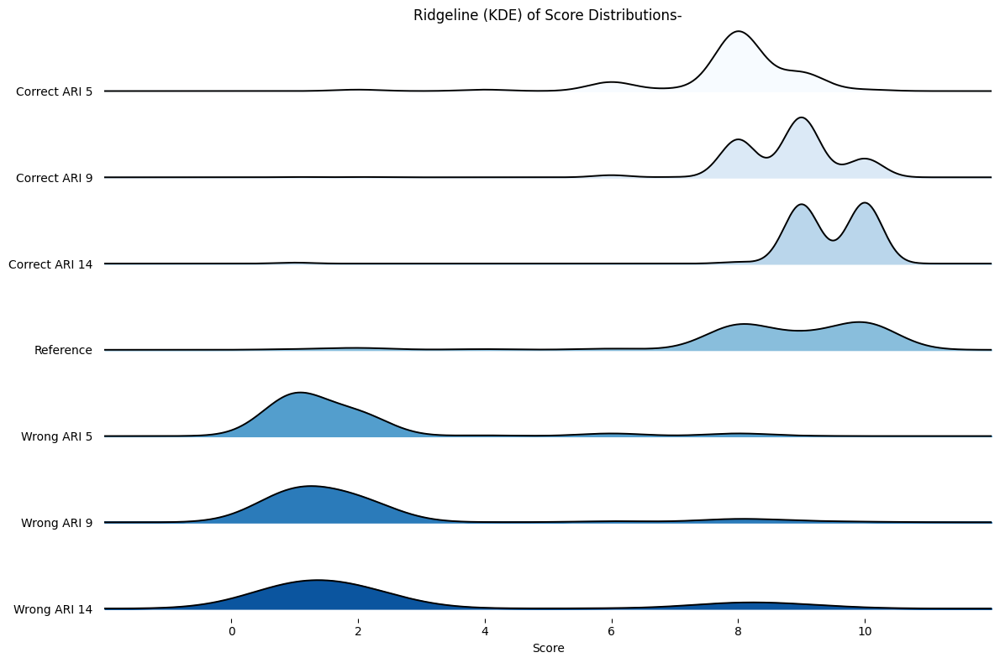

In [48]:
rank_file  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"  # <-- no trailing comma
score_file = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"          # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"")

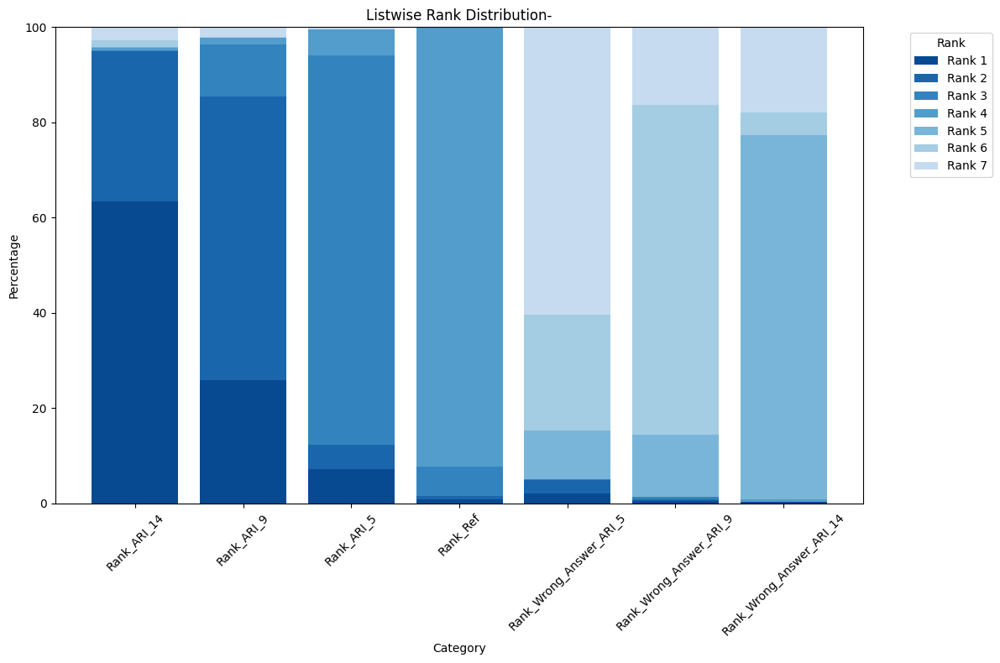

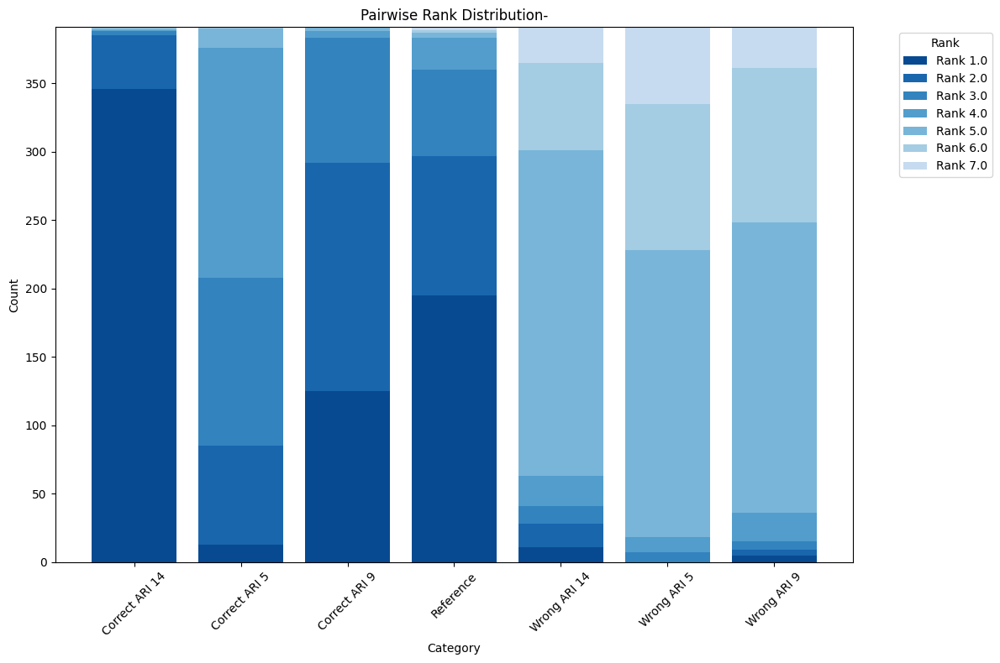

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


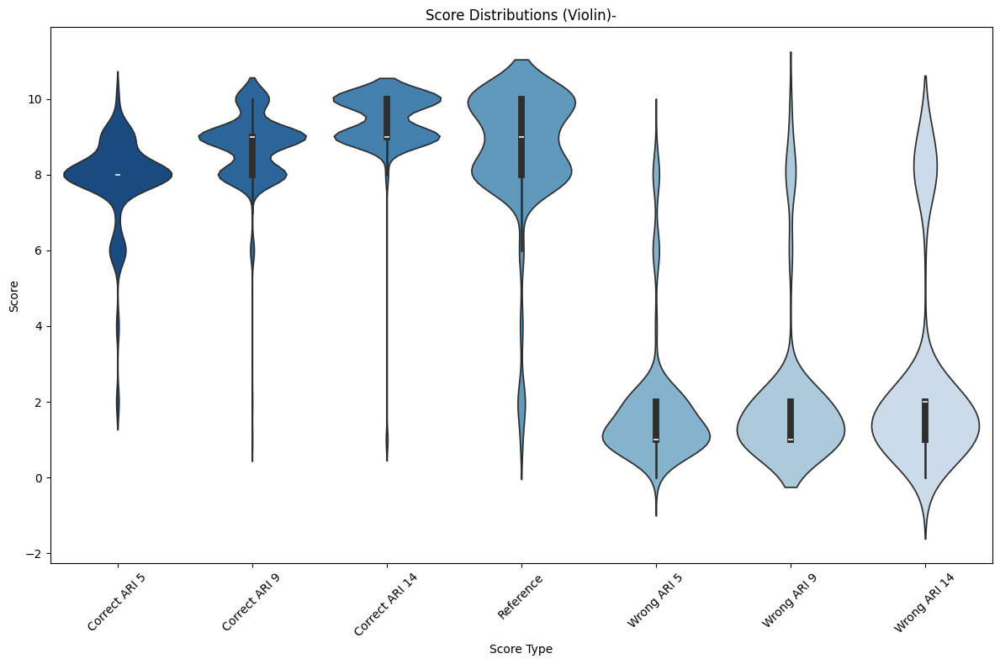

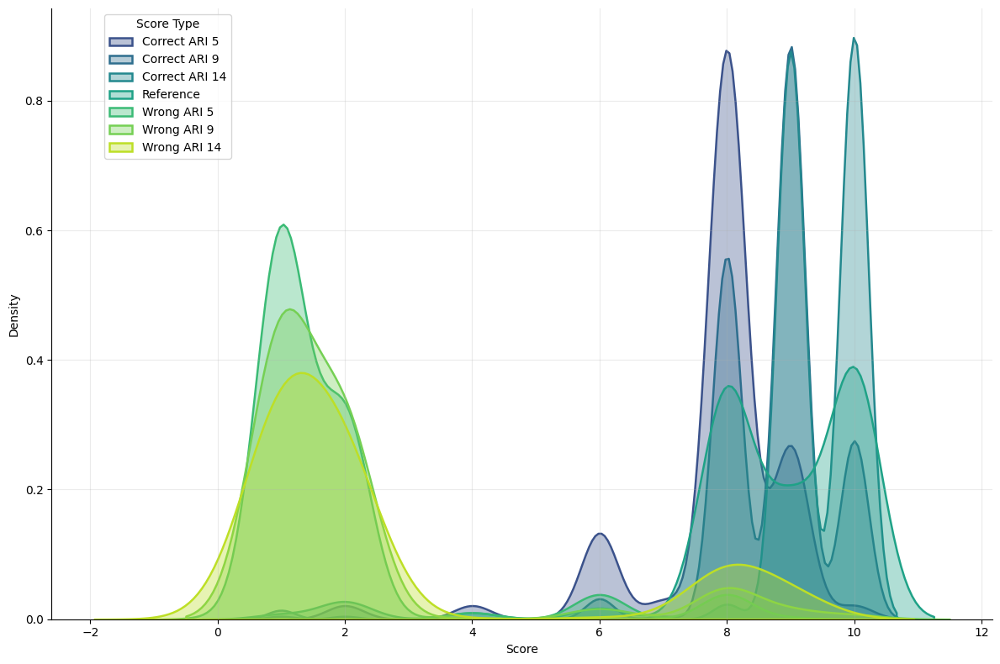

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

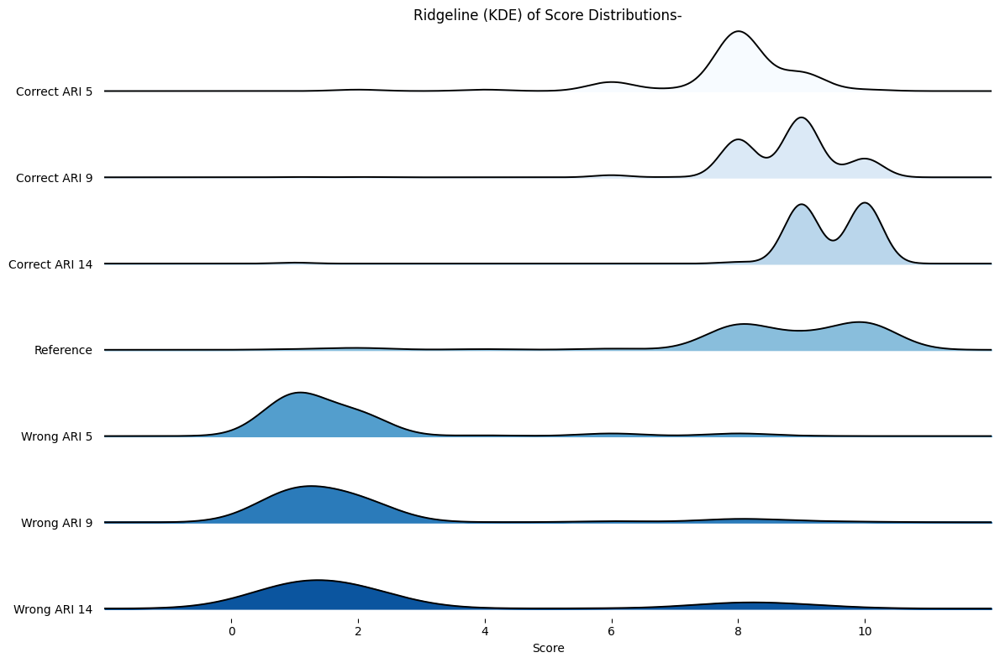

In [50]:
rank_file  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"  # <-- no trailing comma
score_file = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"          # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"")

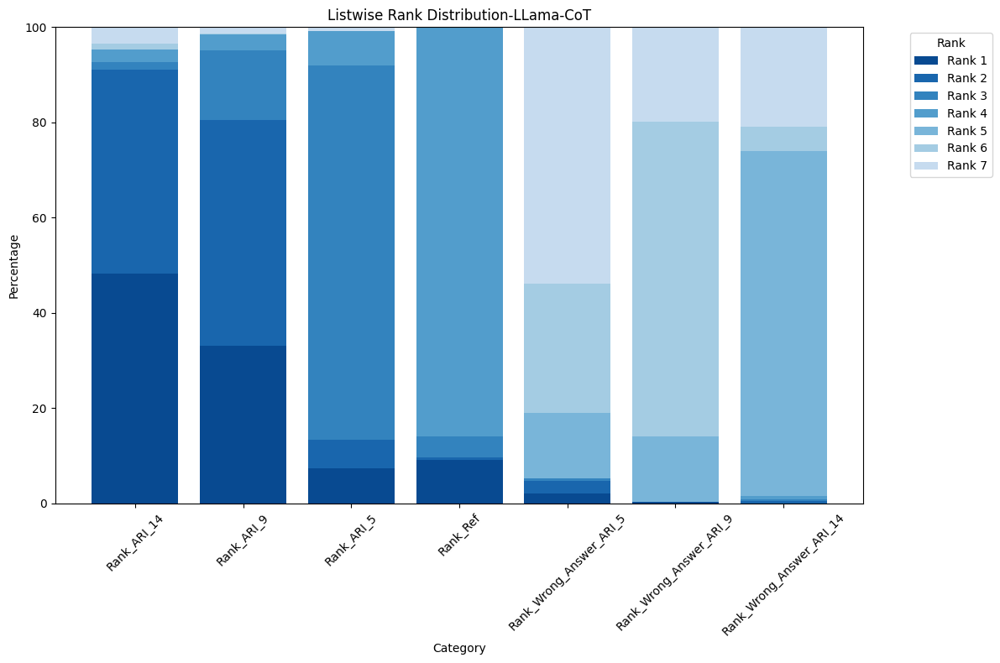

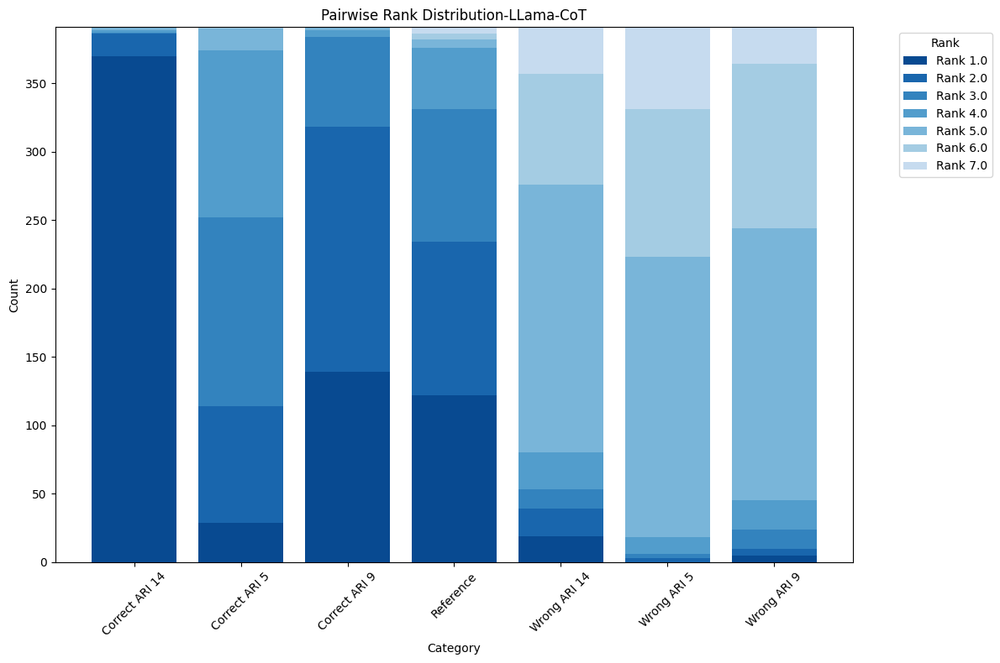

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


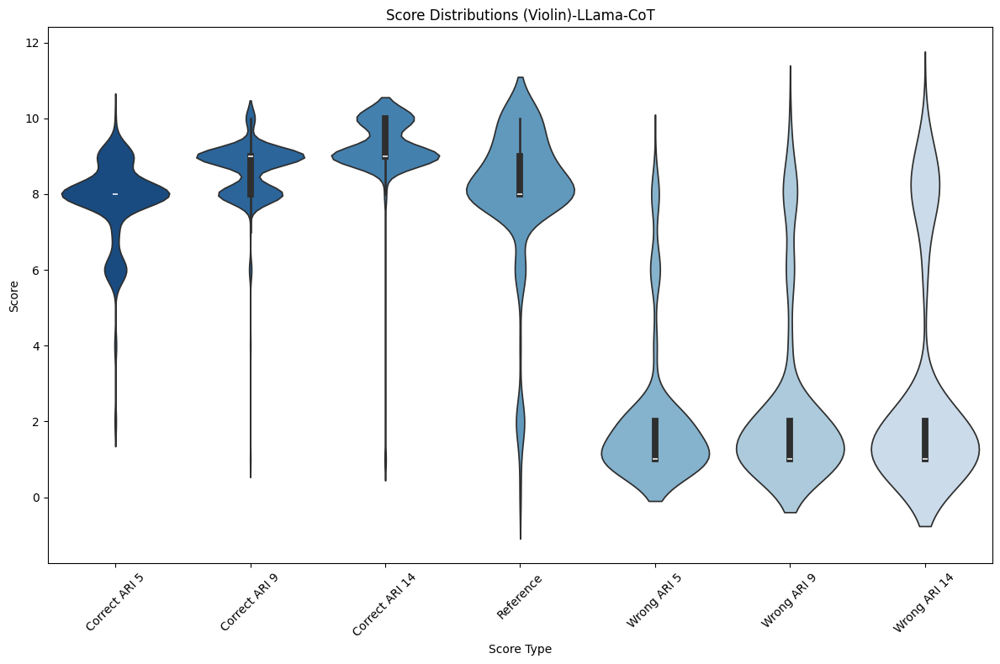

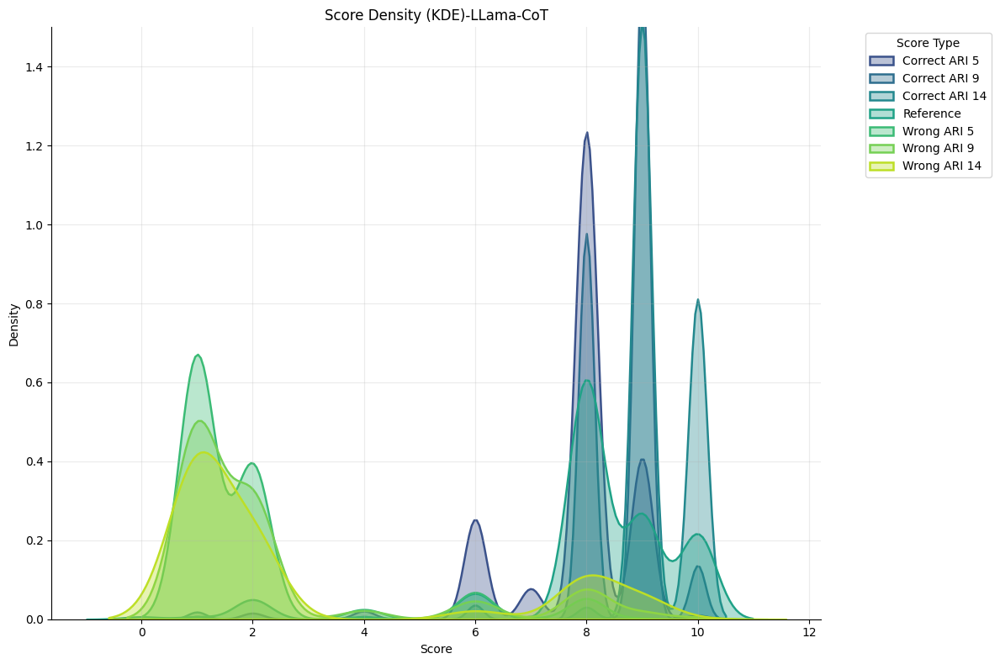

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

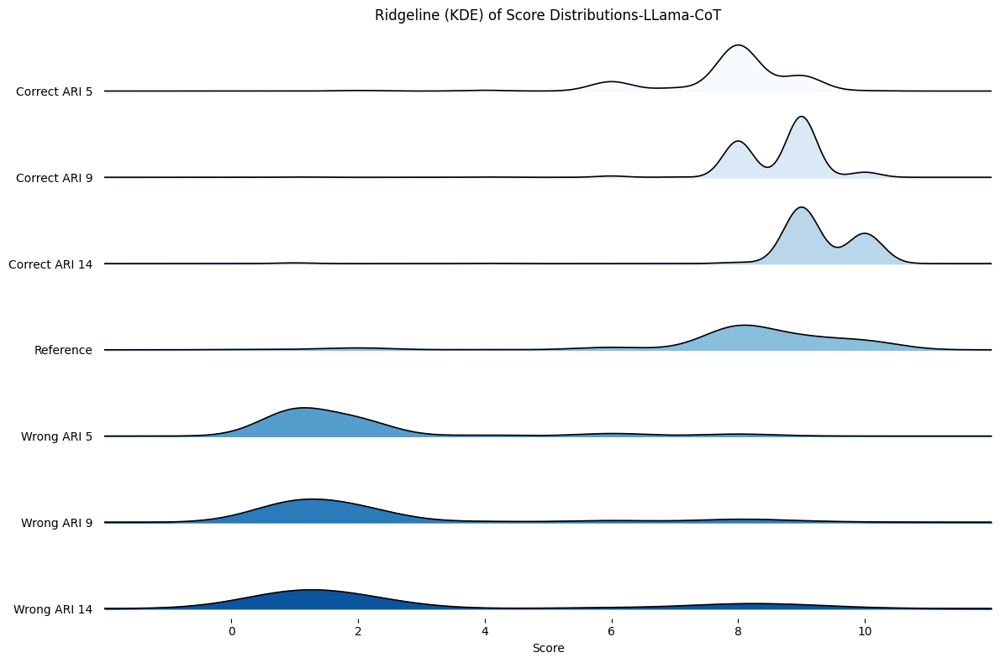

In [158]:
rank_file  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"  # <-- no trailing comma
score_file = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"          # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"LLama-CoT") 

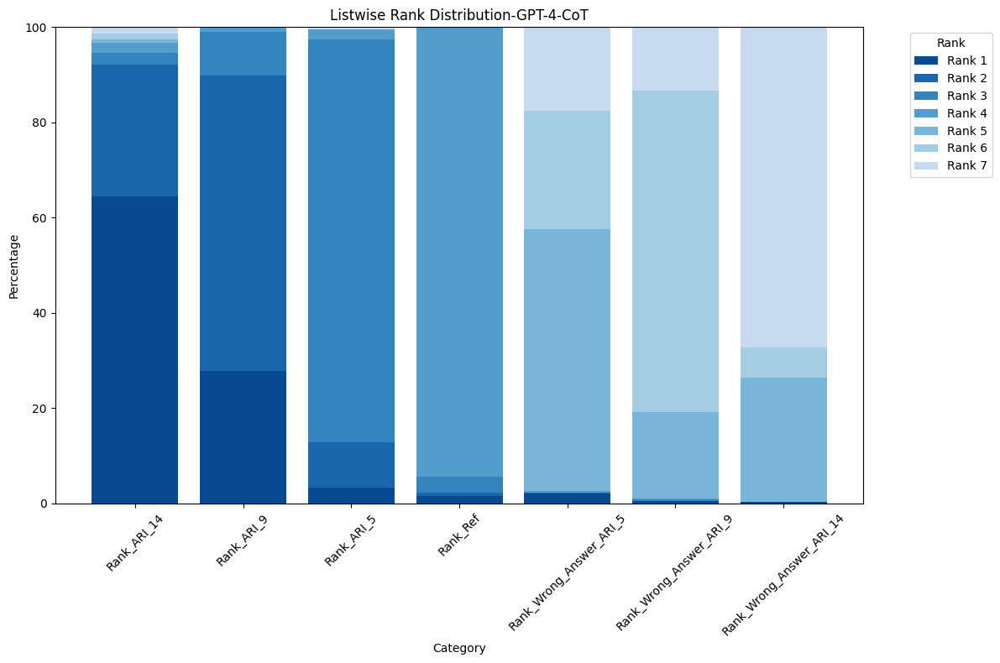

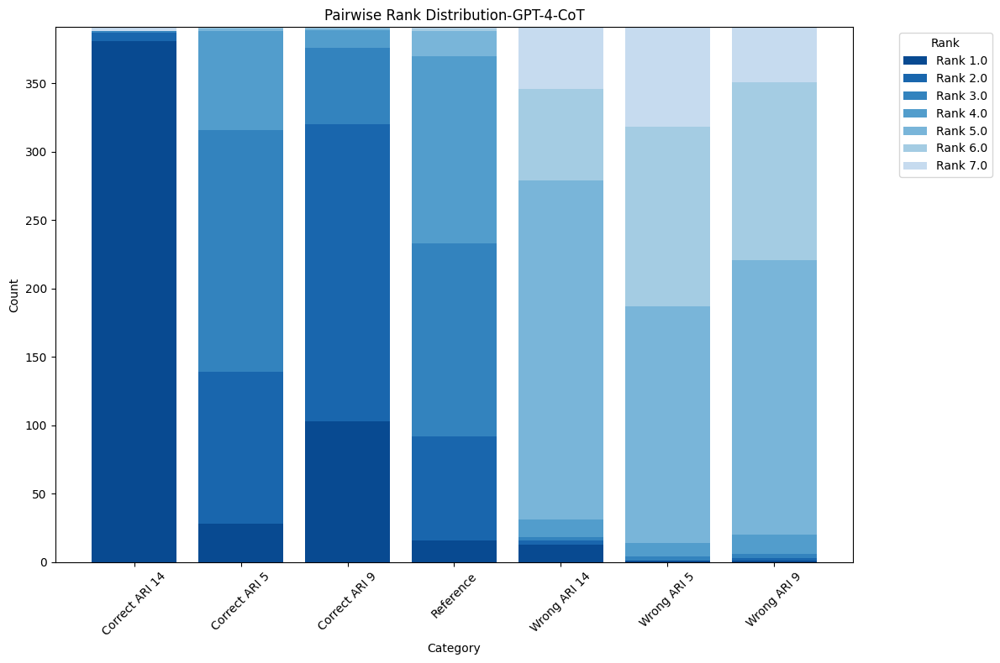

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


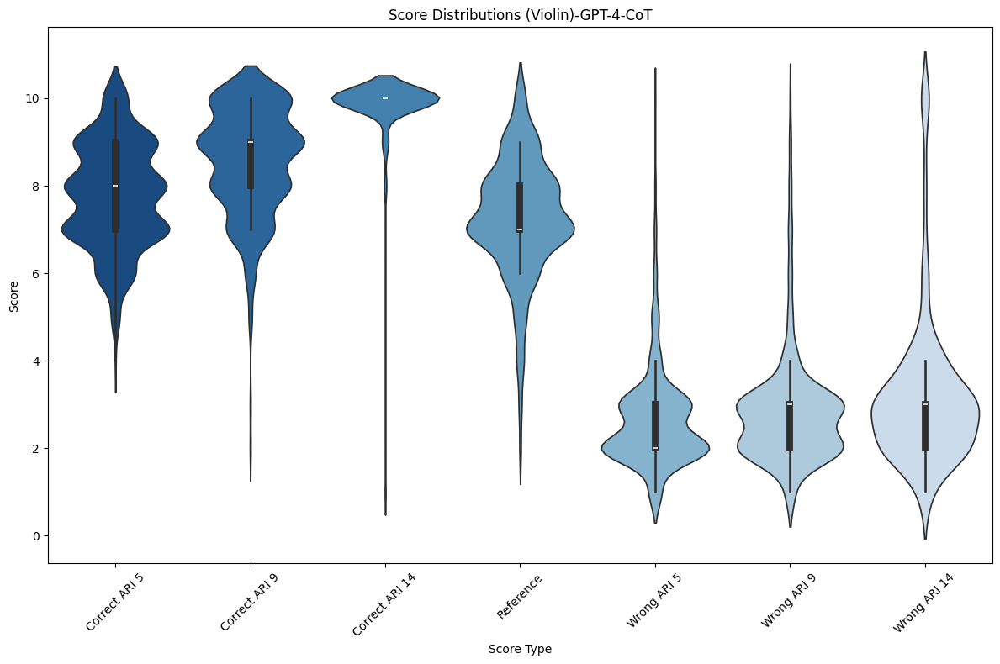

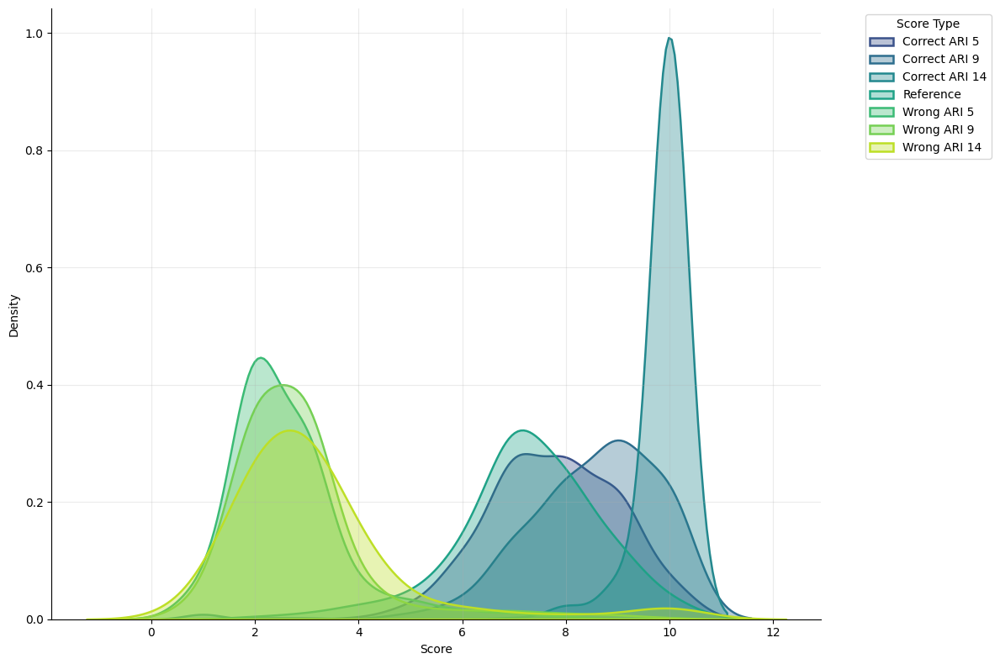

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

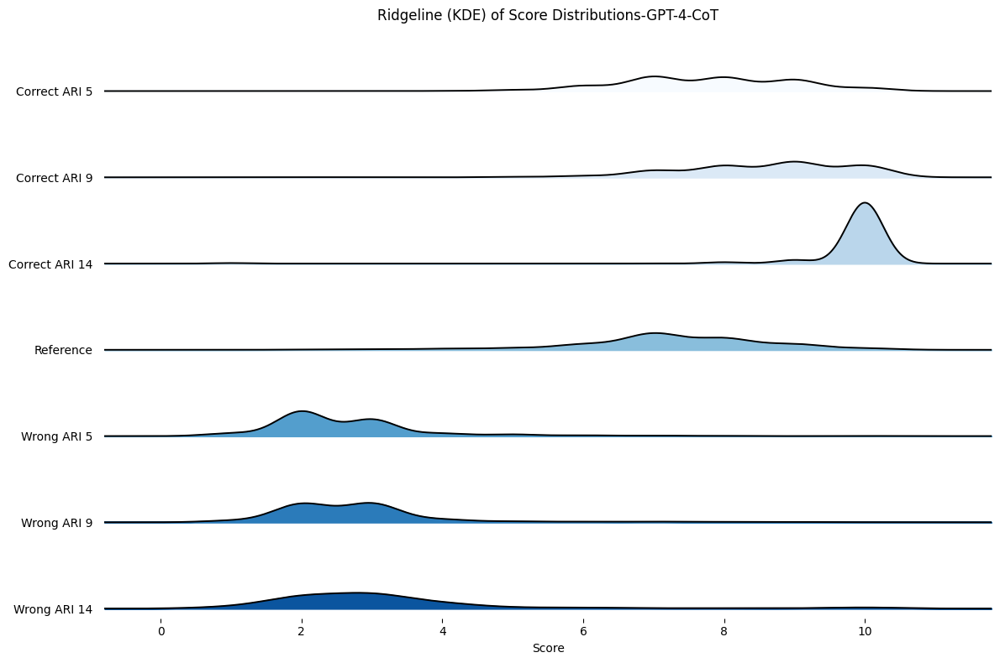

In [37]:
rank_file  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
score_file = "../resultFiles/GPT4/Default/Score/filtered_all_score_cot.csv"

plot_trend_graphs(score_file, rank_file,"GPT-4-CoT")

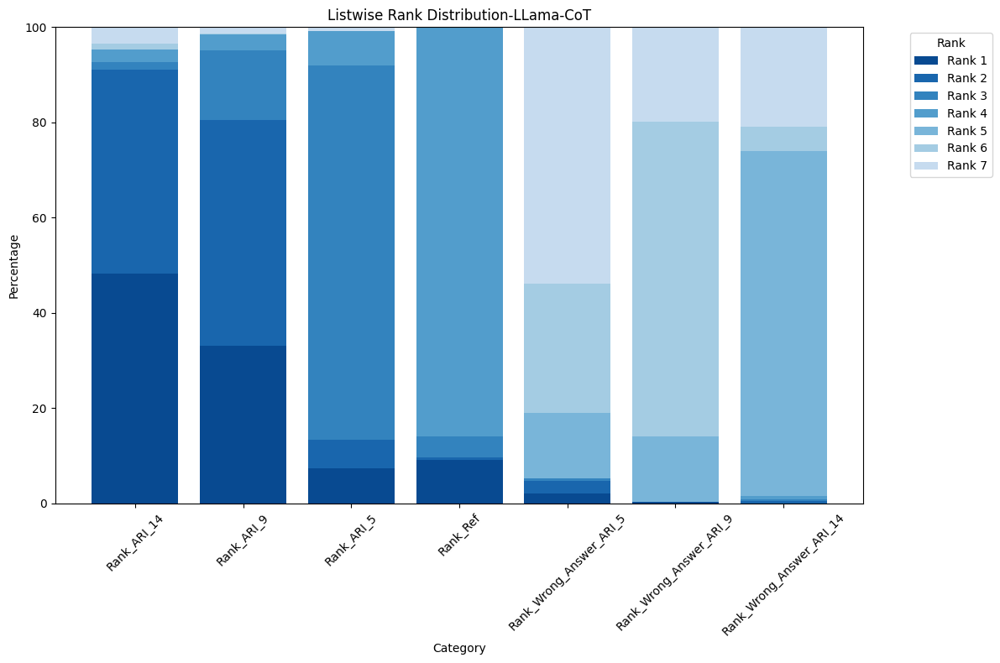

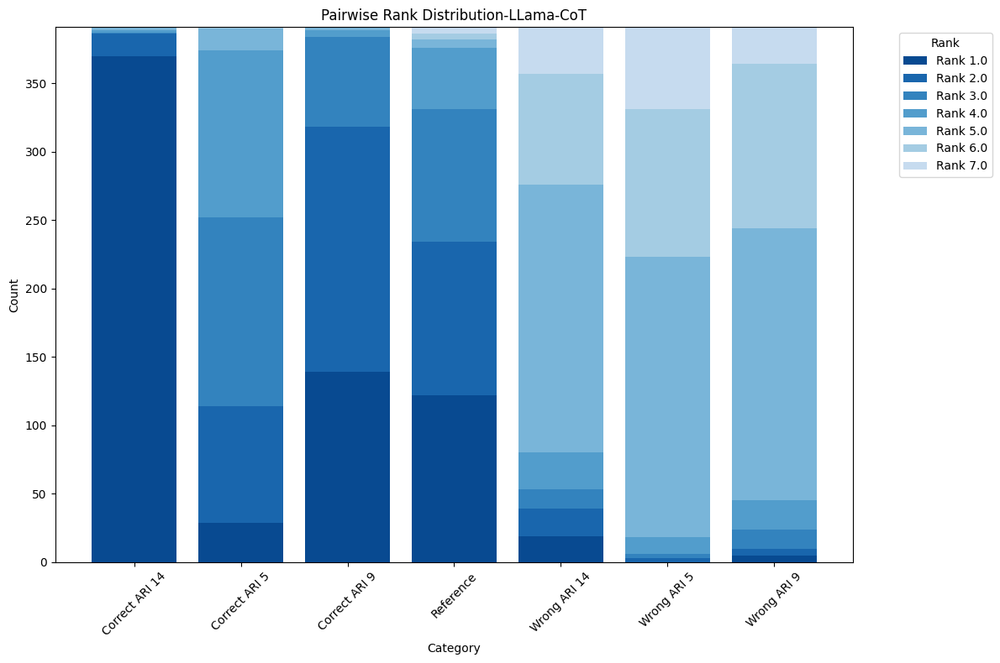

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


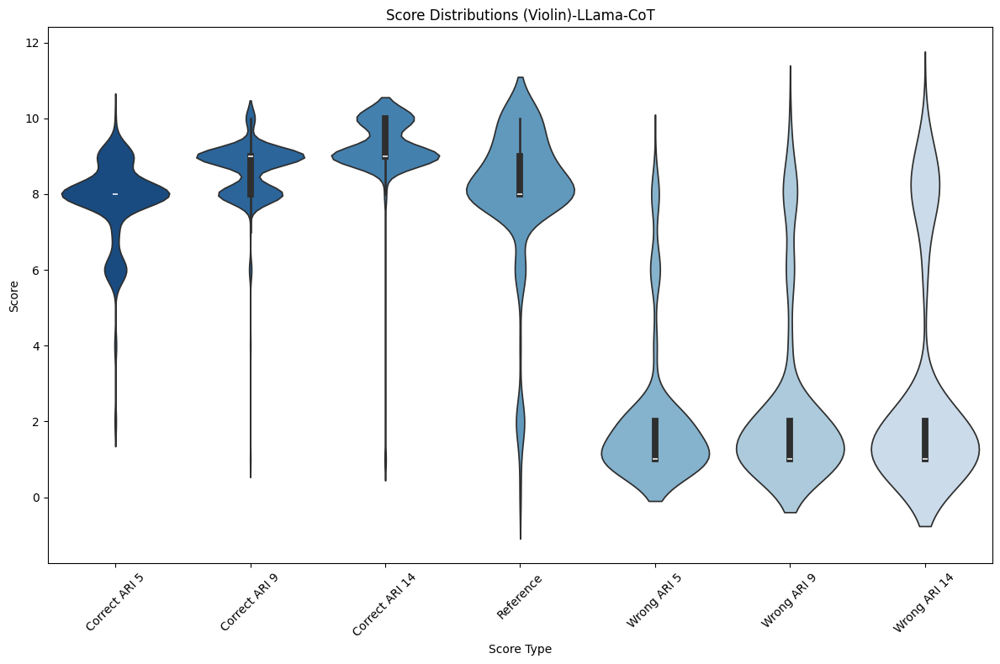

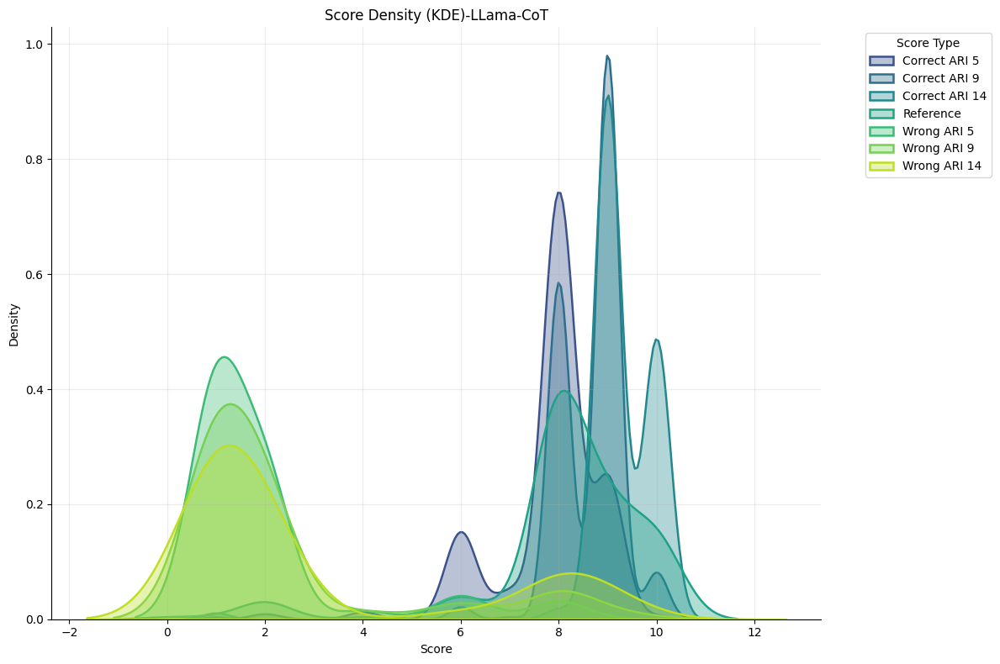

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

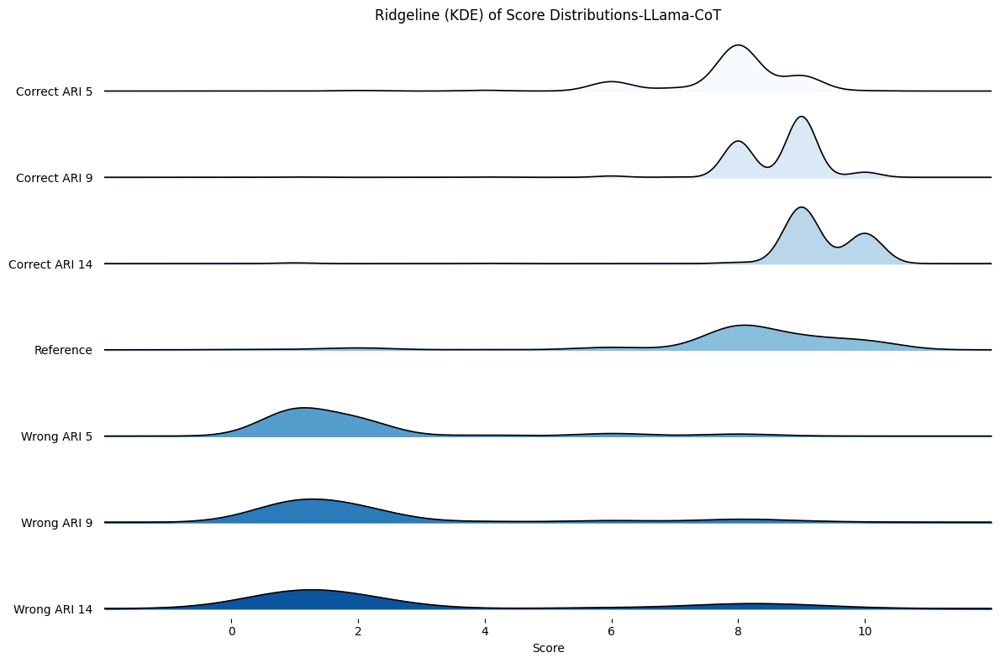

In [121]:
rank_file  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"  # <-- no trailing comma
score_file = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"          # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"LLama-CoT") 

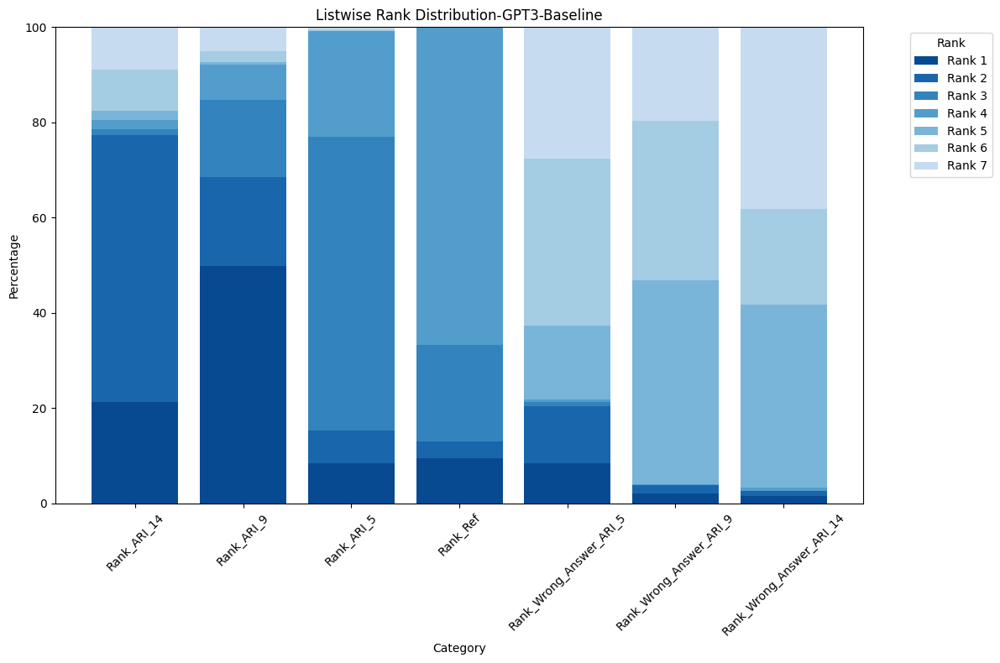

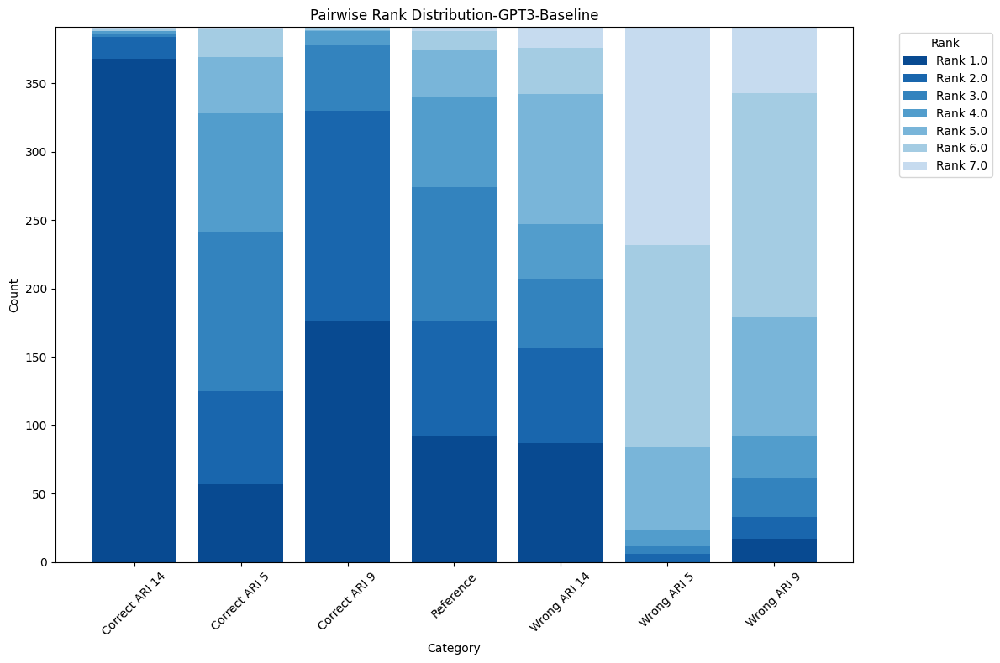

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


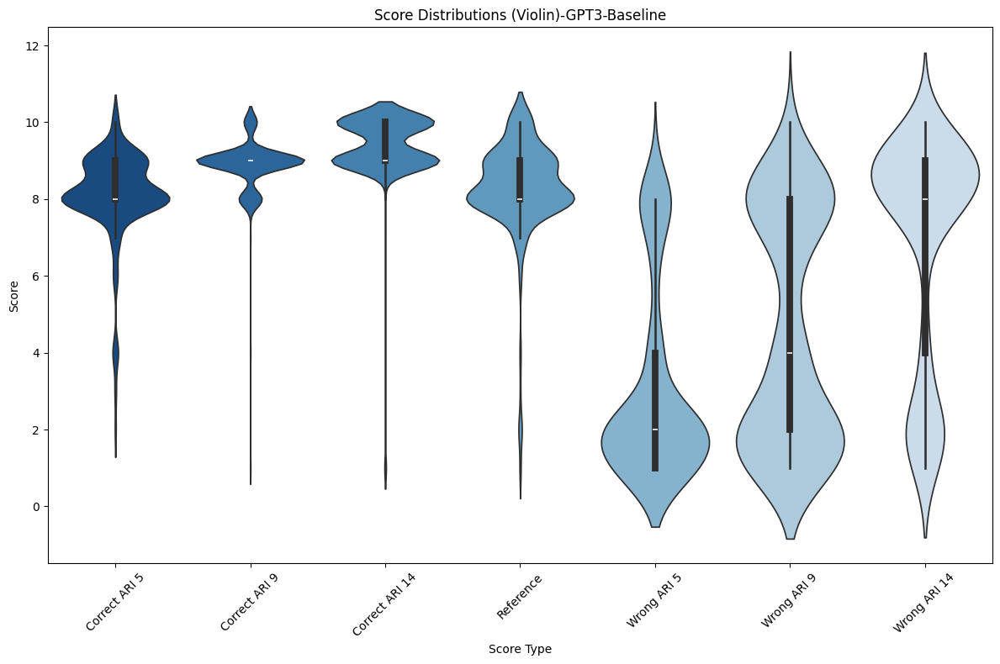

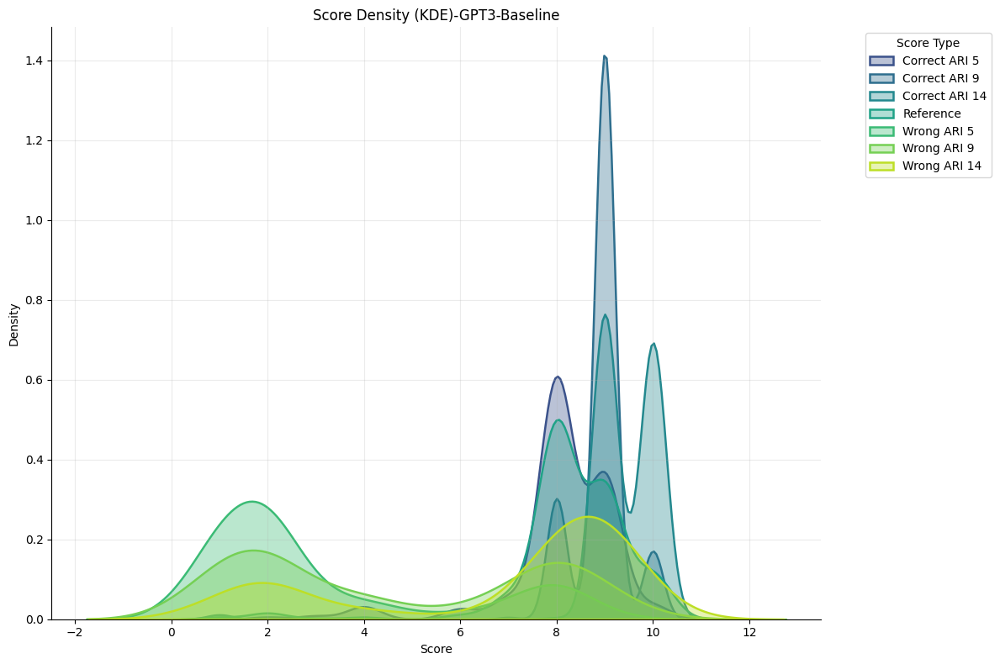

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

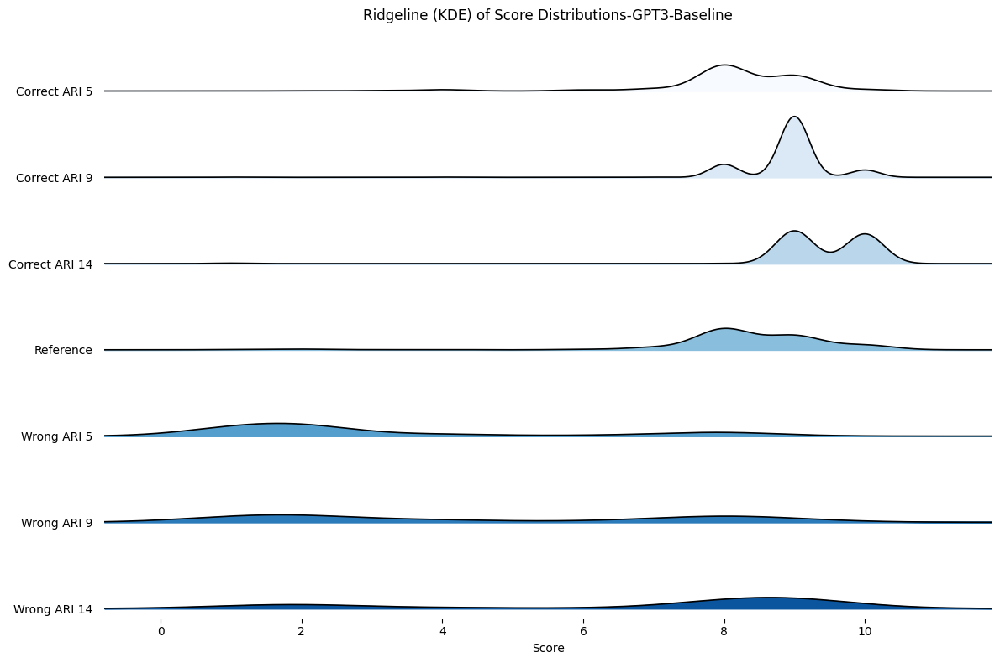

In [122]:
rank_file  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv" 
# thesis_project\resultFiles\GPT3\Default\Rank\gpt3_judge_rank_baseline1.csv # <-- no trailing comma
score_file = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv "      
# thesis_project\resultFiles\GPT3\Default\Score\gpt3_judge_score_baseline.csv    # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"GPT3-Baseline")  # or: plot_trend_graphs(score_file=score_file, rank_file=rank_file)

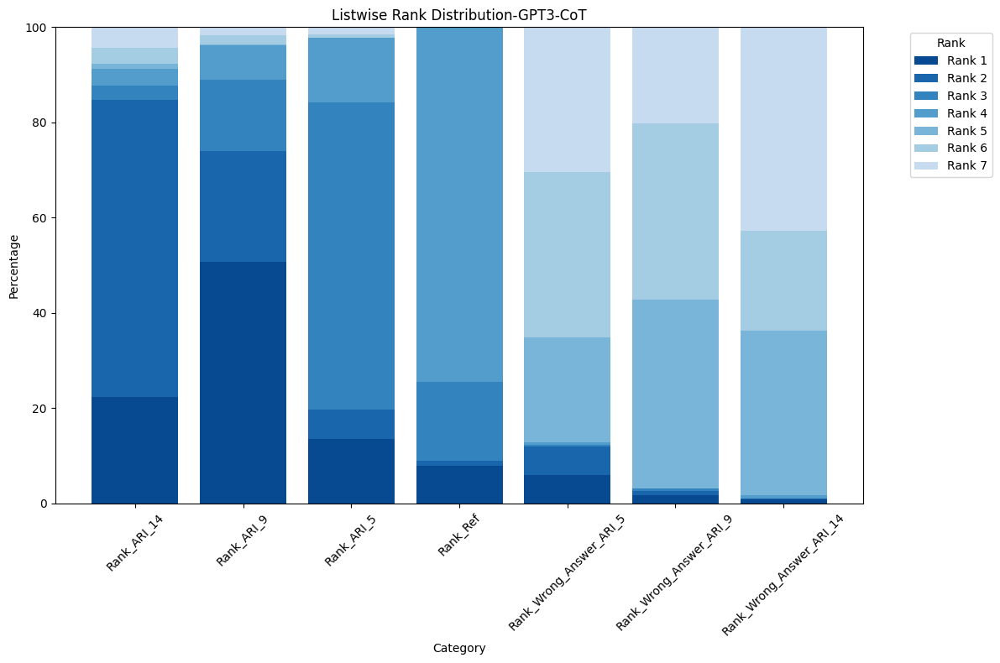

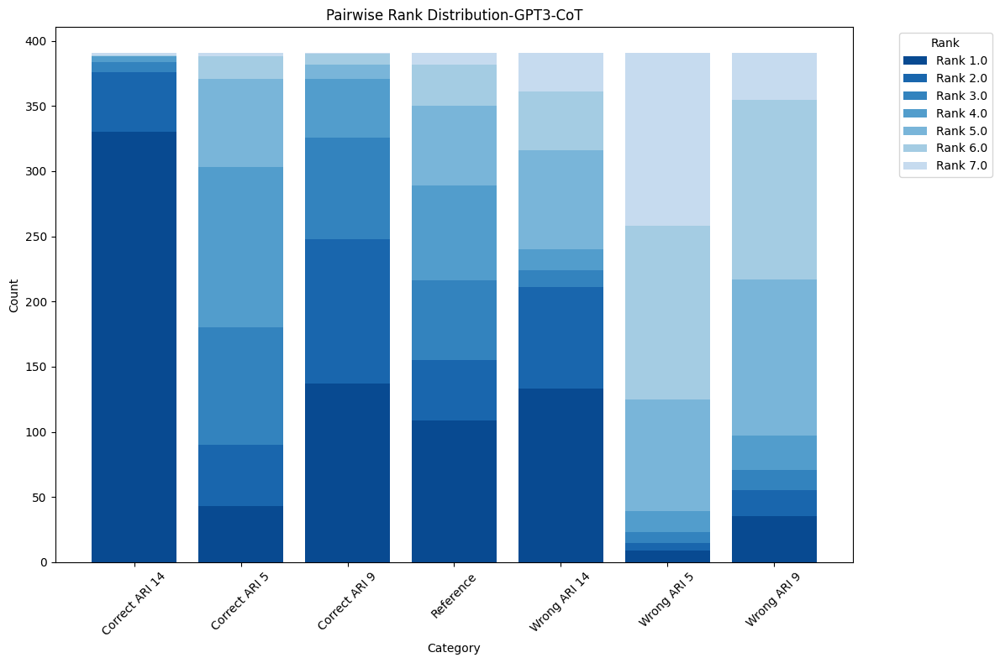

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


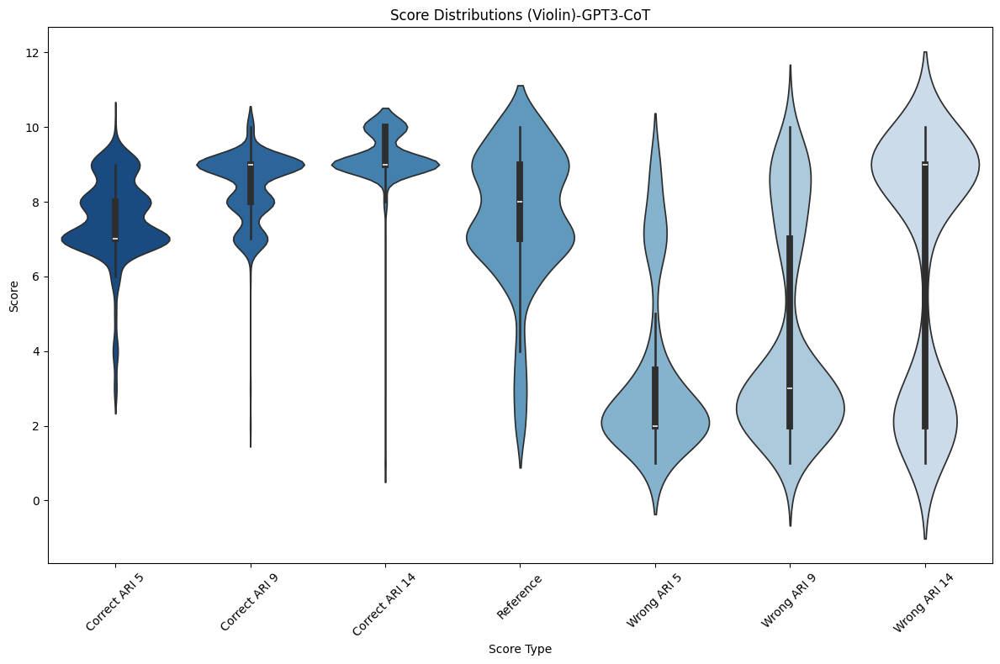

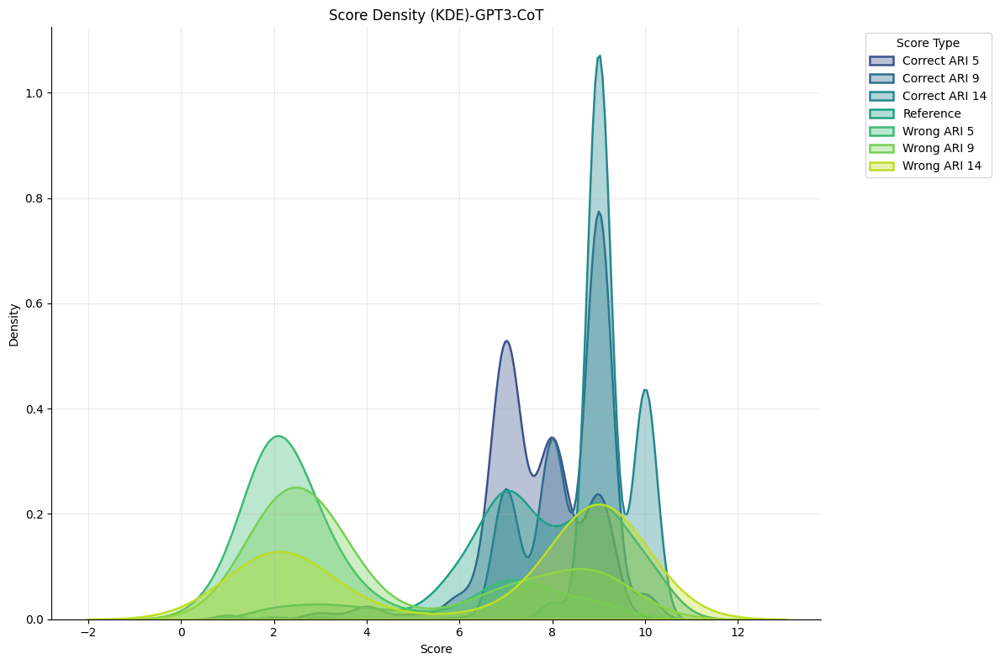

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

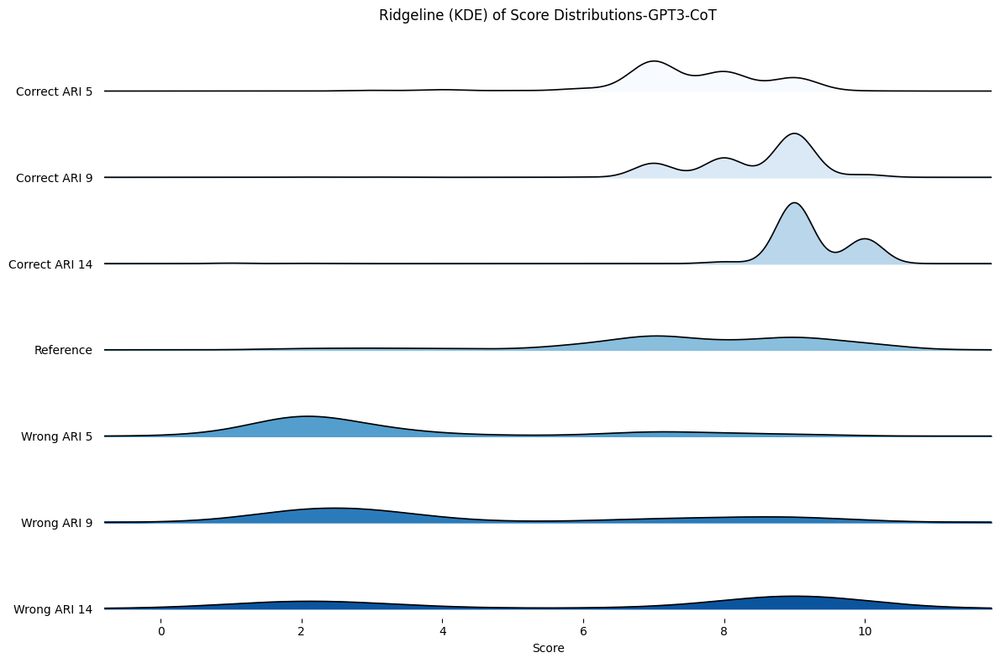

In [123]:
rank_file  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv" 
# thesis_project\resultFiles\GPT3\Default\Rank\gpt3_judge_rank_baseline1.csv # <-- no trailing comma
score_file = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv "      
# thesis_project\resultFiles\GPT3\Default\Score\gpt3_judge_score_baseline.csv    # <-- no trailing comma
plot_trend_graphs(score_file, rank_file,"GPT3-CoT")

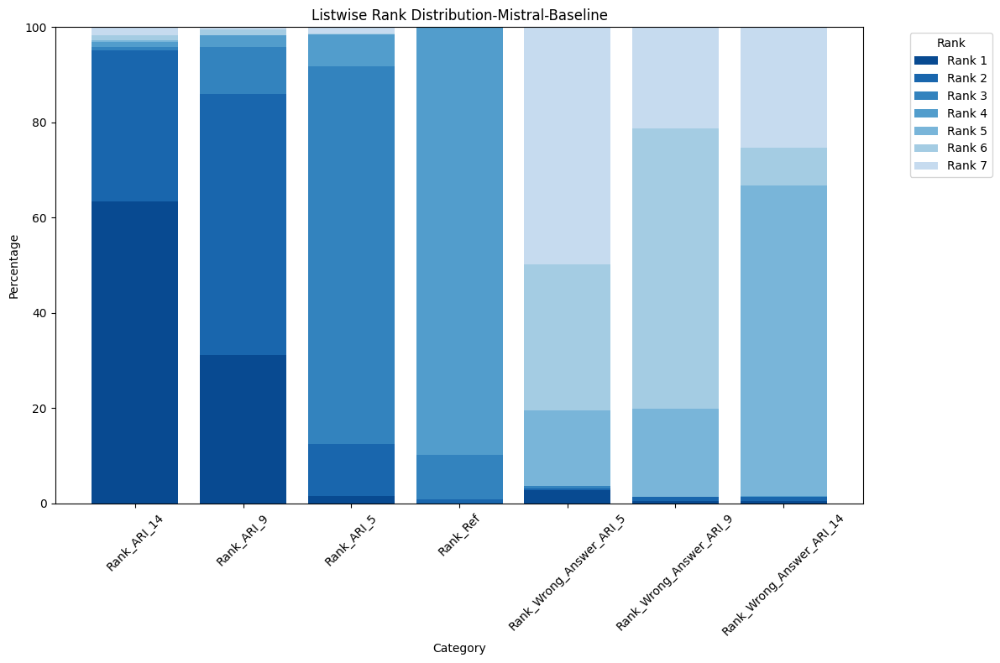

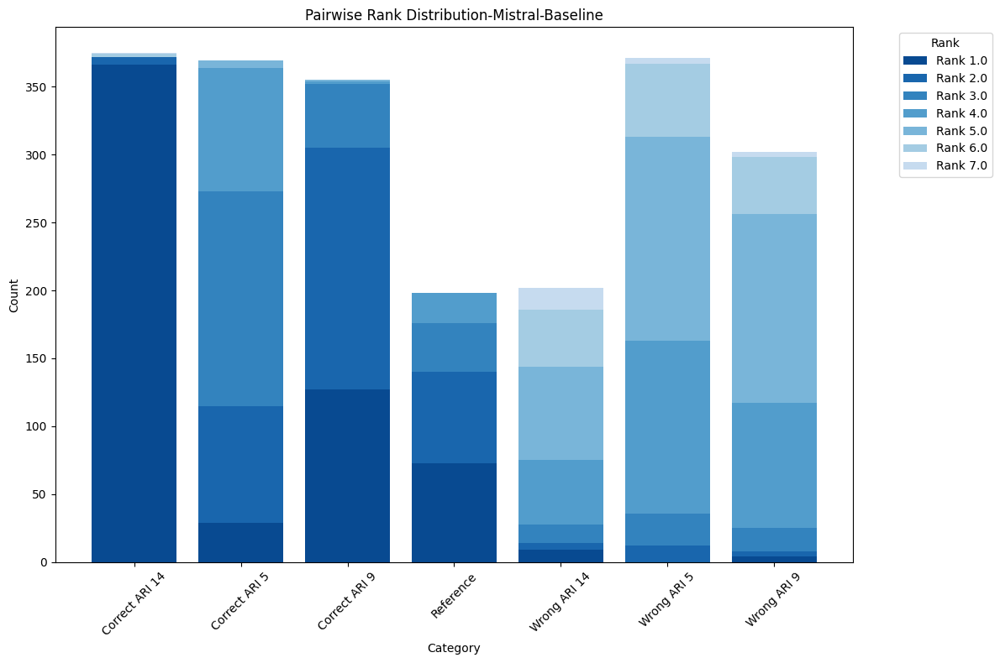

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


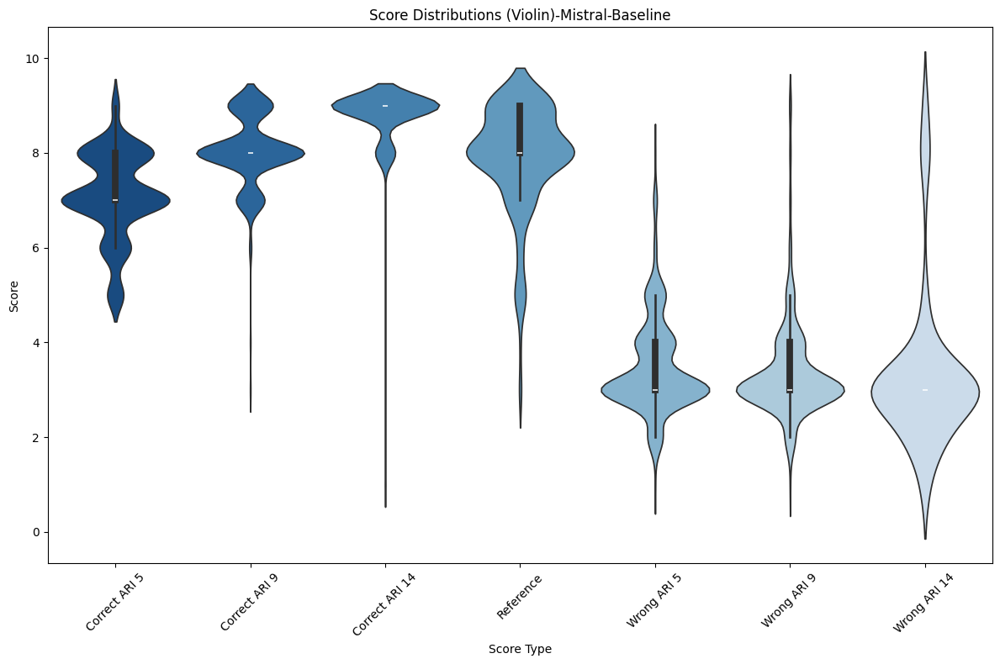

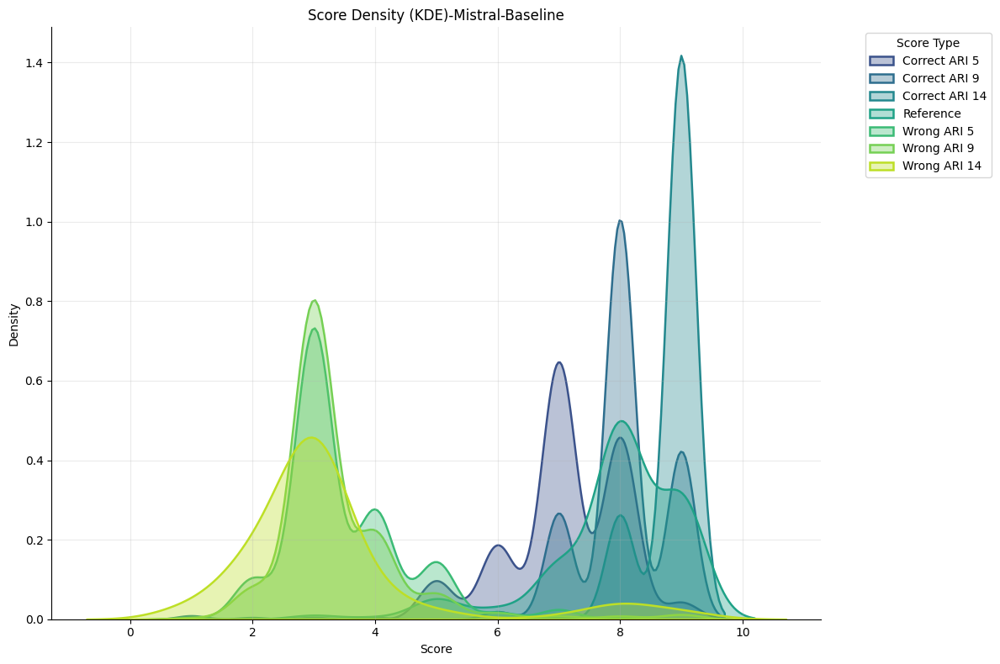

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

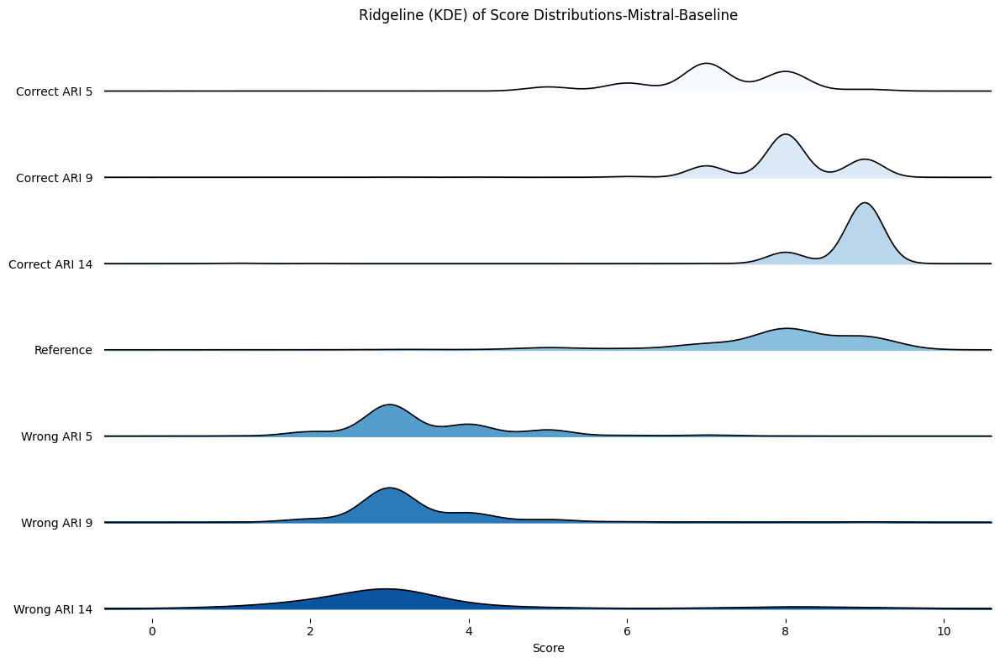

In [124]:
rank_file  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv" 
score_file = "../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv "      
plot_trend_graphs(score_file, rank_file,"Mistral-Baseline")

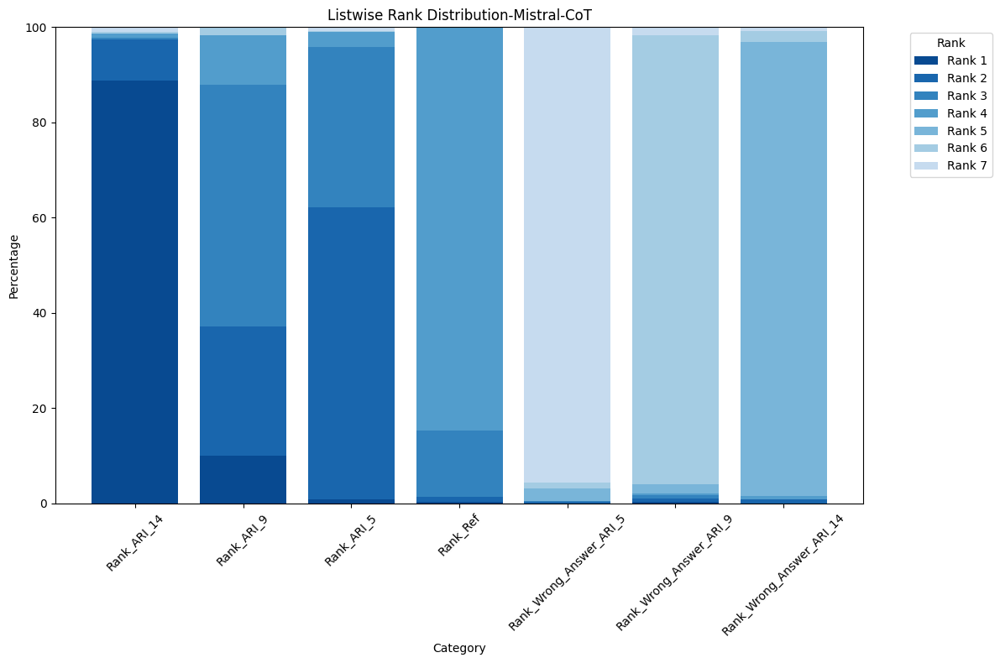

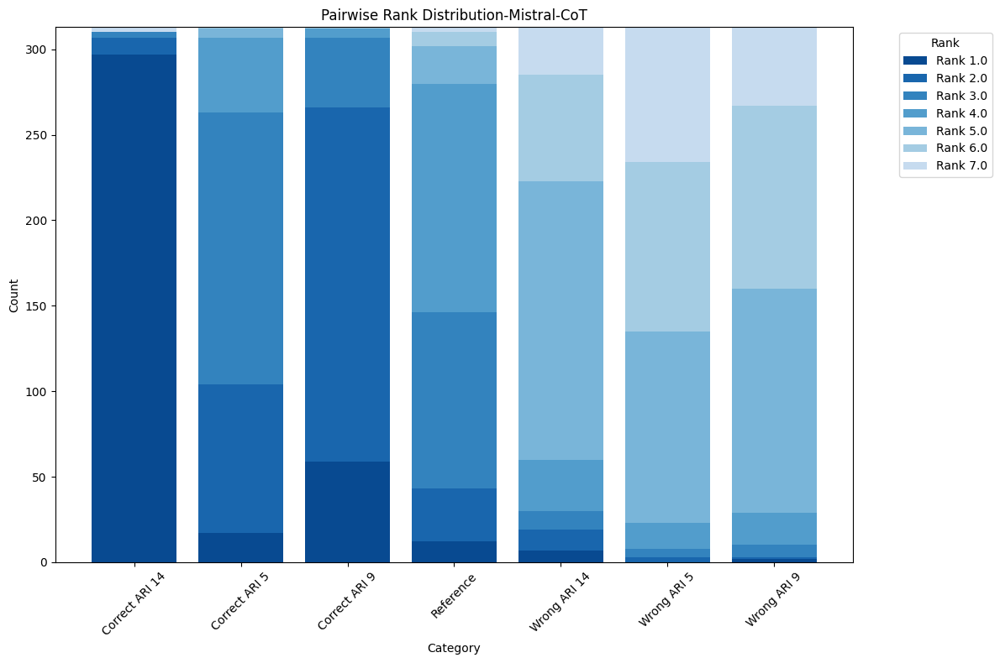

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


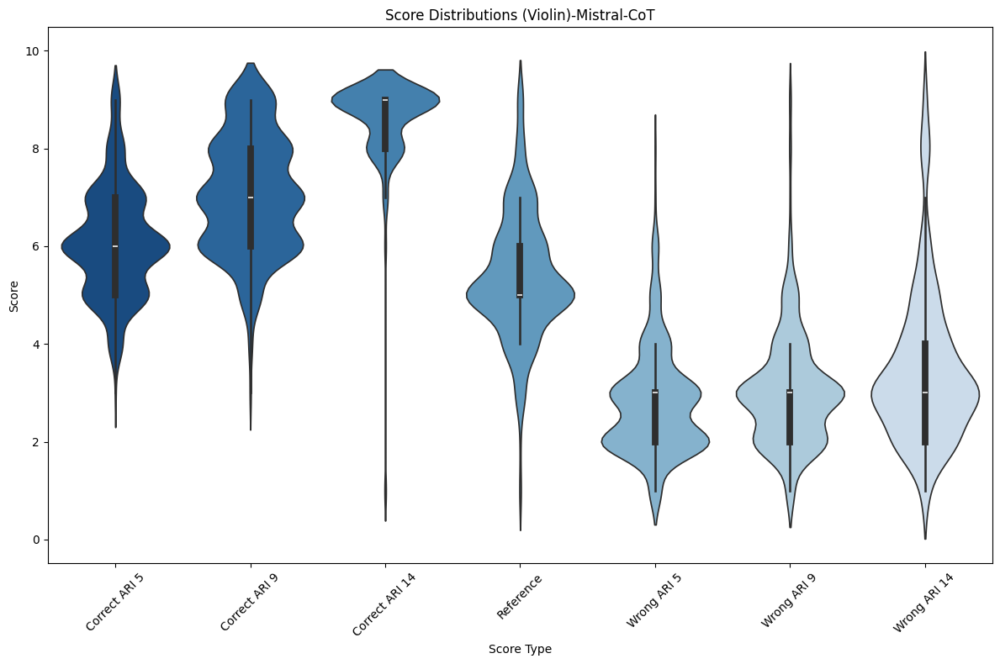

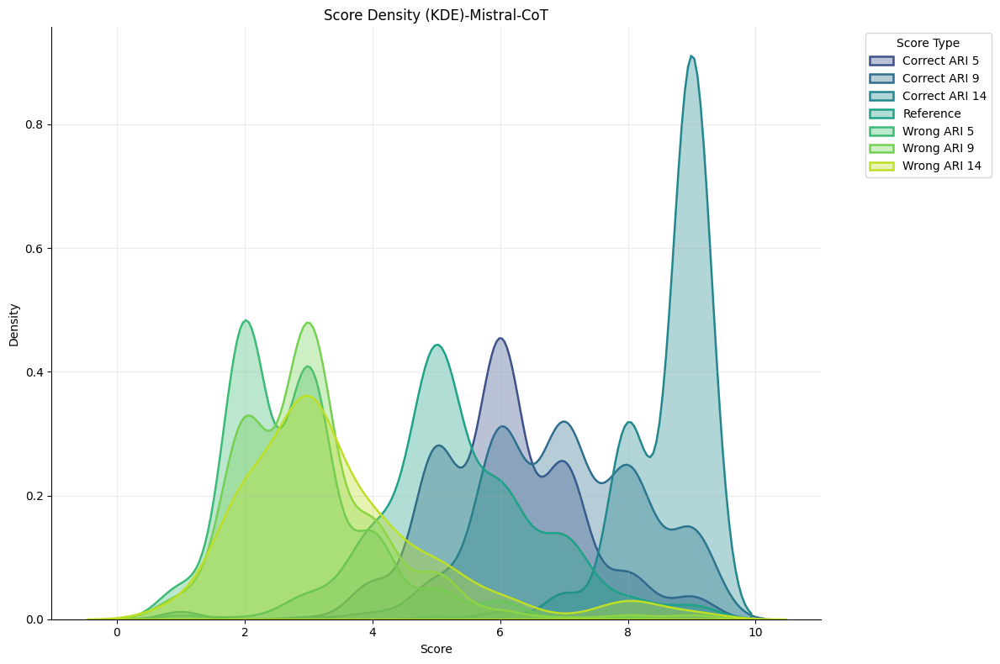

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

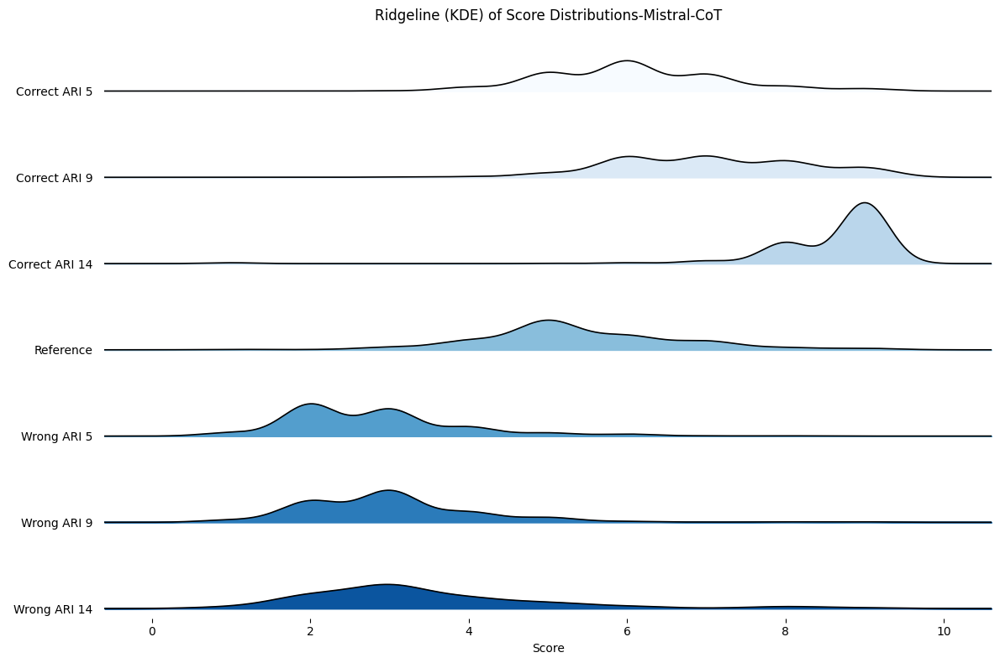

In [125]:
rank_file  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv" 
score_file = "../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv "      
plot_trend_graphs(score_file, rank_file,"Mistral-CoT")

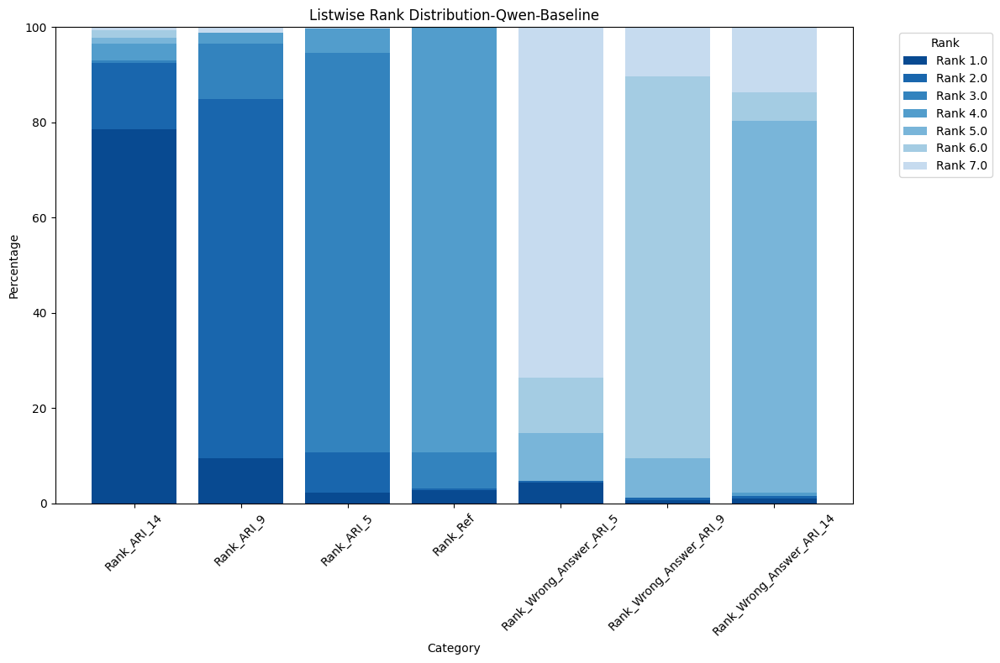

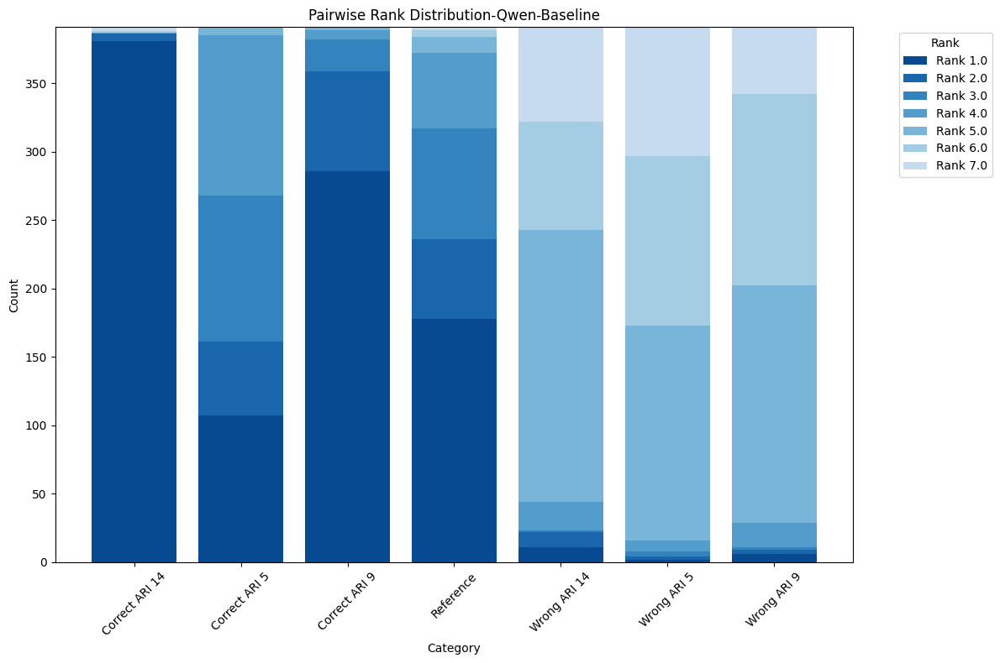

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


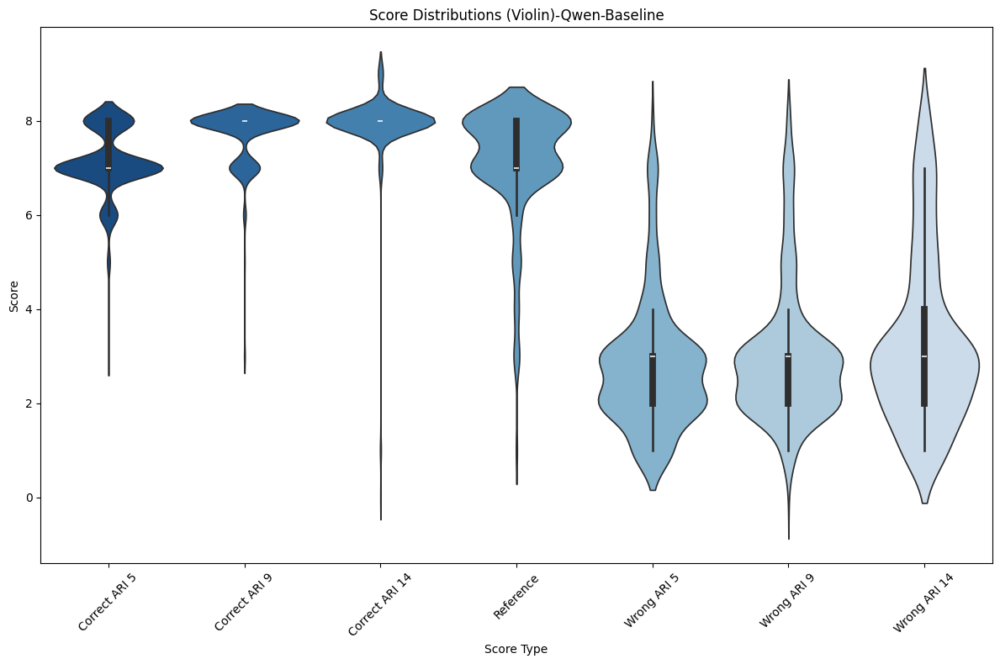

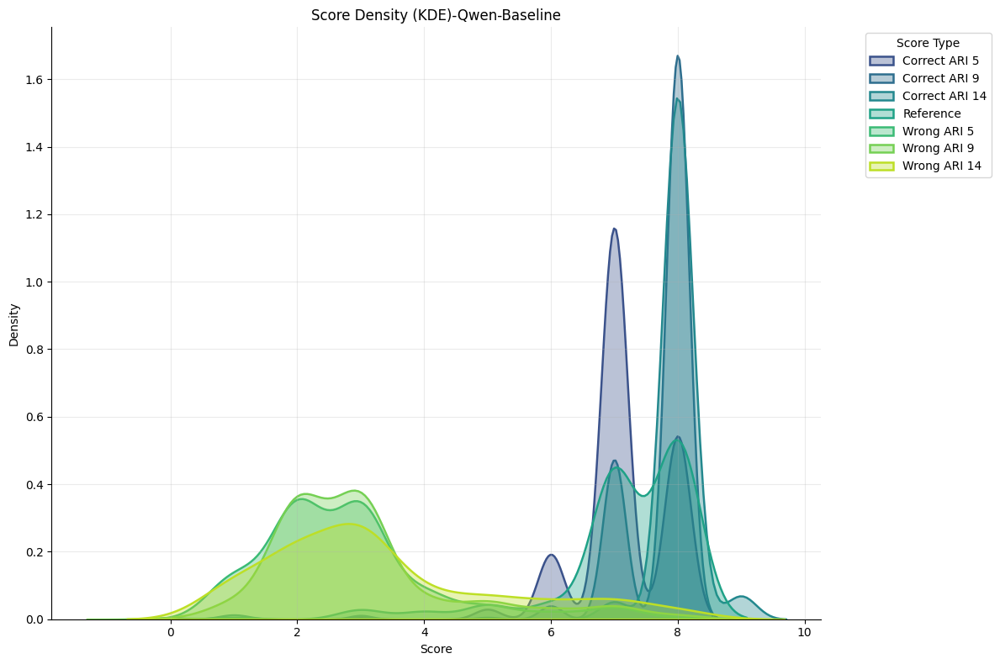

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

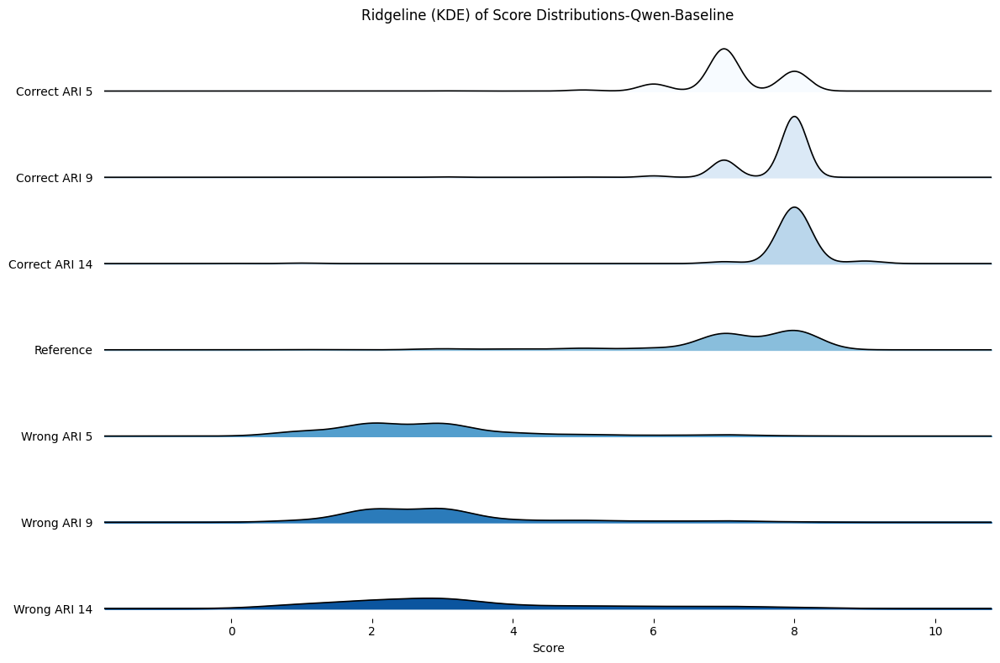

In [126]:
rank_file  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv" 
score_file = "../resultFiles/Qwen/Default/Score/qwen32_score_baseline1.csv "      
plot_trend_graphs(score_file, rank_file,"Qwen-Baseline")

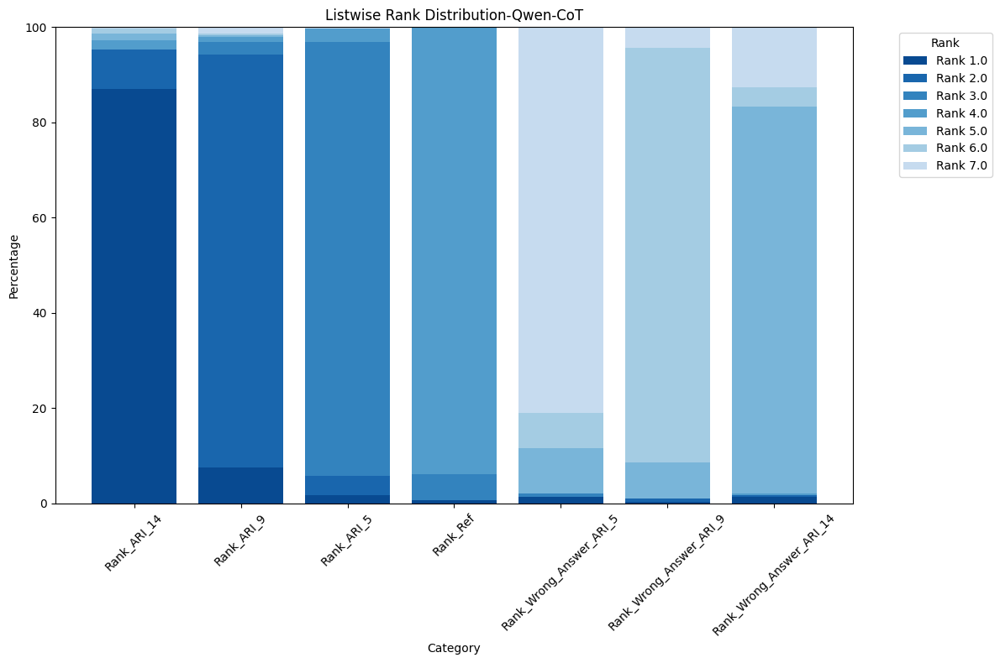

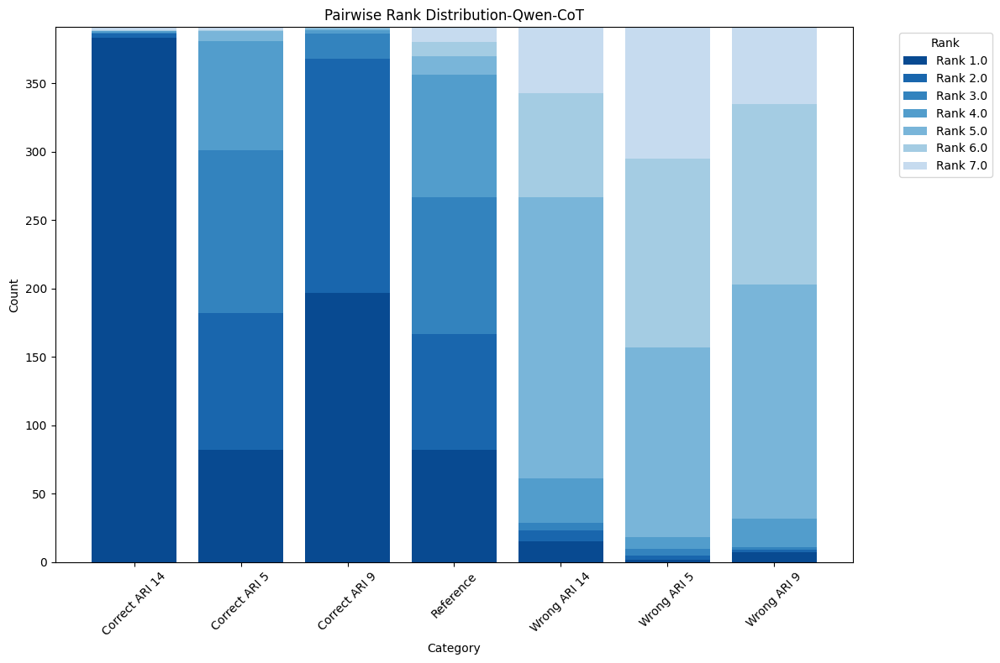

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


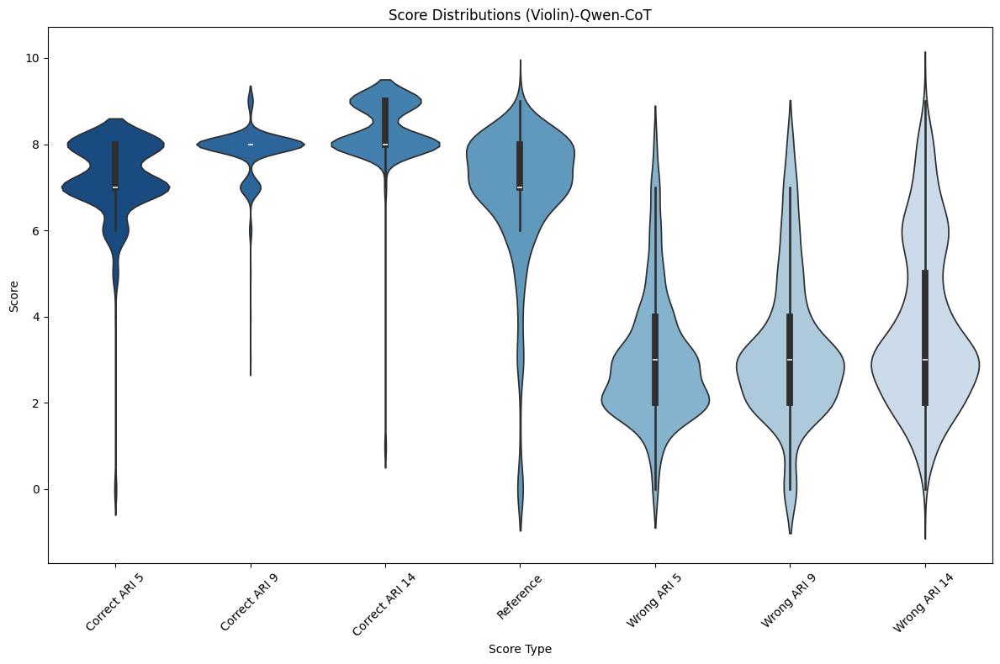

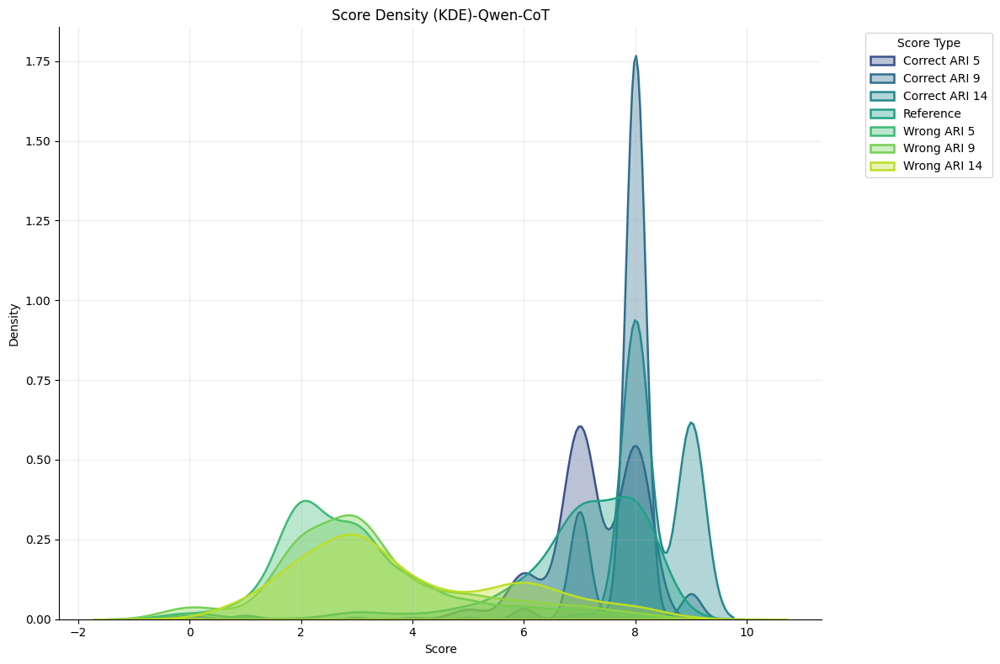

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

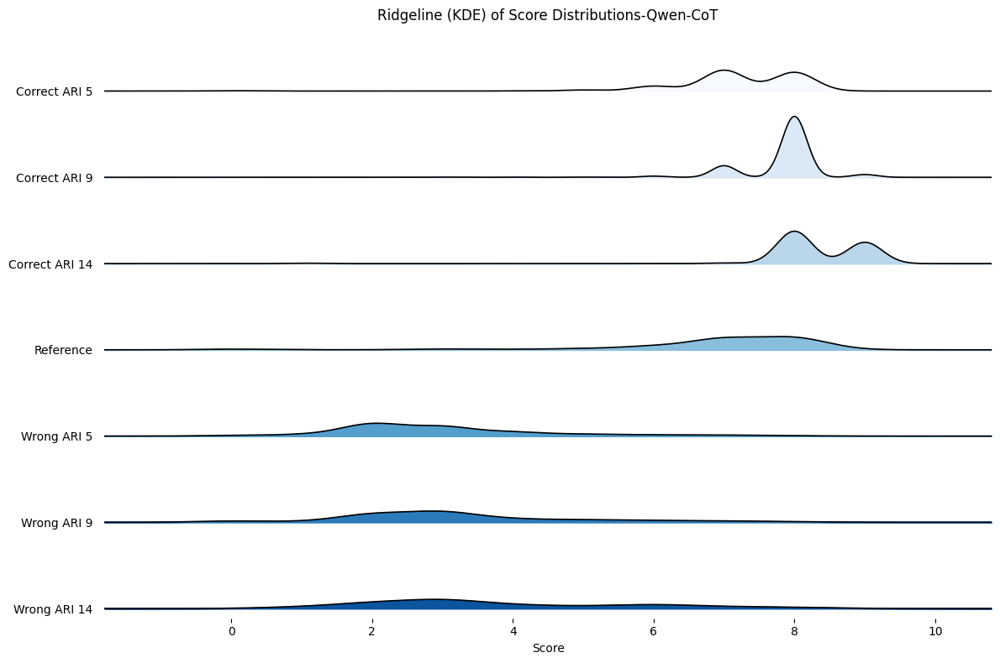

In [128]:
rank_file  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv" 
score_file = "../resultFiles/Qwen/Default/Score/qwen32_score_cot.csv "      
plot_trend_graphs(score_file, rank_file,"Qwen-CoT")

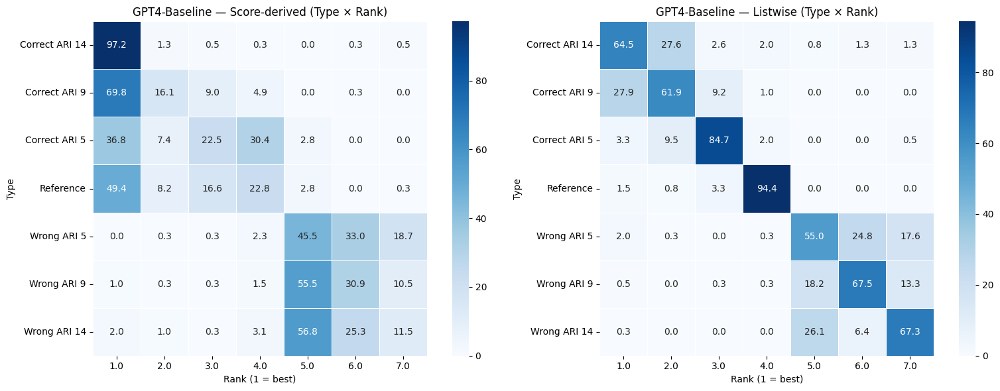

In [169]:
import pandas as pd

# --- 0) Load your dataframes ---
rank_file  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
score_file = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file)
score_df = pd.read_csv(score_file)

# --- 1) Define columns and label maps ---
score_cols = [
    "Score_ARI_14","Score_ARI_9","Score_ARI_5",
    "Score_Ref_Answer",
    "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"
]

score_rename = {
    "Score_ARI_14":"Correct ARI 14","Score_ARI_9":"Correct ARI 9","Score_ARI_5":"Correct ARI 5",
    "Score_Ref_Answer":"Reference",
    "Score_Wrong_Answer_ARI_14":"Wrong ARI 14","Score_Wrong_Answer_ARI_9":"Wrong ARI 9","Score_Wrong_Answer_ARI_5":"Wrong ARI 5"
}

rank_rename = {
    "Rank_ARI_14":"Correct ARI 14","Rank_ARI_9":"Correct ARI 9","Rank_ARI_5":"Correct ARI 5",
    "Rank_Ref":"Reference",
    "Rank_Wrong_Answer_ARI_14":"Wrong ARI 14","Rank_Wrong_Answer_ARI_9":"Wrong ARI 9","Rank_Wrong_Answer_ARI_5":"Wrong ARI 5"
}

row_labels_order = [
    "Correct ARI 14","Correct ARI 9","Correct ARI 5",
    "Reference","Wrong ARI 5","Wrong ARI 9","Wrong ARI 14"
]

# --- 2) (Re)define helpers if not already in your notebook ---
import numpy as np, seaborn as sns, matplotlib.pyplot as plt

def _ensure_rank_cols(mat, expected_ranks=7):
    for r in range(1, expected_ranks+1):
        if r not in mat.columns:
            mat[r] = 0
    return mat[sorted([c for c in mat.columns if isinstance(c, (int, float))])]

def _normalize(mat, how):
    if how is None: return mat.copy(), False
    d = mat.copy()
    if how == "row":
        d = d.div(d.sum(axis=1), axis=0).fillna(0)*100
    elif how == "col":
        d = d.div(d.sum(axis=0), axis=1).fillna(0)*100
    elif how == "all":
        tot = d.to_numpy().sum(); d = (d/tot*100) if tot else d
    else:
        raise ValueError("normalize must be None|'row'|'col'|'all'")
    return d, True

def plot_confusion(mat, title, *, normalize=None, cmap="Blues", ax=None):
    d, is_pct = _normalize(mat, normalize)
    fmt = ".1f" if is_pct else ".0f"
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    sns.heatmap(d, annot=True, fmt=fmt, cmap=cmap, cbar=True,
                linewidths=0.5, linecolor="white", square=True, ax=ax)
    ax.set_title(title); ax.set_xlabel("Rank (1 = best)"); ax.set_ylabel("Type")
    ax.set_xticklabels([str(c) for c in d.columns], rotation=0)
    ax.set_yticklabels(list(d.index), rotation=0)
    plt.tight_layout()
    return ax

def build_score_confusion_from_scores(score_df, score_cols, *, rename_map=None,
                                      rank_method="min", ascending=False, expected_ranks=7):
    rows = []
    for _, row in score_df[score_cols].iterrows():
        tmp = pd.DataFrame({"score_name": score_cols, "score_value": row.values})
        tmp["rank"] = tmp["score_value"].rank(method=rank_method, ascending=ascending)
        rows.append(tmp[["score_name","rank"]])
    long = pd.concat(rows, ignore_index=True)
    if rename_map:
        long["score_name"] = long["score_name"].map(rename_map).fillna(long["score_name"])
    mat = (long.groupby(["score_name","rank"]).size().reset_index(name="count")
               .pivot(index="score_name", columns="rank", values="count").fillna(0))
    return _ensure_rank_cols(mat, expected_ranks=expected_ranks)

# def build_rank_confusion_from_rankdf(rank_df, rank_cols=None, *, rename_map=None, expected_ranks=7):
#     if rank_cols is None:
#         rank_cols = [c for c in rank_df.columns if "Rank" in c]
#     melted = rank_df[rank_cols].melt(var_name="rank_col", value_name="rank_val")
#     if rename_map:
#         melted["rank_col"] = melted["rank_col"].map(rename_map).fillna(melted["rank_col"])
#     mat = (melted.groupby(["rank_col","rank_val"]).size().reset_index(name="count")
#                .pivot(index="rank_col", columns="rank_val", values="count").fillna(0))
#     return _ensure_rank_cols(mat, expected_ranks=expected_ranks)

def build_rank_confusion_from_rankdf(rank_df, rank_cols=None, *, rename_map=None, expected_ranks=7):
    if rank_cols is None:
        rank_cols = [c for c in rank_df.columns if c.startswith("Rank_")]

    d = rank_df[rank_cols].copy()

    # Coerce to numeric, drop rows with any NaN in rank columns
    for c in d.columns:
        d[c] = pd.to_numeric(d[c], errors="coerce")
    d = d.dropna(how="any")

    # Cast to int
    d = d.astype(int)

    # Melt
    melted = d.melt(var_name="rank_col", value_name="rank_val")

    # Optional rename map (types)
    if rename_map:
        melted["rank_col"] = melted["rank_col"].map(rename_map).fillna(melted["rank_col"])

    # Sanity: ranks must be within 1..expected_ranks
    bad = ~melted["rank_val"].between(1, expected_ranks)
    if bad.any():
        bad_vals = melted.loc[bad, "rank_val"].unique().tolist()
        raise ValueError(f"Ranks outside 1..{expected_ranks}: {bad_vals}")

    # Pivot to matrix
    mat = (melted.groupby(["rank_col", "rank_val"]).size()
                 .unstack(fill_value=0))

    # Ensure all rank columns 1..K exist and in order
    for k in range(1, expected_ranks + 1):
        if k not in mat.columns:
            mat[k] = 0
    mat = mat[sorted(mat.columns)]
    return mat


def plot_both_confusions(
    cm_score, cm_rank, *,
    model,                          # <-- non-default keyword-only comes first
    normalize="row",
    row_labels_order=None,
    col_labels_order=None,          # optional explicit column (rank) order
    cmap="Blues",
):
    """
    Side-by-side heatmaps for score-derived vs listwise rank confusions.
    - Ensures rows (types) and columns (ranks) are aligned across both plots.
    - Keeps a consistent ordering for fair visual comparison.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    A, B = cm_score.copy(), cm_rank.copy()

    # Optional: enforce row order (types)
    if row_labels_order is not None:
        A = A.reindex(row_labels_order)
        B = B.reindex(row_labels_order)

    # Optional: enforce column order (ranks)
    if col_labels_order is None:
        # default: sorted union of columns (use numeric sort if possible)
        try:
            col_labels_order = sorted(set(A.columns) | set(B.columns), key=int)
        except Exception:
            col_labels_order = sorted(set(A.columns) | set(B.columns))

    A = A.reindex(columns=col_labels_order)
    B = B.reindex(columns=col_labels_order)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    plot_confusion(
        A,
        title=f"{model} — Score-derived (Type × Rank)",
        normalize=normalize,
        cmap=cmap,
        ax=axes[0],
    )
    plot_confusion(
        B,
        title=f"{model} — Listwise (Type × Rank)",
        normalize=normalize,
        cmap=cmap,
        ax=axes[1],
    )
    fig.tight_layout()
    plt.show()


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT4-Baseline")


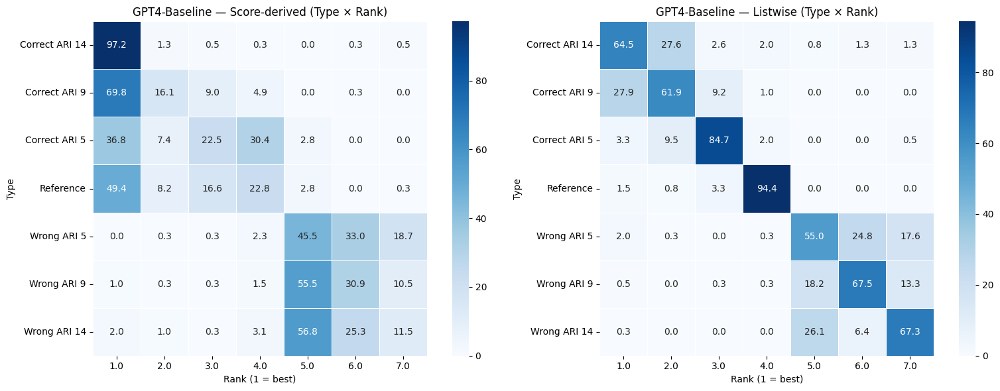

In [63]:
import pandas as pd

# --- 0) Load your dataframes ---
rank_file  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
score_file = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file)
score_df = pd.read_csv(score_file)

# --- 1) Define columns and label maps ---
score_cols = [
    "Score_ARI_14","Score_ARI_9","Score_ARI_5",
    "Score_Ref_Answer",
    "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"
]

score_rename = {
    "Score_ARI_14":"Correct ARI 14","Score_ARI_9":"Correct ARI 9","Score_ARI_5":"Correct ARI 5",
    "Score_Ref_Answer":"Reference",
    "Score_Wrong_Answer_ARI_14":"Wrong ARI 14","Score_Wrong_Answer_ARI_9":"Wrong ARI 9","Score_Wrong_Answer_ARI_5":"Wrong ARI 5"
}

rank_rename = {
    "Rank_ARI_14":"Correct ARI 14","Rank_ARI_9":"Correct ARI 9","Rank_ARI_5":"Correct ARI 5",
    "Rank_Ref":"Reference",
    "Rank_Wrong_Answer_ARI_14":"Wrong ARI 14","Rank_Wrong_Answer_ARI_9":"Wrong ARI 9","Rank_Wrong_Answer_ARI_5":"Wrong ARI 5"
}

row_labels_order = [
    "Correct ARI 14","Correct ARI 9","Correct ARI 5",
    "Reference","Wrong ARI 5","Wrong ARI 9","Wrong ARI 14"
]

# --- 2) (Re)define helpers if not already in your notebook ---
import numpy as np, seaborn as sns, matplotlib.pyplot as plt

def _ensure_rank_cols(mat, expected_ranks=7):
    for r in range(1, expected_ranks+1):
        if r not in mat.columns:
            mat[r] = 0
    return mat[sorted([c for c in mat.columns if isinstance(c, (int, float))])]

def _normalize(mat, how):
    if how is None: return mat.copy(), False
    d = mat.copy()
    if how == "row":
        d = d.div(d.sum(axis=1), axis=0).fillna(0)*100
    elif how == "col":
        d = d.div(d.sum(axis=0), axis=1).fillna(0)*100
    elif how == "all":
        tot = d.to_numpy().sum(); d = (d/tot*100) if tot else d
    else:
        raise ValueError("normalize must be None|'row'|'col'|'all'")
    return d, True

def plot_confusion(mat, title, *, normalize=None, cmap="Blues", ax=None):
    d, is_pct = _normalize(mat, normalize)
    fmt = ".1f" if is_pct else ".0f"
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    sns.heatmap(d, annot=True, fmt=fmt, cmap=cmap, cbar=True,
                linewidths=0.5, linecolor="white", square=True, ax=ax)
    ax.set_title(title); ax.set_xlabel("Rank (1 = best)"); ax.set_ylabel("Type")
    ax.set_xticklabels([str(c) for c in d.columns], rotation=0)
    ax.set_yticklabels(list(d.index), rotation=0)
    plt.tight_layout()
    return ax

def build_score_confusion_from_scores(score_df, score_cols, *, rename_map=None,
                                      rank_method="min", ascending=False, expected_ranks=7):
    rows = []
    for _, row in score_df[score_cols].iterrows():
        tmp = pd.DataFrame({"score_name": score_cols, "score_value": row.values})
        tmp["rank"] = tmp["score_value"].rank(method=rank_method, ascending=ascending)
        rows.append(tmp[["score_name","rank"]])
    long = pd.concat(rows, ignore_index=True)
    if rename_map:
        long["score_name"] = long["score_name"].map(rename_map).fillna(long["score_name"])
    mat = (long.groupby(["score_name","rank"]).size().reset_index(name="count")
               .pivot(index="score_name", columns="rank", values="count").fillna(0))
    return _ensure_rank_cols(mat, expected_ranks=expected_ranks)

# def build_rank_confusion_from_rankdf(rank_df, rank_cols=None, *, rename_map=None, expected_ranks=7):
#     if rank_cols is None:
#         rank_cols = [c for c in rank_df.columns if "Rank" in c]
#     melted = rank_df[rank_cols].melt(var_name="rank_col", value_name="rank_val")
#     if rename_map:
#         melted["rank_col"] = melted["rank_col"].map(rename_map).fillna(melted["rank_col"])
#     mat = (melted.groupby(["rank_col","rank_val"]).size().reset_index(name="count")
#                .pivot(index="rank_col", columns="rank_val", values="count").fillna(0))
#     return _ensure_rank_cols(mat, expected_ranks=expected_ranks)

def build_rank_confusion_from_rankdf(rank_df, rank_cols=None, *, rename_map=None, expected_ranks=7):
    if rank_cols is None:
        rank_cols = [c for c in rank_df.columns if c.startswith("Rank_")]

    d = rank_df[rank_cols].copy()

    # Coerce to numeric, drop rows with any NaN in rank columns
    for c in d.columns:
        d[c] = pd.to_numeric(d[c], errors="coerce")
    d = d.dropna(how="any")

    # Cast to int
    d = d.astype(int)

    # Melt
    melted = d.melt(var_name="rank_col", value_name="rank_val")

    # Optional rename map (types)
    if rename_map:
        melted["rank_col"] = melted["rank_col"].map(rename_map).fillna(melted["rank_col"])

    # Sanity: ranks must be within 1..expected_ranks
    bad = ~melted["rank_val"].between(1, expected_ranks)
    if bad.any():
        bad_vals = melted.loc[bad, "rank_val"].unique().tolist()
        raise ValueError(f"Ranks outside 1..{expected_ranks}: {bad_vals}")

    # Pivot to matrix
    mat = (melted.groupby(["rank_col", "rank_val"]).size()
                 .unstack(fill_value=0))

    # Ensure all rank columns 1..K exist and in order
    for k in range(1, expected_ranks + 1):
        if k not in mat.columns:
            mat[k] = 0
    mat = mat[sorted(mat.columns)]
    return mat


def plot_both_confusions(
    cm_score, cm_rank, *,
    model,                          # <-- non-default keyword-only comes first
    normalize="row",
    row_labels_order=None,
    col_labels_order=None,          # optional explicit column (rank) order
    cmap="Blues",
):
    """
    Side-by-side heatmaps for score-derived vs listwise rank confusions.
    - Ensures rows (types) and columns (ranks) are aligned across both plots.
    - Keeps a consistent ordering for fair visual comparison.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    A, B = cm_score.copy(), cm_rank.copy()

    # Optional: enforce row order (types)
    if row_labels_order is not None:
        A = A.reindex(row_labels_order)
        B = B.reindex(row_labels_order)

    # Optional: enforce column order (ranks)
    if col_labels_order is None:
        # default: sorted union of columns (use numeric sort if possible)
        try:
            col_labels_order = sorted(set(A.columns) | set(B.columns), key=int)
        except Exception:
            col_labels_order = sorted(set(A.columns) | set(B.columns))

    A = A.reindex(columns=col_labels_order)
    B = B.reindex(columns=col_labels_order)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    plot_confusion(
        A,
        title=f"{model} — Score-derived (Type × Rank)",
        normalize=normalize,
        cmap=cmap,
        ax=axes[0],
    )
    plot_confusion(
        B,
        title=f"{model} — Listwise (Type × Rank)",
        normalize=normalize,
        cmap=cmap,
        ax=axes[1],
    )
    fig.tight_layout()
    plt.show()


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT4-Baseline")


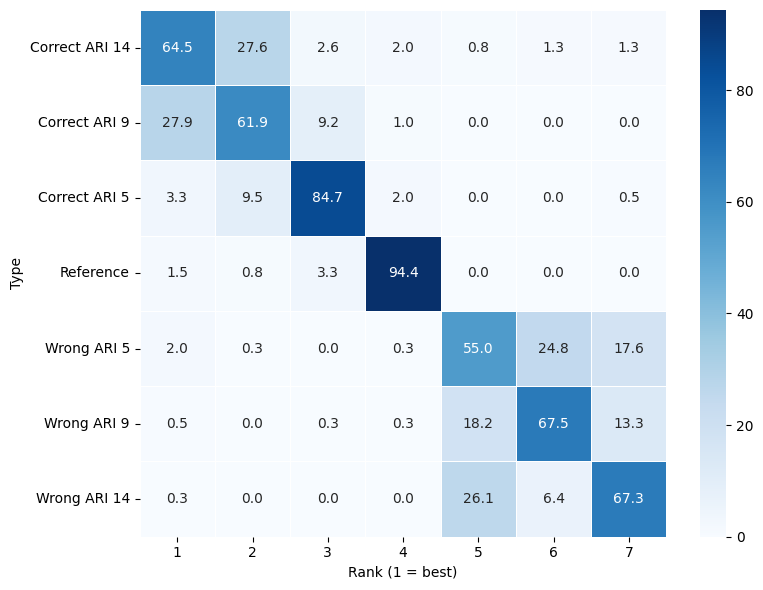

In [67]:
# --- 1) Build rank confusion matrix ---
cm_rank = build_rank_confusion_from_rankdf(
    rank_df,
    rank_cols=None,
    rename_map=rank_rename,
    expected_ranks=7
)

# Optional: reorder rows to desired label order
cm_rank = cm_rank.reindex(row_labels_order)

# --- 2) Plot only the rank confusion ---
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()


In [171]:
cm_rank

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,252,108,10,8,3,5,5
Correct ARI 9,109,242,36,4,0,0,0
Correct ARI 5,13,37,331,8,0,0,2
Reference,6,3,13,369,0,0,0
Wrong ARI 5,8,1,0,1,215,97,69
Wrong ARI 9,2,0,1,1,71,264,52
Wrong ARI 14,1,0,0,0,102,25,263


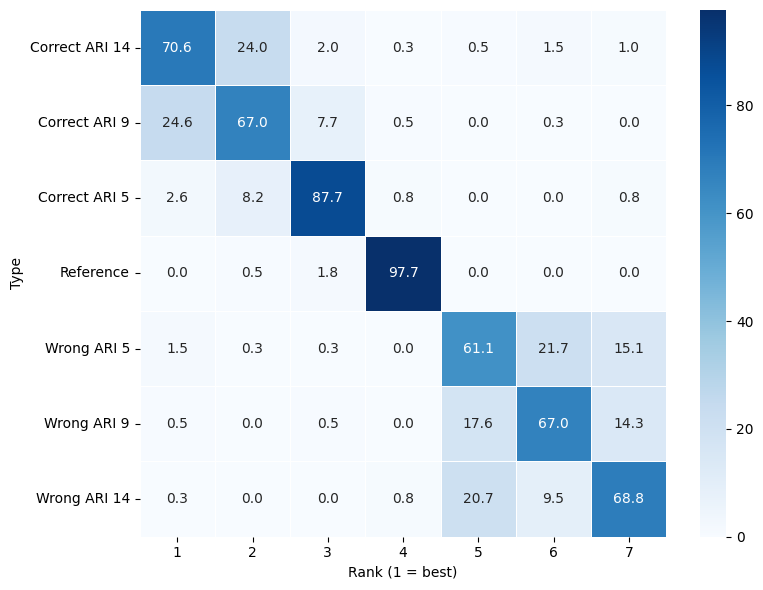

In [172]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_cot.csv"
score_file_cot = "../resultFiles/GPT4/Default/Score/filtered_all_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# # --- 3) Build matrices + plot ---
# cm_score = build_score_confusion_from_scores(score_df, score_cols,
#                                              rename_map=score_rename,
#                                              rank_method="min", ascending=False,
#                                              expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

# plot_both_confusions(cm_score, cm_rank, normalize="row",
#                      row_labels_order=row_labels_order,model = "GPT4-COT")
# --- 1) Build rank confusion matrix ---

cm_rank = cm_rank.reindex(row_labels_order)

# --- 2) Plot only the rank confusion ---
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()


In [66]:
# --- Side-by-side RANK-ONLY (e.g., Baseline vs CoT) ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0) Point to both rank CSVs
rank_file_baseline = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
rank_file_cot      = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_cot.csv"  # adjust if needed

# 1) Load + build matrices
rank_df_base = pd.read_csv(rank_file_baseline)
rank_df_cot  = pd.read_csv(rank_file_cot)

cm_rank_base = build_rank_confusion_from_rankdf(rank_df_base,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)
cm_rank_cot  = build_rank_confusion_from_rankdf(rank_df_cot,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)

# 2) Optional: enforce same row order (types)
cm_rank_base = cm_rank_base.reindex(row_labels_order)
cm_rank_cot  = cm_rank_cot.reindex(row_labels_order)

# 3) Ensure same columns (ranks) across both
all_cols = sorted(set(cm_rank_base.columns) | set(cm_rank_cot.columns))
cm_rank_base = cm_rank_base.reindex(columns=all_cols, fill_value=0)
cm_rank_cot  = cm_rank_cot.reindex(columns=all_cols, fill_value=0)

# 4) Normalize (row) for consistent color scale
d_base, _ = _normalize(cm_rank_base, how="row")
d_cot,  _ = _normalize(cm_rank_cot,  how="row")
vmin, vmax = 0, max(d_base.to_numpy().max(), d_cot.to_numpy().max())

# 5) Plot side by side
plt.rcParams.update({"pdf.fonttype": 42, "ps.fonttype": 42, "font.size": 10})
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True, sharex=True, sharey=True)

sns.heatmap(d_base, annot=True, fmt=".1f", cmap="Blues",
            vmin=vmin, vmax=vmax, cbar=False,
            linewidths=0.5, linecolor="white", square=True,
            annot_kws={"fontweight": "bold"}, ax=axes[0])
axes[0].set_title("GPT-4o — Rank Confusion (Baseline)")
axes[0].set_xlabel("Rank (1 = best)")
axes[0].set_ylabel("Type")
axes[0].set_xticklabels([str(c) for c in d_base.columns], rotation=0)
axes[0].set_yticklabels(list(d_base.index), rotation=0)

im = sns.heatmap(d_cot, annot=True, fmt=".1f", cmap="Blues",
                 vmin=vmin, vmax=vmax, cbar=True,
                 linewidths=0.5, linecolor="white", square=True,
                 annot_kws={"fontweight": "bold"}, ax=axes[1])
axes[1].set_title("GPT-4o — Rank Confusion (CoT)")
axes[1].set_xlabel("Rank (1 = best)")
axes[1].set_ylabel("")  # hide duplicate y label
axes[1].set_xticklabels([str(c) for c in d_cot.columns], rotation=0)
axes[1].set_yticklabels(list(d_cot.index), rotation=0)

cbar = im.collections[0].colorbar
cbar.set_label("Row-normalized %")

plt.savefig("rank_confusion_baseline_vs_cot.pdf", bbox_inches="tight")
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline.csv'

In [173]:
cm_rank

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,276,94,8,1,2,6,4
Correct ARI 9,96,262,30,2,0,1,0
Correct ARI 5,10,32,343,3,0,0,3
Reference,0,2,7,382,0,0,0
Wrong ARI 5,6,1,1,0,239,85,59
Wrong ARI 9,2,0,2,0,69,262,56
Wrong ARI 14,1,0,0,3,81,37,269


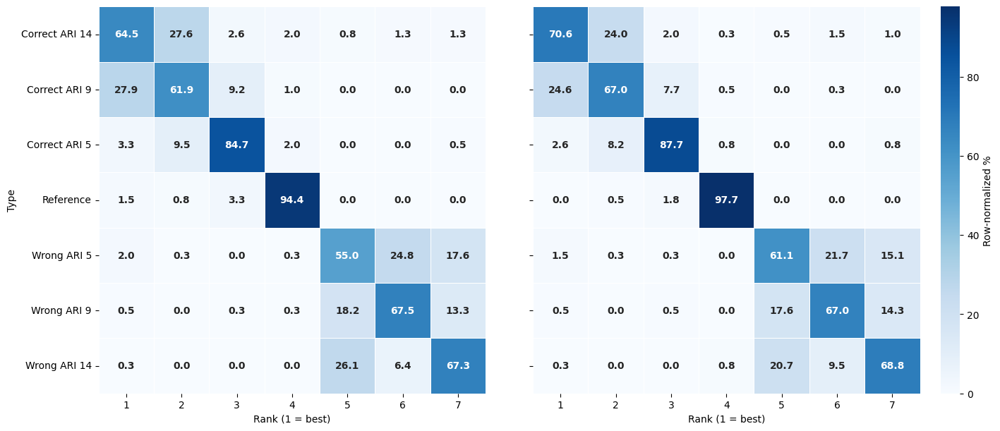

In [115]:
# --- Side-by-side RANK-ONLY (e.g., Baseline vs CoT) ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0) Point to both rank CSVs
rank_file_baseline = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline0.csv"
rank_file_cot      = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_cot.csv"  # adjust if needed

# 1) Load + build matrices
rank_df_base = pd.read_csv(rank_file_baseline)
rank_df_cot  = pd.read_csv(rank_file_cot)

cm_rank_base = build_rank_confusion_from_rankdf(rank_df_base,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)
cm_rank_cot  = build_rank_confusion_from_rankdf(rank_df_cot,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)

# 2) Optional: enforce same row order (types)
cm_rank_base = cm_rank_base.reindex(row_labels_order)
cm_rank_cot  = cm_rank_cot.reindex(row_labels_order)

# 3) Ensure same columns (ranks) across both
all_cols = sorted(set(cm_rank_base.columns) | set(cm_rank_cot.columns))
cm_rank_base = cm_rank_base.reindex(columns=all_cols, fill_value=0)
cm_rank_cot  = cm_rank_cot.reindex(columns=all_cols, fill_value=0)

# 4) Normalize (row) for consistent color scale
d_base, _ = _normalize(cm_rank_base, how="row")
d_cot,  _ = _normalize(cm_rank_cot,  how="row")
vmin, vmax = 0, max(d_base.to_numpy().max(), d_cot.to_numpy().max())

# 5) Plot side by side
plt.rcParams.update({"pdf.fonttype": 42, "ps.fonttype": 42, "font.size": 10})
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True, sharex=True, sharey=True)

sns.heatmap(d_base, annot=True, fmt=".1f", cmap="Blues",
            vmin=vmin, vmax=vmax, cbar=False,
            linewidths=0.5, linecolor="white", square=True,
            annot_kws={"fontweight": "bold"}, ax=axes[0])
axes[0].set_title("")
axes[0].set_xlabel("Rank (1 = best)")
axes[0].set_ylabel("Type")
axes[0].set_xticklabels([str(c) for c in d_base.columns], rotation=0)
axes[0].set_yticklabels(list(d_base.index), rotation=0)

im = sns.heatmap(d_cot, annot=True, fmt=".1f", cmap="Blues",
                 vmin=vmin, vmax=vmax, cbar=True,
                 linewidths=0.5, linecolor="white", square=True,
                 annot_kws={"fontweight": "bold"}, ax=axes[1])
axes[1].set_title("")
axes[1].set_xlabel("Rank (1 = best)")
axes[1].set_ylabel("")  # hide duplicate y label
axes[1].set_xticklabels([str(c) for c in d_cot.columns], rotation=0)
axes[1].set_yticklabels(list(d_cot.index), rotation=0)

cbar = im.collections[0].colorbar
cbar.set_label("Row-normalized %")

plt.savefig("Gpt-4o_Ranktrend.pdf", bbox_inches="tight")
plt.show()


***LLama***

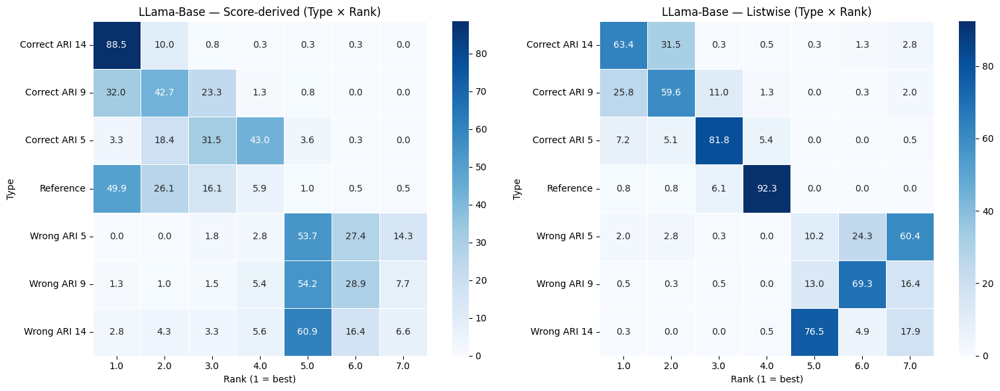

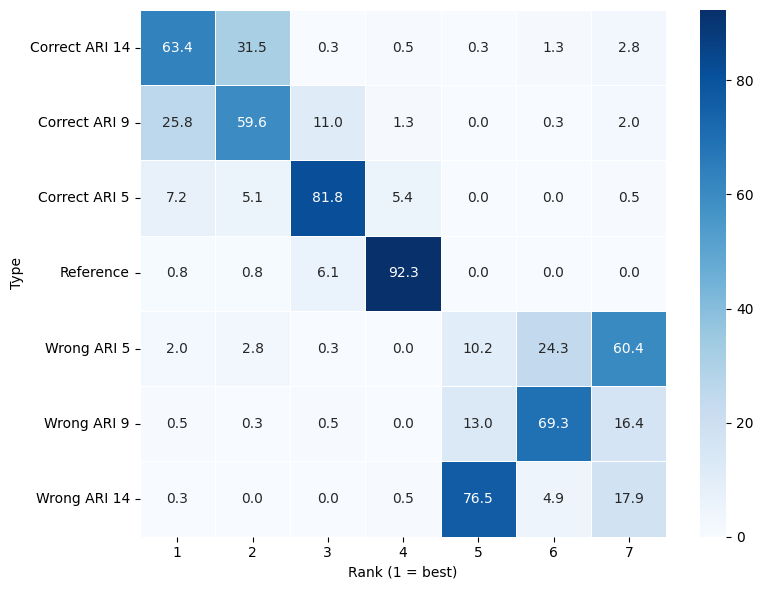

In [85]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "LLama-Base")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

In [86]:
cm_rank 

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,248,123,1,2,1,5,11
Correct ARI 9,101,233,43,5,0,1,8
Correct ARI 5,28,20,320,21,0,0,2
Reference,3,3,24,361,0,0,0
Wrong ARI 5,8,11,1,0,40,95,236
Wrong ARI 9,2,1,2,0,51,271,64
Wrong ARI 14,1,0,0,2,299,19,70


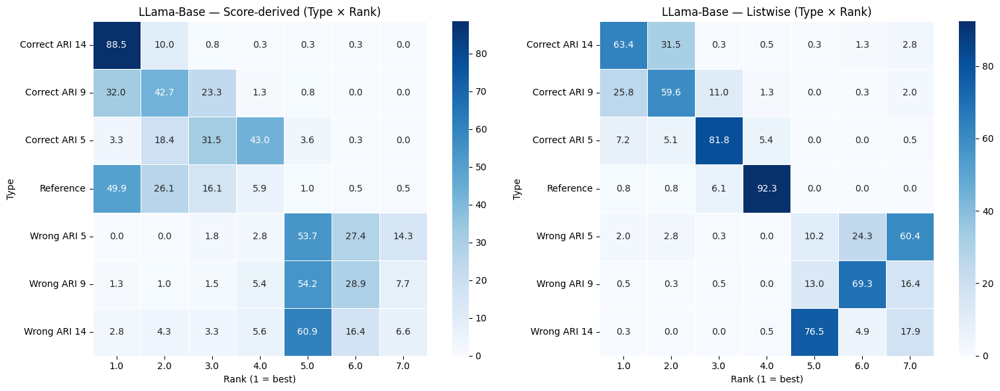

In [87]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "LLama-Base")

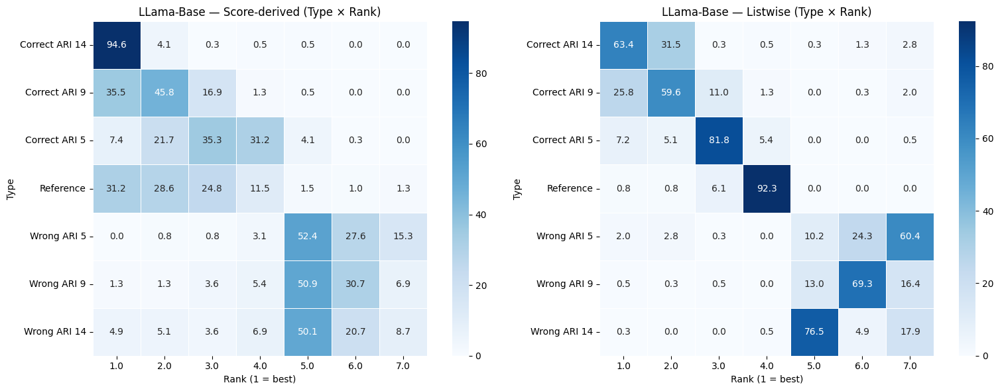

In [90]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/LLama/Default/Score/llama_judge_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
# cm_score = build_score_confusion_from_scores(score_df, score_cols,
#                                              rename_map=score_rename,
#                                              rank_method="min", ascending=False,
#                                              expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "LLama-Base")

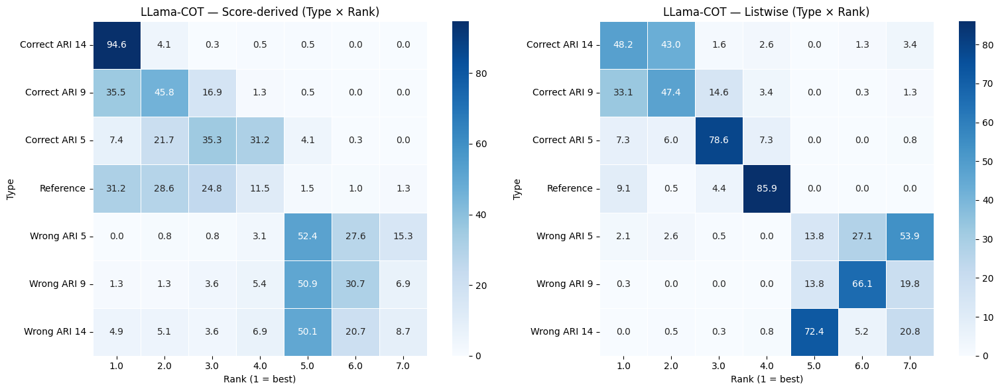

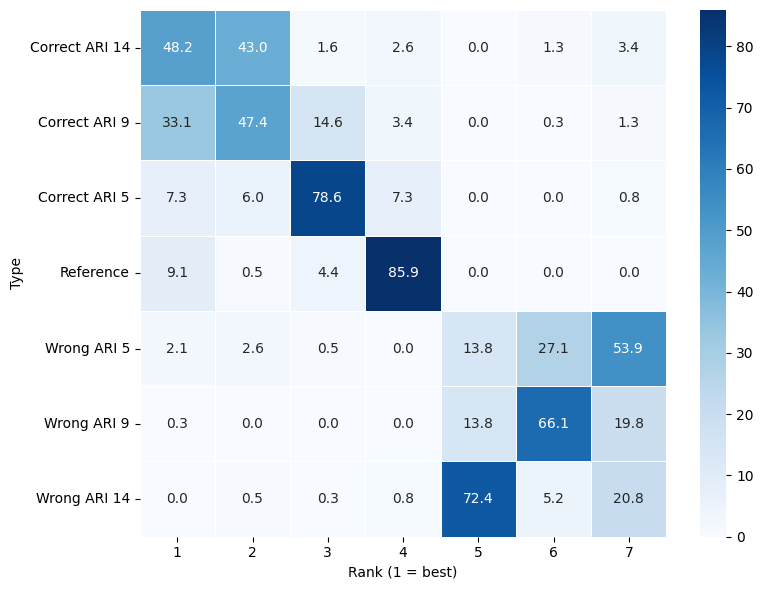

In [89]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"
score_file_cot = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "LLama-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

In [168]:
cm_rank

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,185,165,6,10,0,5,13
Correct ARI 9,127,182,56,13,0,1,5
Correct ARI 5,28,23,302,28,0,0,3
Reference,35,2,17,330,0,0,0
Wrong ARI 5,8,10,2,0,53,104,207
Wrong ARI 9,1,0,0,0,53,254,76
Wrong ARI 14,0,2,1,3,278,20,80


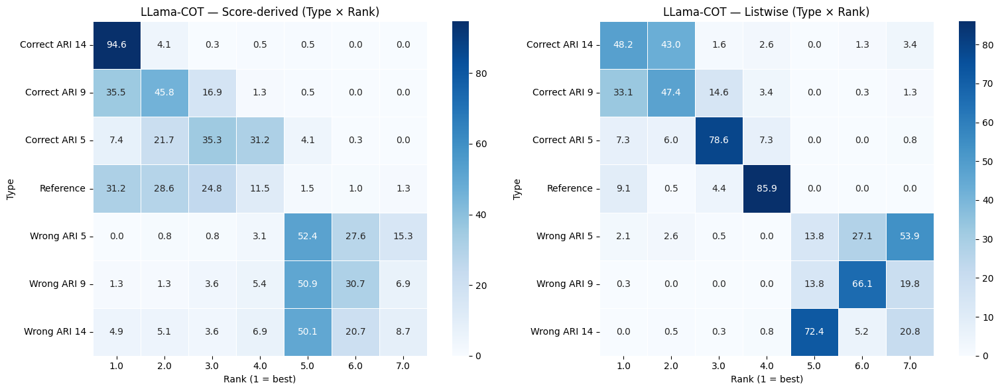

In [52]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"
score_file_cot = "../resultFiles/LLama/Default/Score/llama_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "LLama-COT")

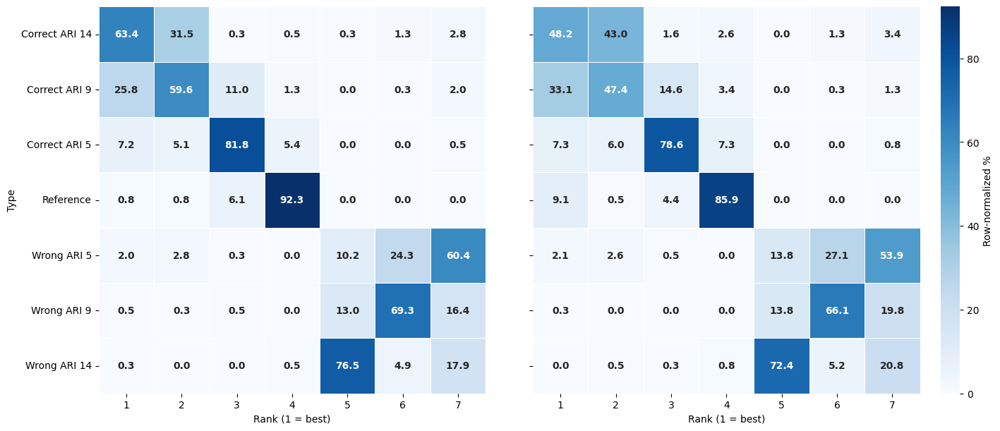

In [116]:
# --- Side-by-side RANK-ONLY (e.g., Baseline vs CoT) ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0) Point to both rank CSVs
rank_file_baseline = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
rank_file_cot      = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"  # adjust if needed

# 1) Load + build matrices
rank_df_base = pd.read_csv(rank_file_baseline)
rank_df_cot  = pd.read_csv(rank_file_cot)

cm_rank_base = build_rank_confusion_from_rankdf(rank_df_base,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)
cm_rank_cot  = build_rank_confusion_from_rankdf(rank_df_cot,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)

# 2) Optional: enforce same row order (types)
cm_rank_base = cm_rank_base.reindex(row_labels_order)
cm_rank_cot  = cm_rank_cot.reindex(row_labels_order)

# 3) Ensure same columns (ranks) across both
all_cols = sorted(set(cm_rank_base.columns) | set(cm_rank_cot.columns))
cm_rank_base = cm_rank_base.reindex(columns=all_cols, fill_value=0)
cm_rank_cot  = cm_rank_cot.reindex(columns=all_cols, fill_value=0)

# 4) Normalize (row) for consistent color scale
d_base, _ = _normalize(cm_rank_base, how="row")
d_cot,  _ = _normalize(cm_rank_cot,  how="row")
vmin, vmax = 0, max(d_base.to_numpy().max(), d_cot.to_numpy().max())

# 5) Plot side by side
plt.rcParams.update({"pdf.fonttype": 42, "ps.fonttype": 42, "font.size": 10})
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True, sharex=True, sharey=True)

sns.heatmap(d_base, annot=True, fmt=".1f", cmap="Blues",
            vmin=vmin, vmax=vmax, cbar=False,
            linewidths=0.5, linecolor="white", square=True,
            annot_kws={"fontweight": "bold"}, ax=axes[0])
axes[0].set_title("")
axes[0].set_xlabel("Rank (1 = best)")
axes[0].set_ylabel("Type")
axes[0].set_xticklabels([str(c) for c in d_base.columns], rotation=0)
axes[0].set_yticklabels(list(d_base.index), rotation=0)

im = sns.heatmap(d_cot, annot=True, fmt=".1f", cmap="Blues",
                 vmin=vmin, vmax=vmax, cbar=True,
                 linewidths=0.5, linecolor="white", square=True,
                 annot_kws={"fontweight": "bold"}, ax=axes[1])
axes[1].set_title("")
axes[1].set_xlabel("Rank (1 = best)")
axes[1].set_ylabel("")  # hide duplicate y label
axes[1].set_xticklabels([str(c) for c in d_cot.columns], rotation=0)
axes[1].set_yticklabels(list(d_cot.index), rotation=0)

cbar = im.collections[0].colorbar
cbar.set_label("Row-normalized %")

plt.savefig("Llama_Ranktrend.pdf", bbox_inches="tight")
plt.show()


***PoLL Judges***

***Mistral***

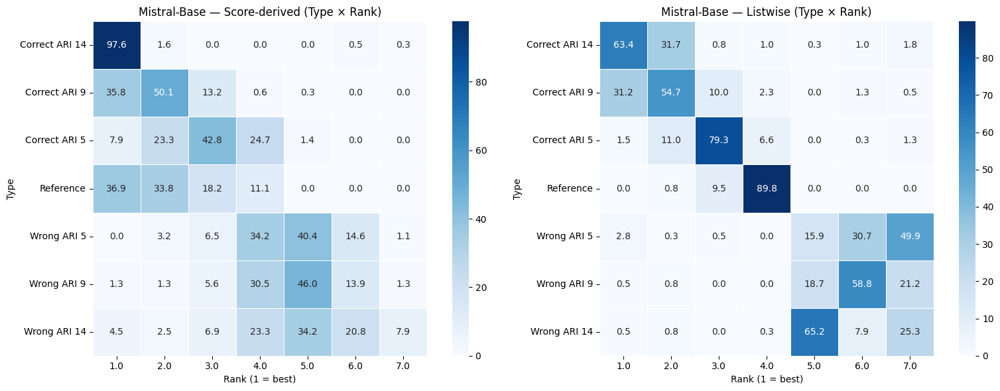

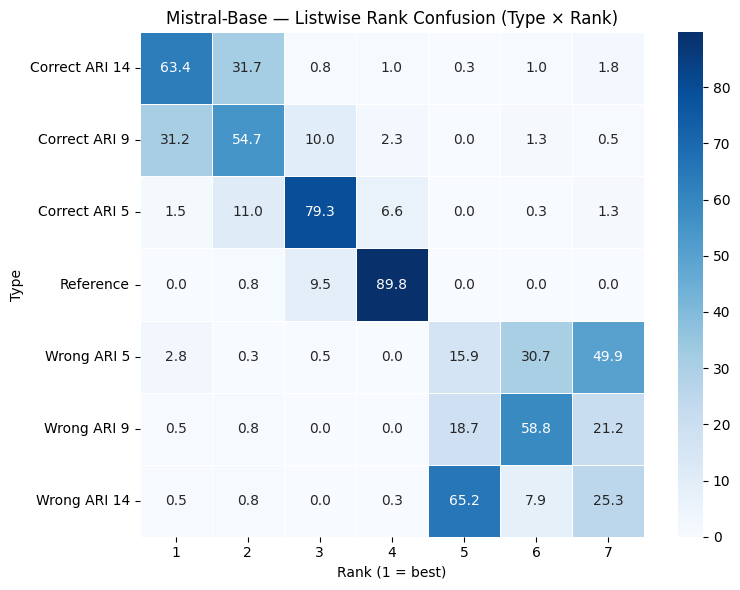

In [92]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "Mistral-Base")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="Mistral-Base — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

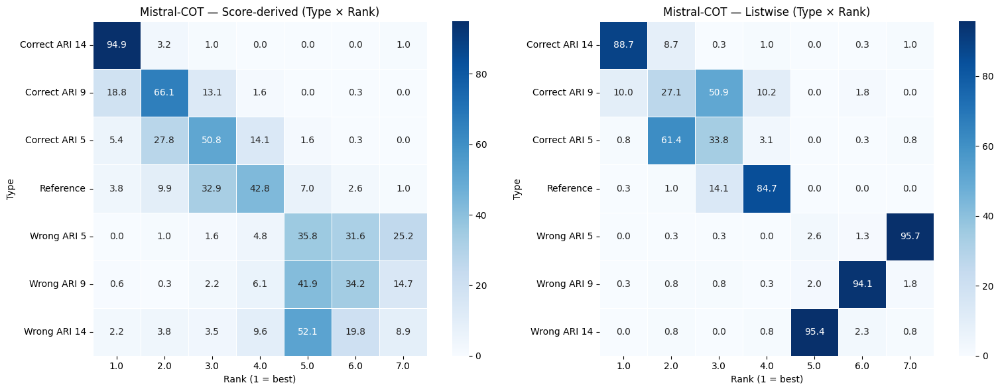

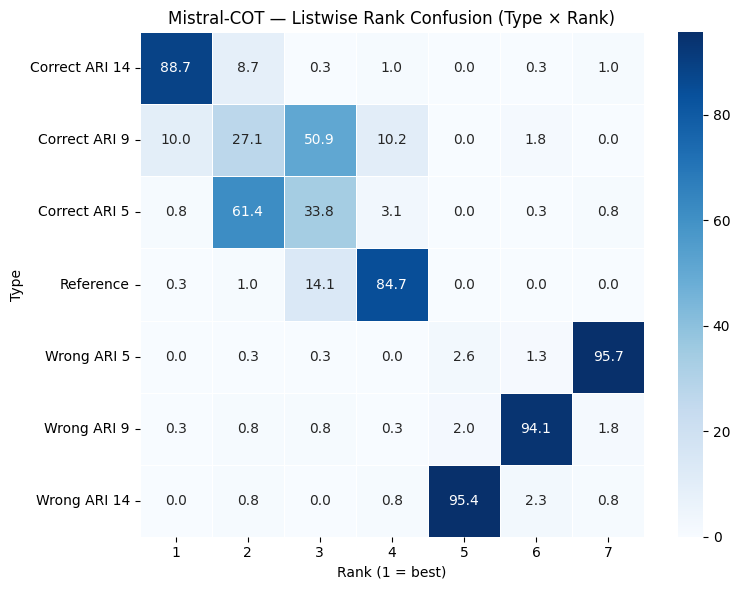

In [93]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv"
score_file_cot = "../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "Mistral-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="Mistral-COT — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

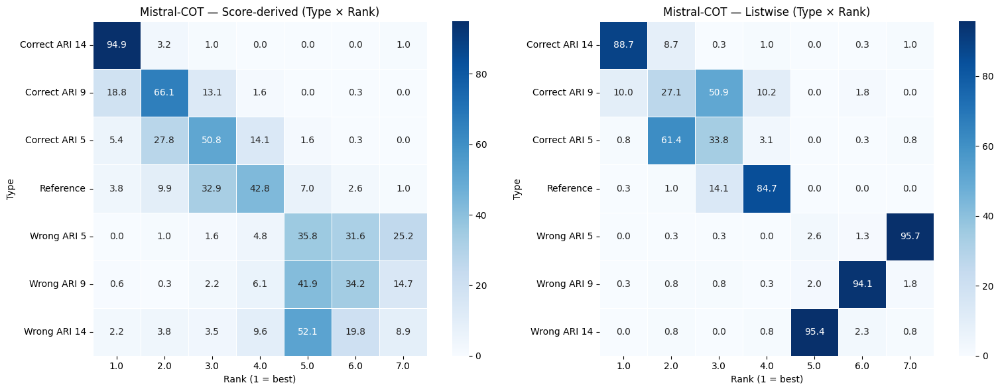

In [94]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv"
score_file_cot = "../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "Mistral-COT")

***Qwen***

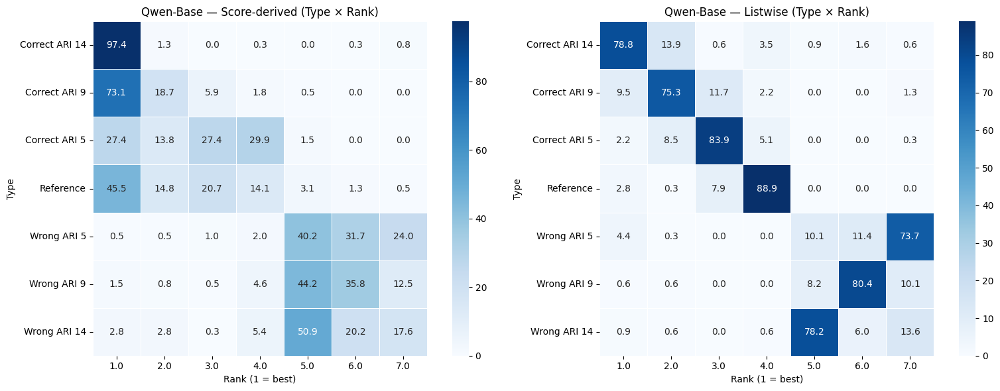

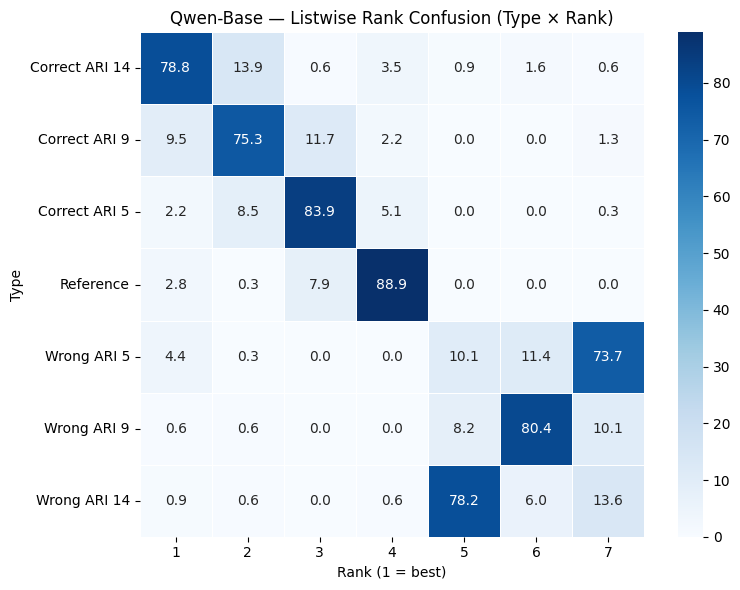

In [95]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/Qwen/Default/Score/qwen32_score_baseline1.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "Qwen-Base")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="Qwen-Base — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

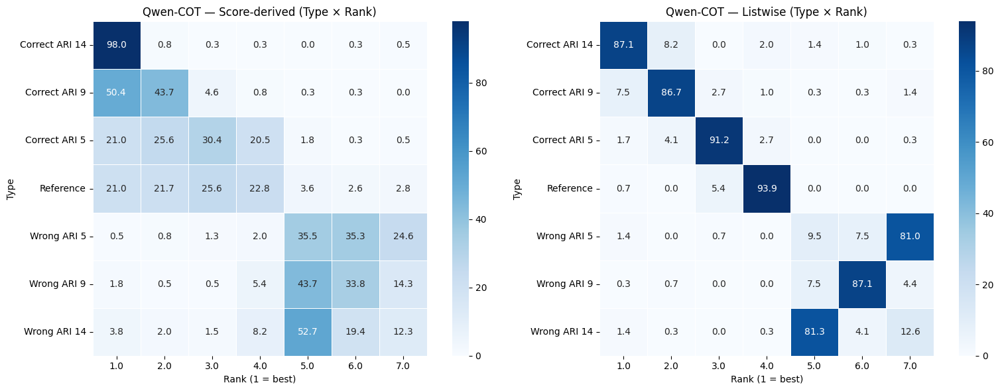

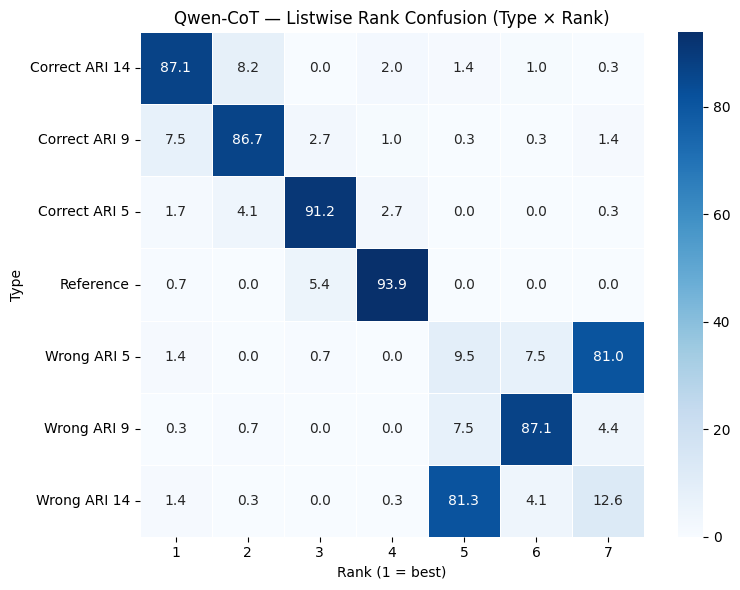

In [96]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv"
score_file_cot = "../resultFiles/Qwen/Default/Score/qwen32_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)

# qwen32_judge_rank_cot
# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "Qwen-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="Qwen-CoT — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

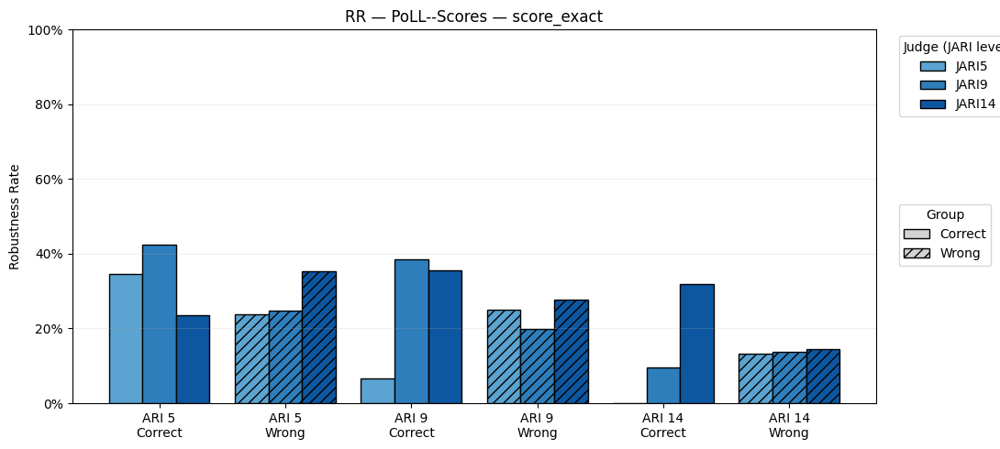

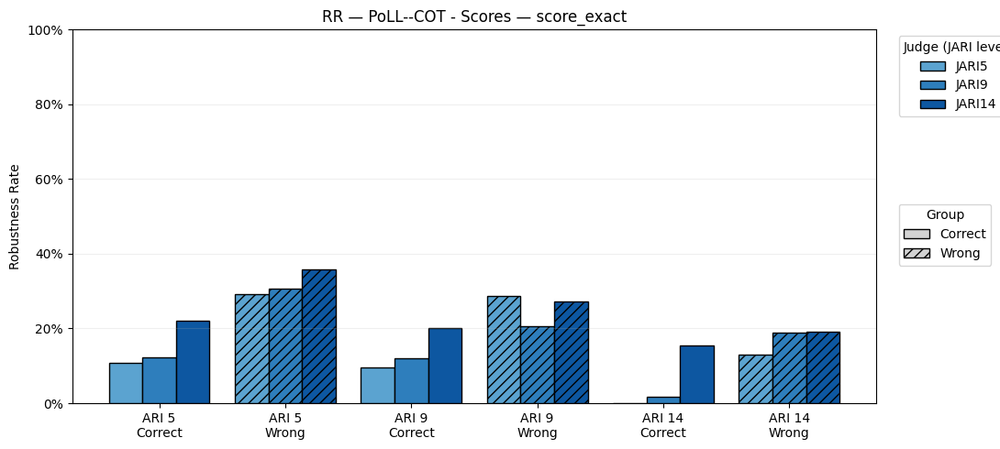

In [ ]:
# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_scores),
                 ("JARI9", rr9_scores),
                 ("JARI14", rr14_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL--Scores"
)

# Exact match plot
plot_rr_scores_split(
    jari_frames=[("JARI5", rr5_cot_scores),
                 ("JARI9", rr9_cot_scores),
                 ("JARI14", rr14_cot_scores)],
    metric="score_exact",
    title_prefix="RR — PoLL--COT - Scores"
)

***GPT3***

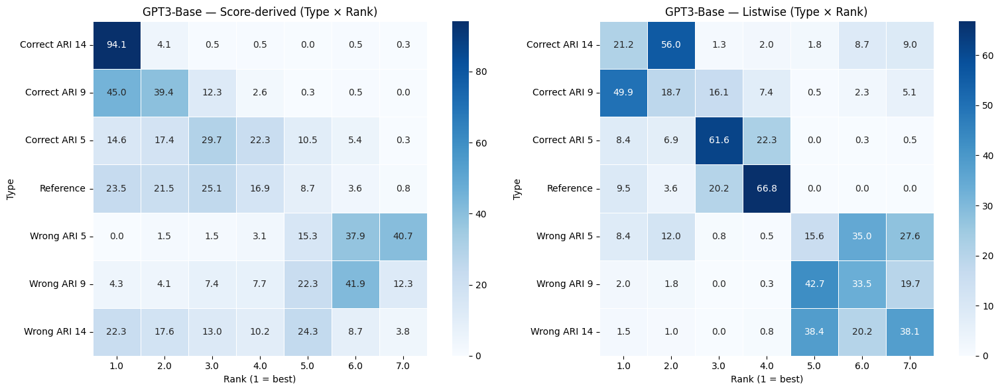

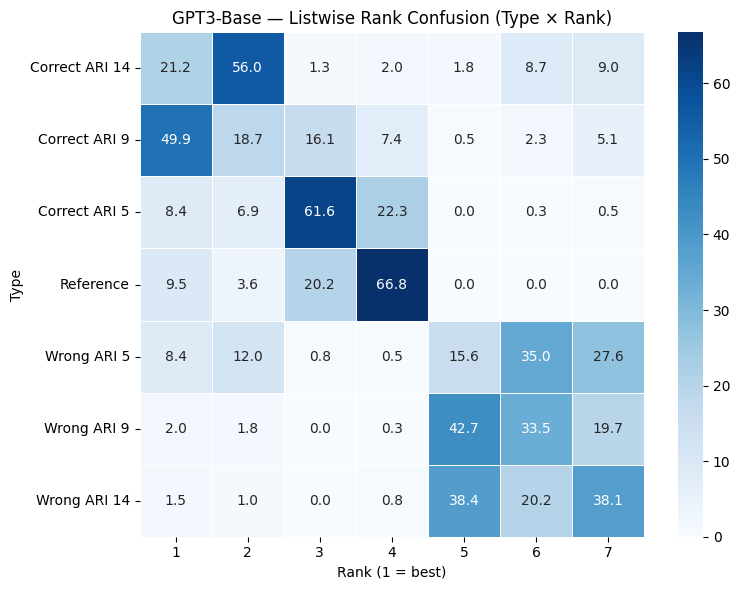

In [97]:
# --- 0) Load your dataframes ---
rank_file_base  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT3-Base")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="GPT3-Base — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

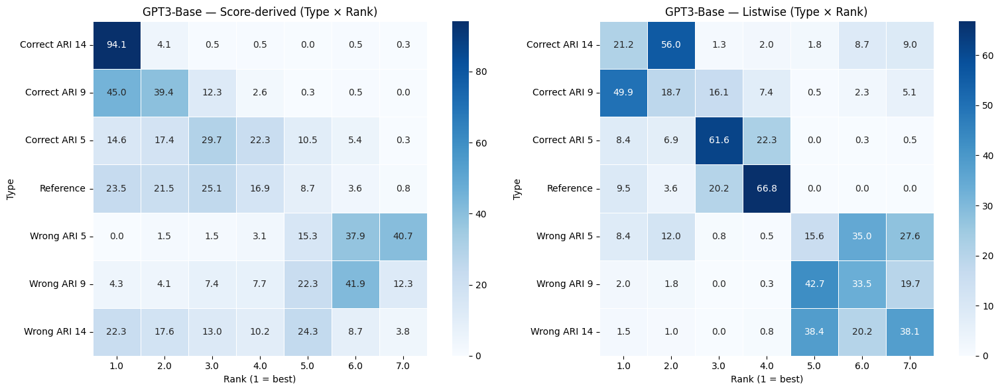

In [98]:
rank_file_base  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv"
score_file_base = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv"

rank_df  = pd.read_csv(rank_file_base)
score_df = pd.read_csv(score_file_base)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT3-Base")

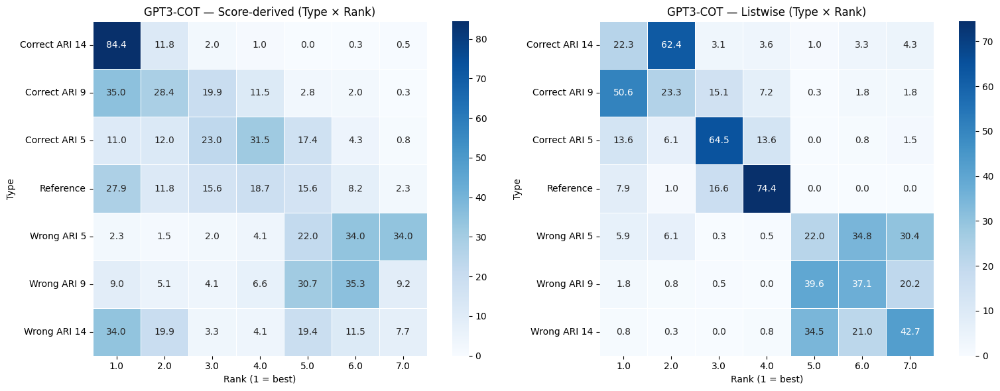

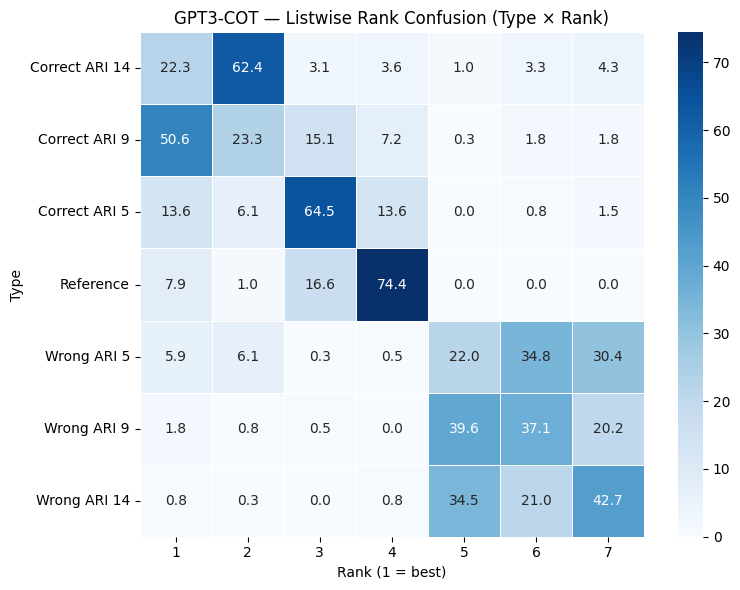

In [99]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv"
score_file_cot = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT3-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="GPT3-COT — Listwise Rank Confusion (Type × Rank)",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

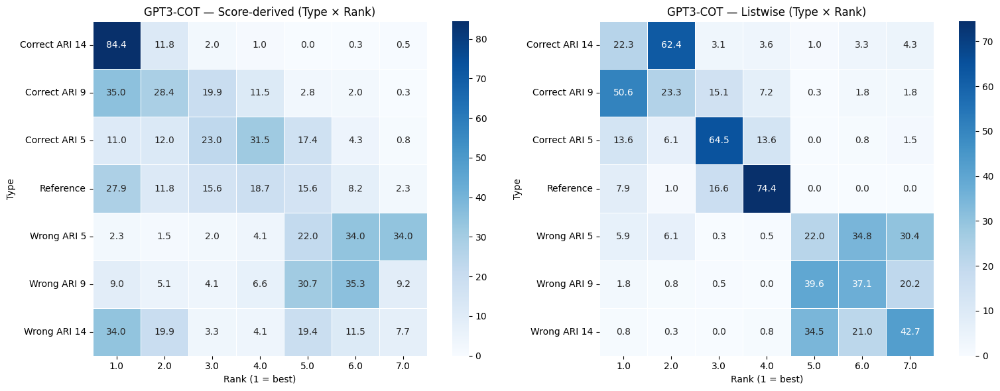

In [100]:
# --- 0) Load your dataframes ---
rank_file_cot  = "../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv"
score_file_cot = "../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv"

rank_df  = pd.read_csv(rank_file_cot)
score_df = pd.read_csv(score_file_cot)


# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(score_df, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(rank_df, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "GPT3-COT")

In [101]:
def compute_poll_scores_mean(*dfs, score_columns=None, weights=None):
    if len(dfs) < 2: raise ValueError("Pass at least two DataFrames.")
    J = len(dfs)
    if weights is None: weights = np.ones(J, dtype=float)

    # Union of indices; reindex; numeric coercion
    idx = dfs[0].index
    for d in dfs[1:]: idx = idx.union(d.index)
    dfs = [d.reindex(idx) for d in dfs]

    if score_columns is None:
        cols = set(dfs[0].columns)
        for d in dfs[1:]: cols &= set(d.columns)
        score_columns = sorted(cols)

    mats = [dfs[j][score_columns].apply(pd.to_numeric, errors="coerce") for j in range(J)]
    out = pd.DataFrame(index=idx, columns=score_columns, dtype=float)

    for c in score_columns:
        A = np.vstack([m[c].to_numpy() for m in mats])  # (J, N)
        mask = ~np.isnan(A)
        w = weights[:, None] * mask
        
        A_no_nan = np.nan_to_num(A) 
        num = (A_no_nan * w).sum(axis=0)
        
        den = w.sum(axis=0)
        
        # --- MODIFICATION IS HERE ---
        # Changed np.ceil to np.round for standard rounding (majority vote).
        out[c] = np.where(den > 0, np.round(num / den), np.nan)
        # --- END MODIFICATION ---

    return out

In [102]:
import numpy as np
import pandas as pd
from collections import defaultdict

def compute_poll_rank(*dfs, rank_columns=None,
                      tie_break="median",          # "median" | "min" | "max" | "closest_to_mean" | "priority" | "random"
                      weights=None,
                      priority=None,
                      seed=None):
    if len(dfs) < 2:
        raise ValueError("Pass at least two DataFrames.")
    n = len(dfs)
    if weights is None:
        weights = [1.0]*n
    if priority is None:
        priority = list(range(n))
    rng = np.random.default_rng(seed)

    # UNION of indices
    union_idx = dfs[0].index
    for d in dfs[1:]:
        union_idx = union_idx.union(d.index)
    dfs = [d.reindex(union_idx) for d in dfs]

    # Columns to use
    if rank_columns is None:
        cols = set(dfs[0].columns)
        for d in dfs[1:]:
            cols &= set(d.columns)
        rank_columns = sorted(cols)
    else:
        # warn / filter columns that don't exist
        missing = [c for c in rank_columns if not all(c in d.columns for d in dfs)]
        if missing:
            print("Warning: dropping missing columns:", missing)
            rank_columns = [c for c in rank_columns if all(c in d.columns for d in dfs)]

    # <-- FIX: convert each column (Series) to numeric -->
    mats = [d[rank_columns].apply(pd.to_numeric, errors="coerce") for d in dfs]

    out = pd.DataFrame(index=union_idx, columns=rank_columns, dtype="Int64")

    def break_tie(values, valid_mask, tied_vals):
        v = values[valid_mask].astype(int)
        if tie_break == "median":
            return int(np.median(v))
        elif tie_break == "min":
            return int(np.min(v))
        elif tie_break == "max":
            return int(np.max(v))
        elif tie_break == "closest_to_mean":
            mu = float(np.mean(v))
            cand = sorted(tied_vals, key=lambda x: (abs(x-mu), x))
            return int(cand[0])
        elif tie_break == "priority":
            for j in priority:
                val = values[j]
                if pd.notna(val) and int(val) in tied_vals:
                    return int(val)
            return int(sorted(tied_vals)[0])
        elif tie_break == "random":
            return int(rng.choice(list(tied_vals)))
        else:
            return int(np.median(v))

    # vote per column/row
    for col in rank_columns:
        arr = np.vstack([mats[j][col].to_numpy() for j in range(n)])  # (n_judges, n_rows)
        col_idx = out.columns.get_loc(col)
        for i in range(arr.shape[1]):
            vals = arr[:, i]
            valid = ~np.isnan(vals)
            if not valid.any():
                out.iat[i, col_idx] = pd.NA
                continue

            # weighted counts
            counts = defaultdict(float)
            for j, ok in enumerate(valid):
                if ok:
                    counts[int(vals[j])] += float(weights[j])

            total_w = sum(counts.values())
            chosen = None
            for k, w in counts.items():
                if w > total_w / 2.0:
                    chosen = int(k)
                    break

            if chosen is None:
                max_w = max(counts.values())
                tied = {k for k, w in counts.items() if np.isclose(w, max_w)}
                chosen = break_tie(vals, valid, tied)

            out.iat[i, col_idx] = chosen

    return out


In [103]:
df_mistral  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv",  index_col=0)
df_qwen  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_baseline1.csv",  index_col=0)
df_gpt3 = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_baseline1.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_baseline = compute_poll_rank(
    df_mistral, df_qwen, df_gpt3,
    rank_columns=cols, tie_break="median"
)

In [104]:
poll_baseline.head()

,Rank_Ref,Rank_ARI_5,Rank_ARI_9,Rank_ARI_14,Rank_Wrong_Answer_ARI_5,Rank_Wrong_Answer_ARI_9,Rank_Wrong_Answer_ARI_14
0,4,3,2,5,1,7,6
1,4,3,2,1,6,5,6
2,4,3,1,2,6,6,5
3,4,3,1,2,7,5,5
4,4,3,2,1,6,7,5


In [105]:
df_mistral_cot  = pd.read_csv("../resultFiles/Mistral/Default/Rank/mistral_judge_rank_cot.csv",  index_col=0)
df_qwen_cot  = pd.read_csv("../resultFiles/Qwen/Default/Rank/qwen32_judge_rank_cot.csv",  index_col=0)
df_gpt3_cot = pd.read_csv("../resultFiles/GPT3/Default/Rank/gpt3_judge_rank_cot.csv", index_col=0)

cols = ["Rank_Ref","Rank_ARI_5","Rank_ARI_9","Rank_ARI_14",
        "Rank_Wrong_Answer_ARI_5","Rank_Wrong_Answer_ARI_9","Rank_Wrong_Answer_ARI_14"]

poll_cot_rank= compute_poll_rank(
    df_mistral_cot, df_qwen_cot, df_gpt3_cot,
    rank_columns=cols, tie_break="median"
)

In [106]:
df_mistral_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv",  index_col=0)
df_qwen_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_baseline1.csv",  index_col=0)
df_gpt3_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_baseline.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_score = compute_poll_scores_mean(
    df_mistral_score, df_qwen_score, df_gpt3_score,
    score_columns=cols
)

In [107]:
df_mistral_cot_score  = pd.read_csv("../resultFiles/Mistral/Default/Score/mistral_judge_score_cot.csv",  index_col=0)
df_qwen_cot_score  = pd.read_csv("../resultFiles/Qwen/Default/Score/qwen32_score_cot.csv",  index_col=0)
df_gpt3_cot_score = pd.read_csv("../resultFiles/GPT3/Default/Score/gpt3_judge_score_cot.csv", index_col=0)


cols = ["Score_Ref_Answer","Score_ARI_5","Score_ARI_9","Score_ARI_14",
        "Score_Wrong_Answer_ARI_5","Score_Wrong_Answer_ARI_9","Score_Wrong_Answer_ARI_14"]

poll_cot_score = compute_poll_scores_mean(
    df_mistral_cot_score, df_qwen_cot_score, df_gpt3_cot_score,
    score_columns=cols
)

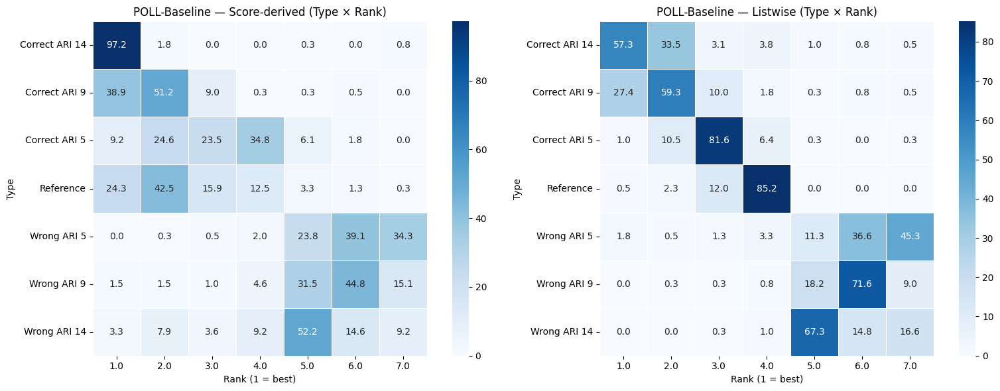

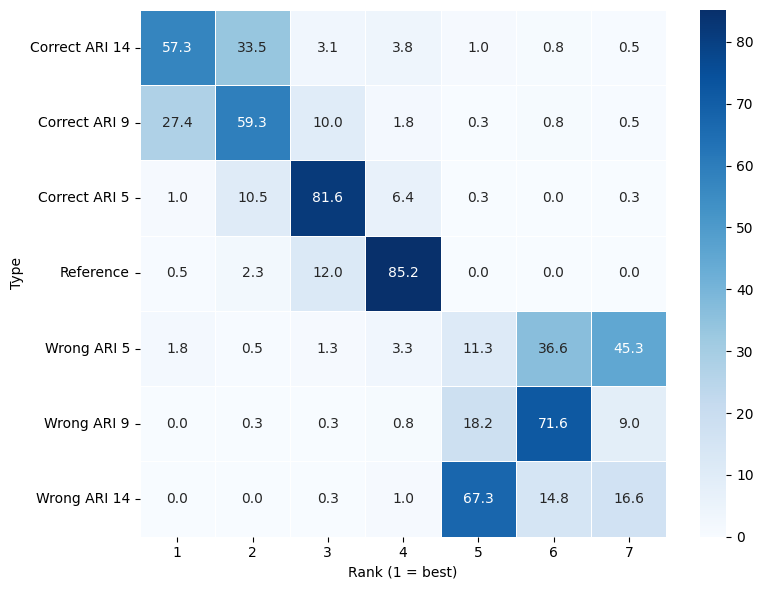

In [108]:
# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(poll_score, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(poll_baseline, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "POLL-Baseline")

cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

In [178]:
cm_rank

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,224,131,12,15,4,3,2
Correct ARI 9,107,232,39,7,1,3,2
Correct ARI 5,4,41,319,25,1,0,1
Reference,2,9,47,333,0,0,0
Wrong ARI 5,7,2,5,13,44,143,177
Wrong ARI 9,0,1,1,3,71,280,35
Wrong ARI 14,0,0,1,4,263,58,65


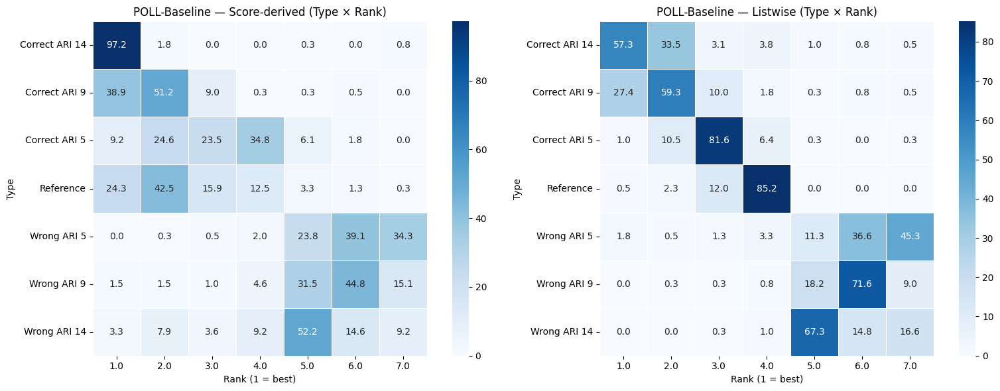

In [109]:
# 0) Derive columns and verify alignment
score_cols = [c for c in poll_score.columns if c.startswith("Score_")]
rank_cols  = [c for c in poll_baseline.columns if c.startswith("Rank_")]

assert len(poll_score) == len(poll_baseline)
assert (poll_score.index == poll_baseline.index).all()

# 1) Optional cleaning: drop rows with any missing ranks/scores for the listed columns
keep = (~poll_baseline[rank_cols].isna().any(axis=1)) & (~poll_score[score_cols].isna().any(axis=1))
poll_score_clean    = poll_score.loc[keep]
poll_baseline_clean = poll_baseline.loc[keep]

# 2) Build confusion matrices
cm_score = build_score_confusion_from_scores(
    poll_score, score_cols,
    rename_map=score_rename,
    rank_method="min",
    ascending=False,
    expected_ranks=7
)

cm_rank = build_rank_confusion_from_rankdf(
    poll_baseline_clean,
    rank_cols=rank_cols,            # pass explicitly for safety
    rename_map=rank_rename,
    expected_ranks=7
)

# 3) Plot (row-normalized so each judge/source row sums to 1)
plot_both_confusions(
    cm_score, cm_rank,
    normalize="row",
    row_labels_order=row_labels_order,
    model="POLL-Baseline"
)


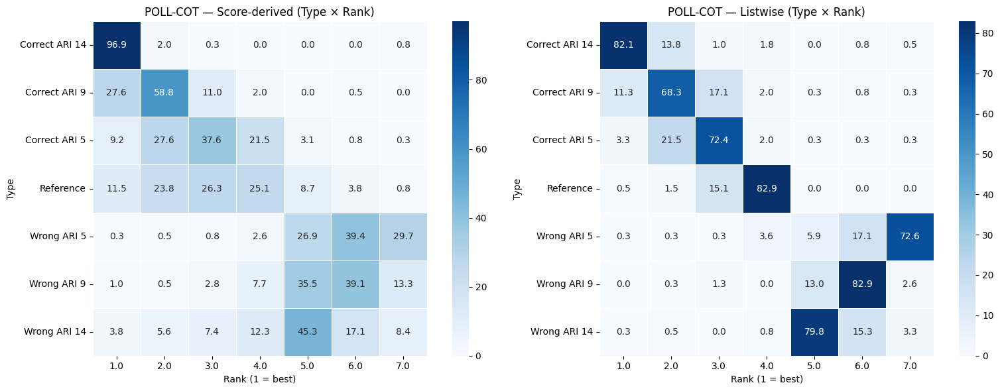

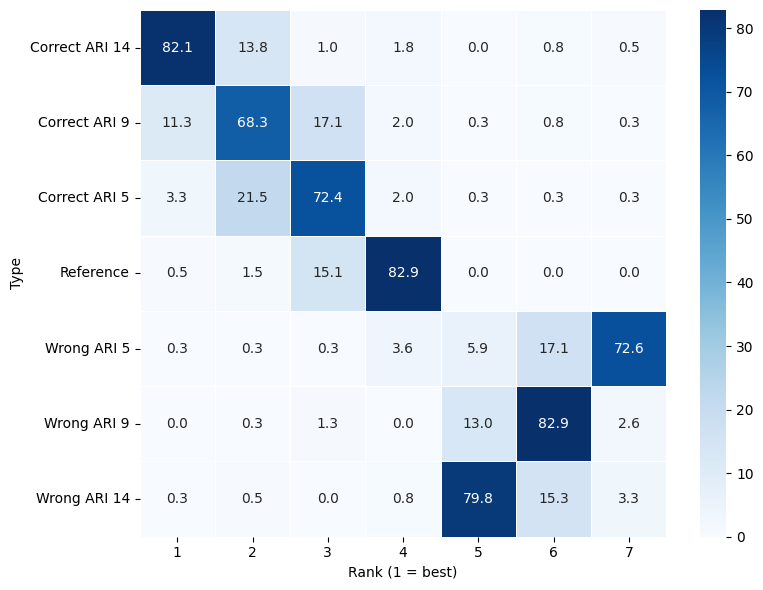

In [110]:
# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(poll_cot_score, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(poll_cot_rank, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "POLL-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

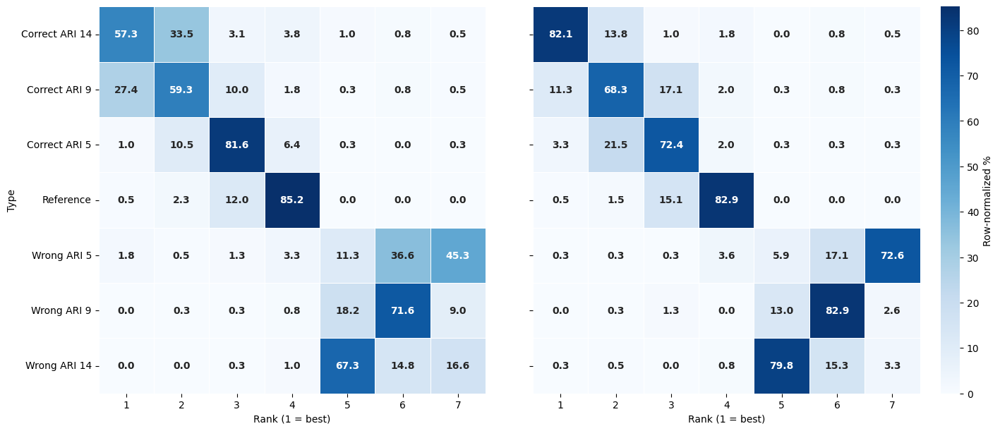

In [117]:
# --- Side-by-side RANK-ONLY (e.g., Baseline vs CoT) ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 0) Point to both rank CSVs
# rank_file_baseline = "../resultFiles/LLama/Default/Rank/llama_judge_rank_baseline1.csv"
# rank_file_cot      = "../resultFiles/LLama/Default/Rank/llama_judge_rank_cot.csv"  # adjust if needed

# # 1) Load + build matrices
# rank_df_base = pd.read_csv(rank_file_baseline)
# rank_df_cot  = pd.read_csv(rank_file_cot)

cm_rank_base = build_rank_confusion_from_rankdf(poll_baseline_clean,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)
cm_rank_cot  = build_rank_confusion_from_rankdf(poll_cot_rank,
                                                rank_cols=None,
                                                rename_map=rank_rename,
                                                expected_ranks=7)

# 2) Optional: enforce same row order (types)
cm_rank_base = cm_rank_base.reindex(row_labels_order)
cm_rank_cot  = cm_rank_cot.reindex(row_labels_order)

# 3) Ensure same columns (ranks) across both
all_cols = sorted(set(cm_rank_base.columns) | set(cm_rank_cot.columns))
cm_rank_base = cm_rank_base.reindex(columns=all_cols, fill_value=0)
cm_rank_cot  = cm_rank_cot.reindex(columns=all_cols, fill_value=0)

# 4) Normalize (row) for consistent color scale
d_base, _ = _normalize(cm_rank_base, how="row")
d_cot,  _ = _normalize(cm_rank_cot,  how="row")
vmin, vmax = 0, max(d_base.to_numpy().max(), d_cot.to_numpy().max())

# 5) Plot side by side
plt.rcParams.update({"pdf.fonttype": 42, "ps.fonttype": 42, "font.size": 10})
fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True, sharex=True, sharey=True)

sns.heatmap(d_base, annot=True, fmt=".1f", cmap="Blues",
            vmin=vmin, vmax=vmax, cbar=False,
            linewidths=0.5, linecolor="white", square=True,
            annot_kws={"fontweight": "bold"}, ax=axes[0])
axes[0].set_title("")
axes[0].set_xlabel("Rank (1 = best)")
axes[0].set_ylabel("Type")
axes[0].set_xticklabels([str(c) for c in d_base.columns], rotation=0)
axes[0].set_yticklabels(list(d_base.index), rotation=0)

im = sns.heatmap(d_cot, annot=True, fmt=".1f", cmap="Blues",
                 vmin=vmin, vmax=vmax, cbar=True,
                 linewidths=0.5, linecolor="white", square=True,
                 annot_kws={"fontweight": "bold"}, ax=axes[1])
axes[1].set_title("")
axes[1].set_xlabel("Rank (1 = best)")
axes[1].set_ylabel("")  # hide duplicate y label
axes[1].set_xticklabels([str(c) for c in d_cot.columns], rotation=0)
axes[1].set_yticklabels(list(d_cot.index), rotation=0)

cbar = im.collections[0].colorbar
cbar.set_label("Row-normalized %")

plt.savefig("PoLL_Ranktrend.pdf", bbox_inches="tight")
plt.show()


In [62]:
# --- 3) Build matrices + plot ---
cm_score = build_score_confusion_from_scores(poll_cot_score, score_cols,
                                             rename_map=score_rename,
                                             rank_method="min", ascending=False,
                                             expected_ranks=7)
cm_rank  = build_rank_confusion_from_rankdf(poll_cot_rank, rank_cols=None,
                                            rename_map=rank_rename,
                                            expected_ranks=7)

plot_both_confusions(cm_score, cm_rank, normalize="row",
                     row_labels_order=row_labels_order,model = "POLL-COT")
cm_rank = cm_rank.reindex(row_labels_order)
plot_confusion(
    cm_rank,
    title="",
    normalize="row",      # row-normalized percentages; set None for raw counts
    cmap="Blues"
)
plt.show()

NameError: name 'build_score_confusion_from_scores' is not defined

In [180]:
cm_rank

rank_val,1,2,3,4,5,6,7
rank_col,,,,,,,
Correct ARI 14,321,54,4,7,0,3,2
Correct ARI 9,44,267,67,8,1,3,1
Correct ARI 5,13,84,283,8,1,1,1
Reference,2,6,59,324,0,0,0
Wrong ARI 5,1,1,1,14,23,67,284
Wrong ARI 9,0,1,5,0,51,324,10
Wrong ARI 14,1,2,0,3,312,60,13


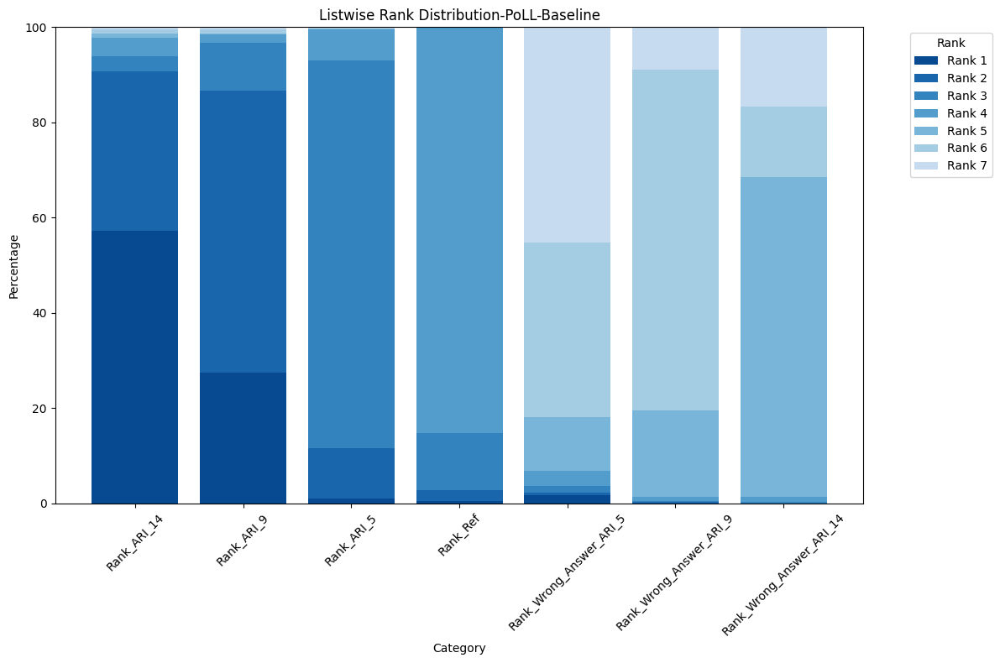

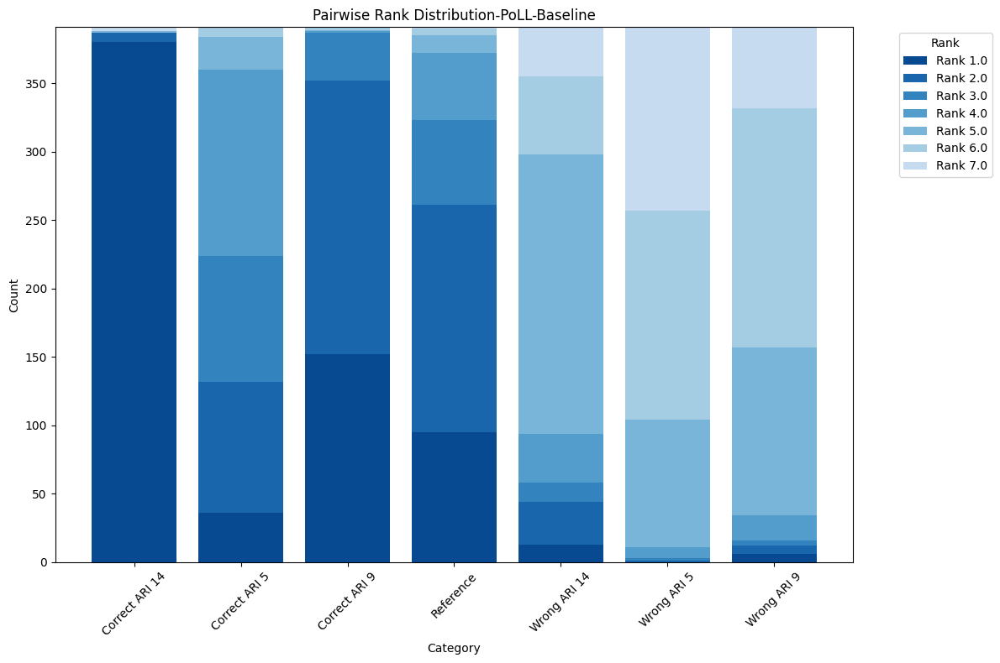

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


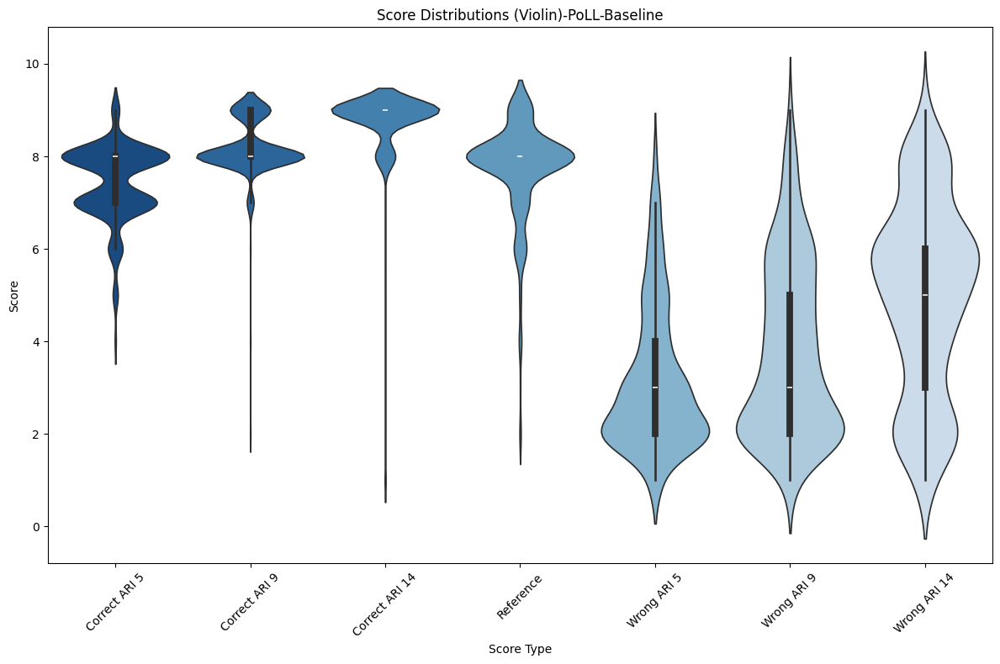

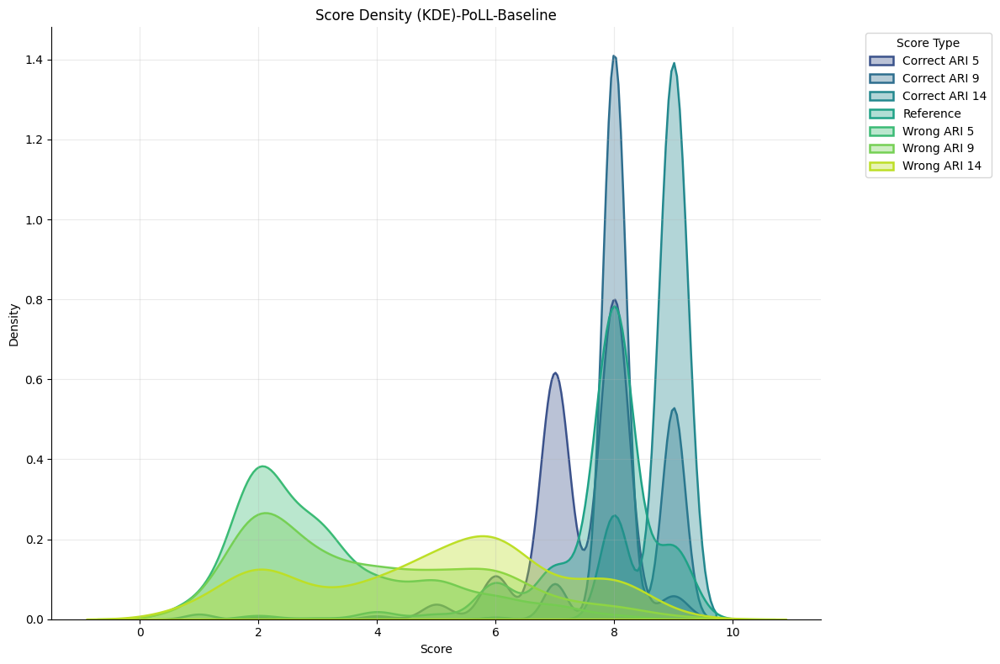

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

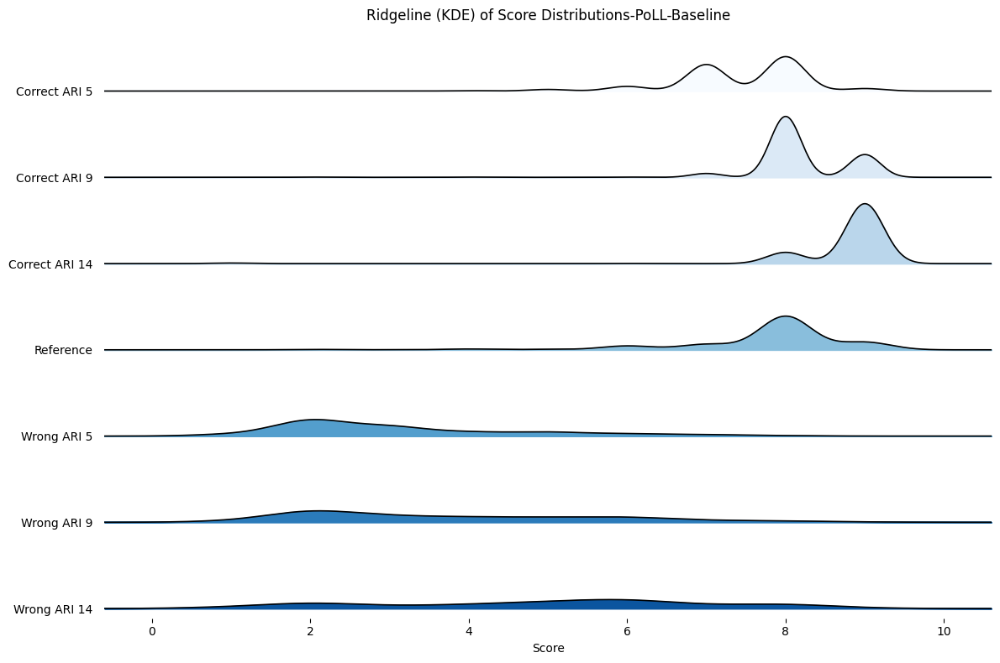

In [129]:
# rank_file  = "../resultFiles/Mistral/Default/Rank/mistral_judge_rank_baseline1.csv" 
# score_file = "../resultFiles/Mistral/Default/Score/mistral_judge_score_baseline1.csv "      
plot_trend_graphs(poll_score, poll_baseline,"PoLL-Baseline")

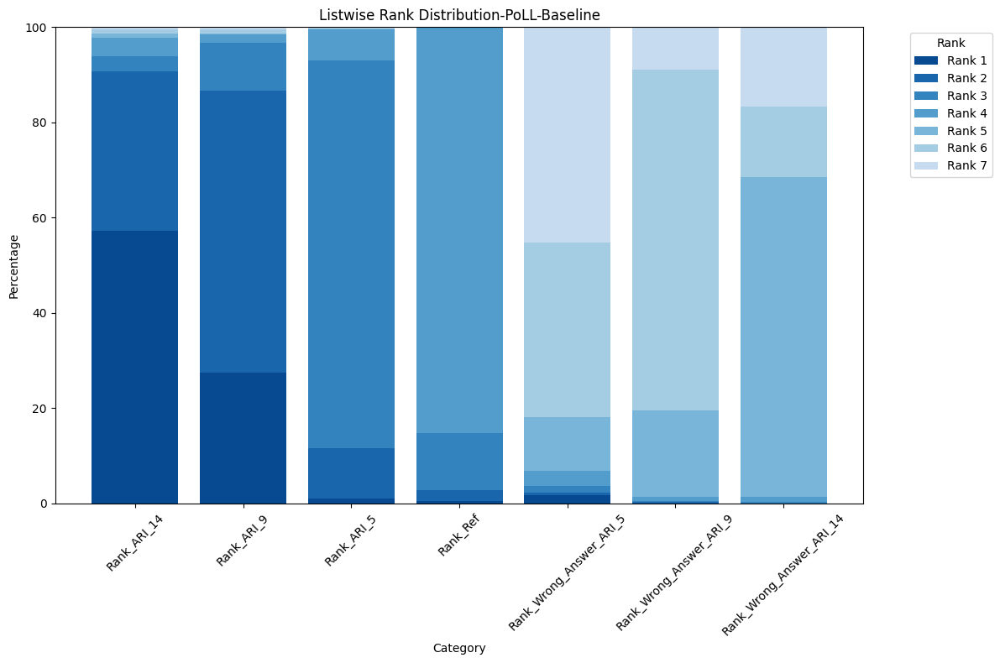

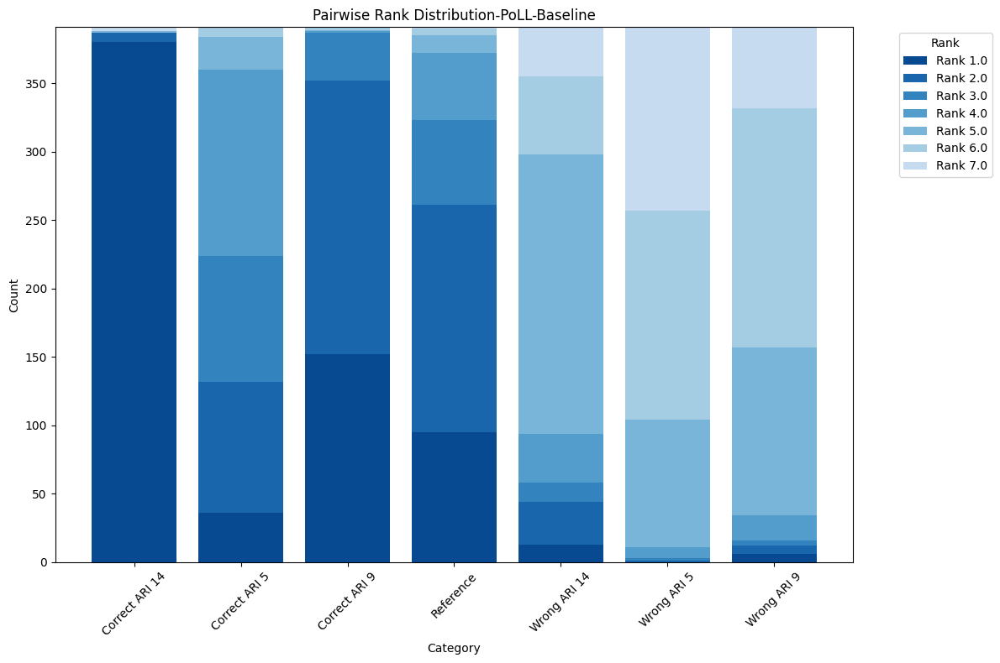

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.violinplot(x="score_name", y="score", data=melted, palette=palette, ax=ax)


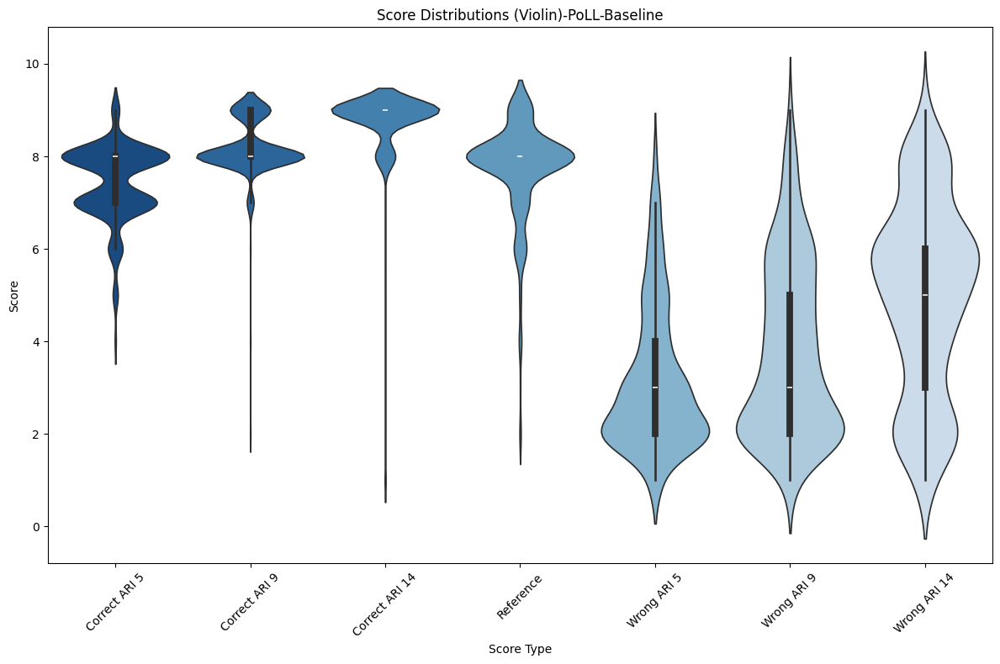

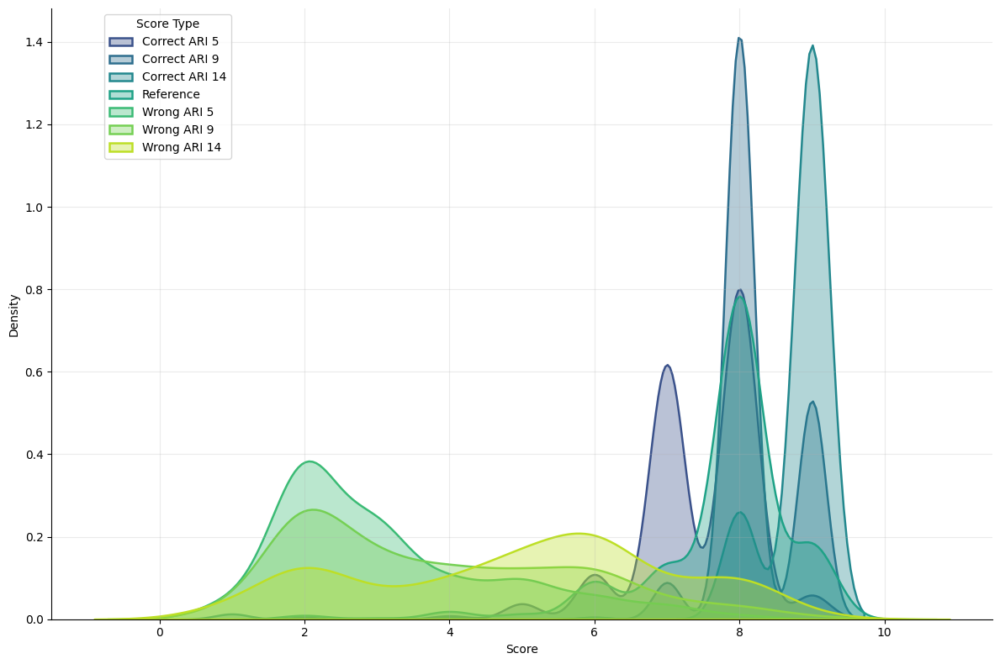

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

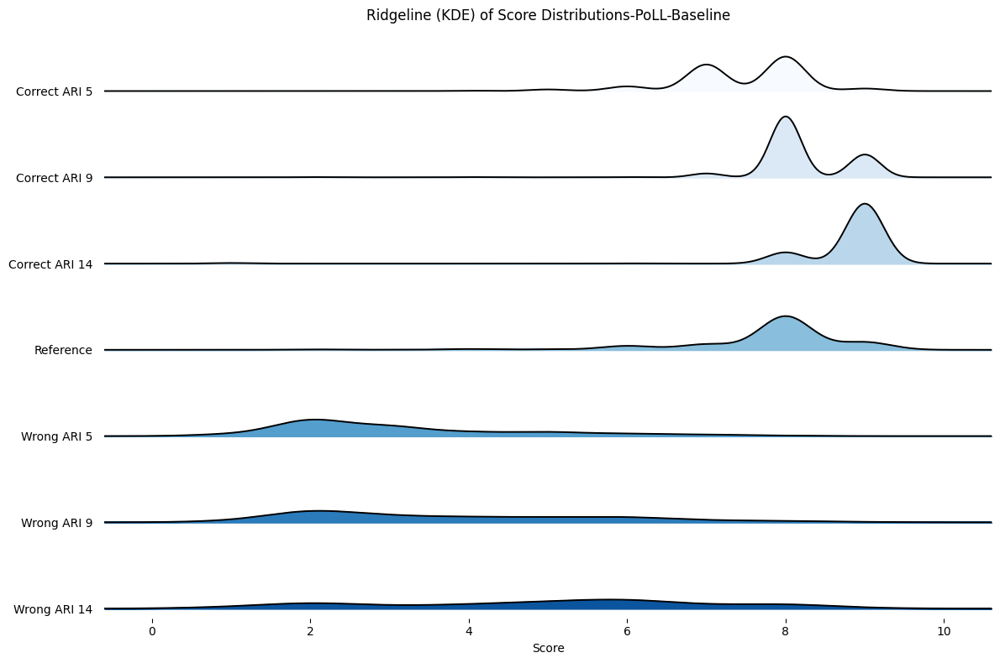

In [61]:
plot_trend_graphs(poll_score, poll_baseline,"PoLL-Baseline")

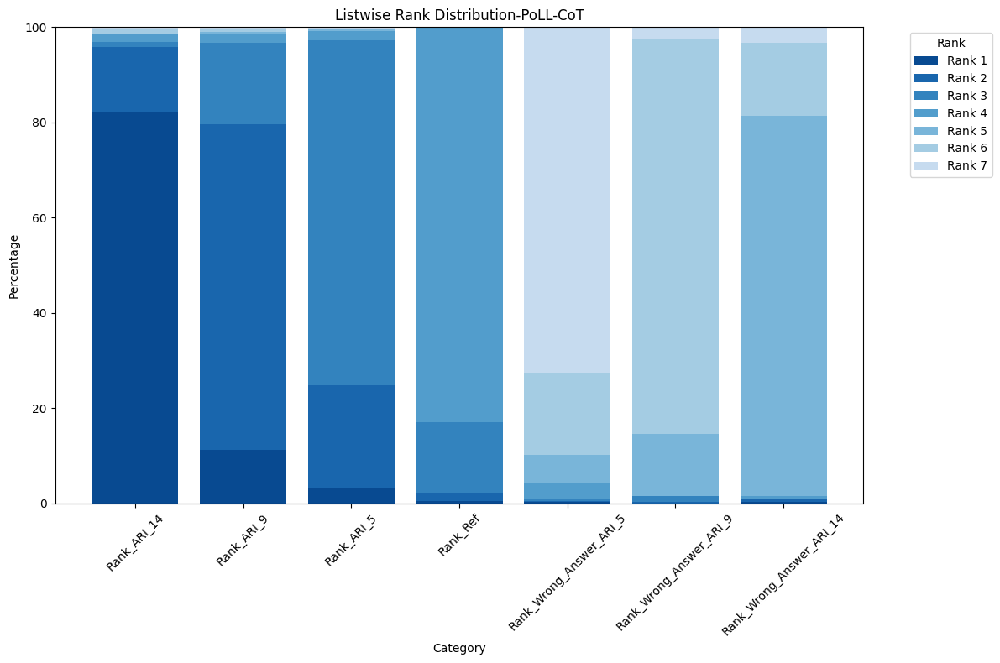

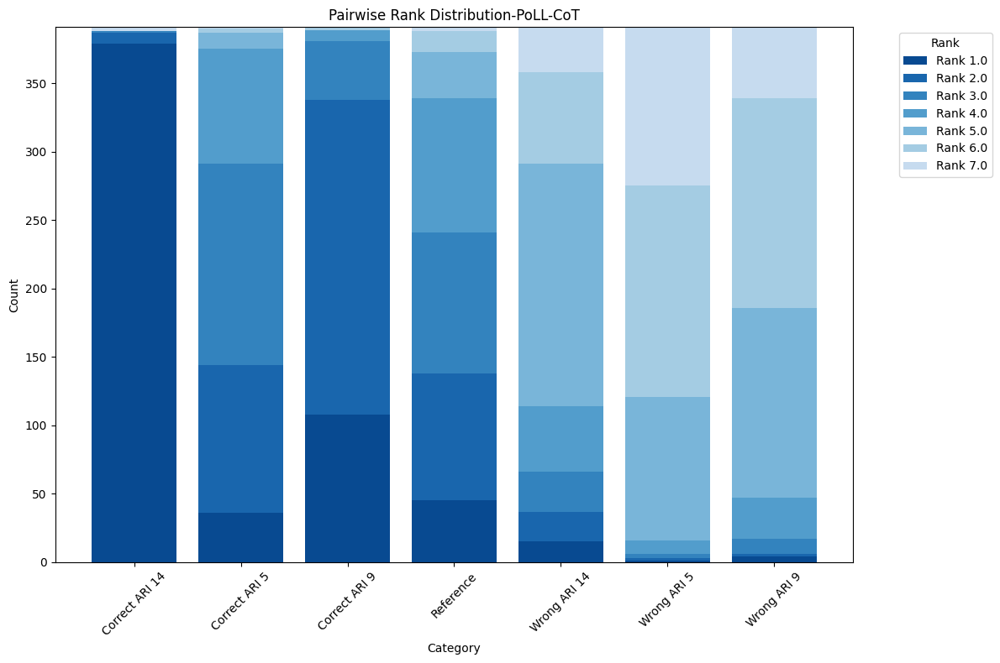

c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  rename_map: Optional[Mapping[str, str]] = None,
c:\Users\apareek\WorkStation\llm_evaluator_ari_evaluation\thesis_project\reports\llm_eval_plots.py:184: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  rename_map: Optional[Mapping[str, str]] = None,


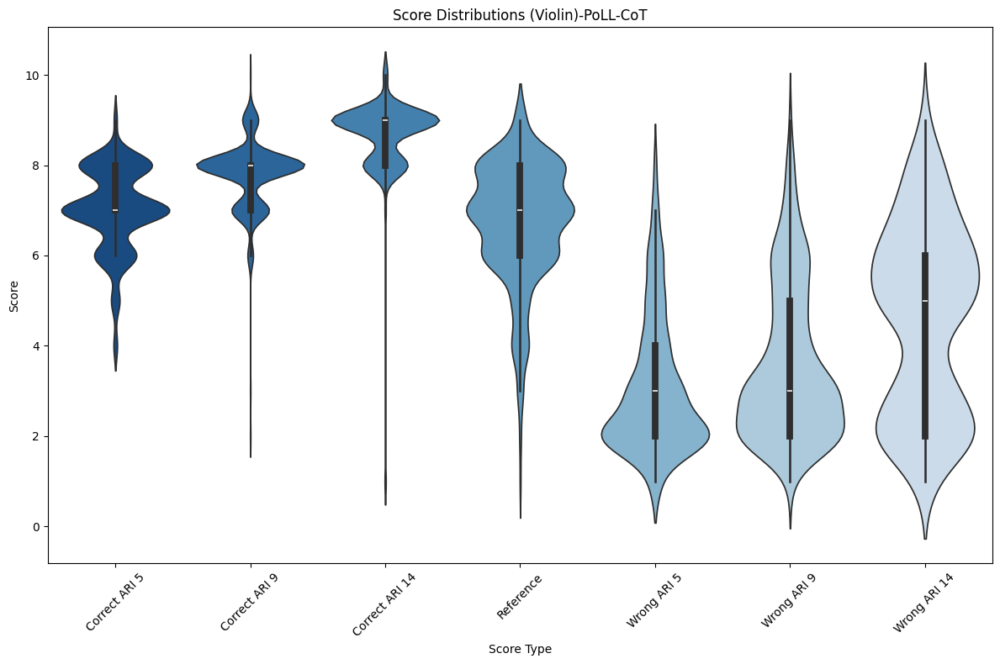

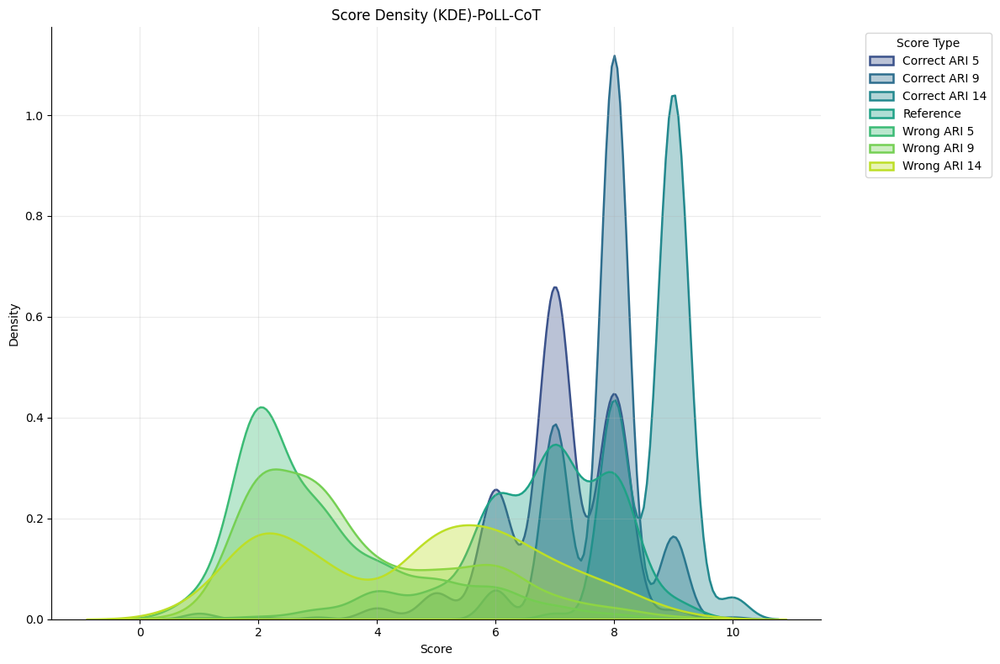

AttributeError: 'LLMEvalVisualizer' object has no attribute 'plot_confusion_matrices'

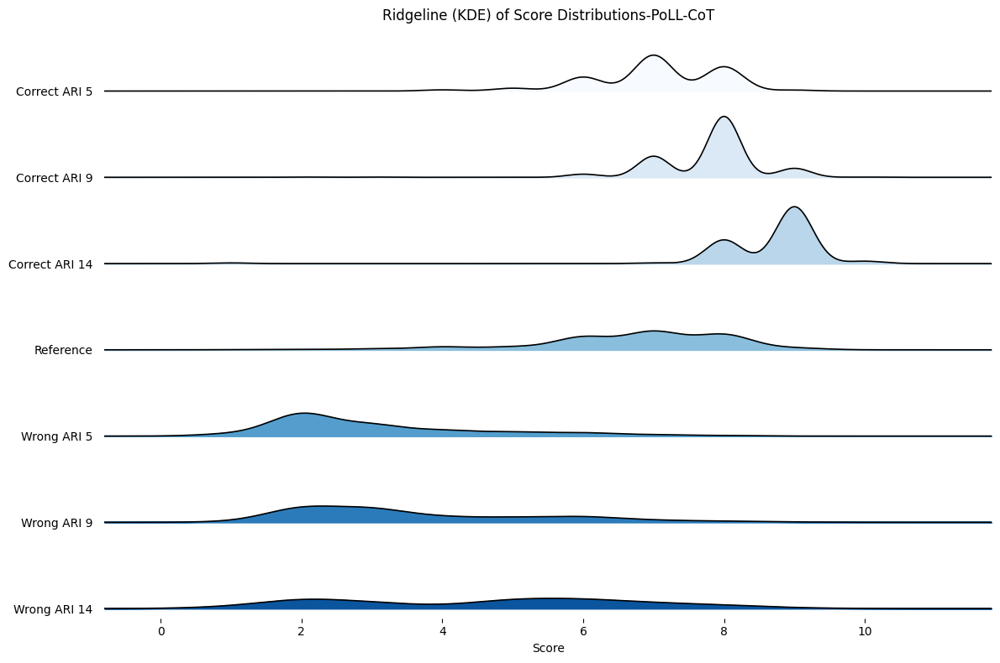

In [130]:
plot_trend_graphs(poll_cot_score, poll_cot_rank,"PoLL-CoT")

In [33]:
import numpy as np
import pandas as pd
from scipy.stats import spearmanr, norm

# -----------------------
# 0) Small utilities
# -----------------------
def wilson_ci(k, n, alpha=0.05):
    if n == 0: return (np.nan, np.nan)
    z = norm.ppf(1 - alpha/2)
    p = k / n
    denom = 1 + z**2/n
    center = (p + z*z/(2*n)) / denom
    half = z*np.sqrt((p*(1-p)/n) + (z*z/(4*n*n))) / denom
    return (center - half, center + half)

def cochran_armitage_trend(successes, totals, scores=None):
    """
    successes, totals: arrays of length K (for ARI 5,9,14)
    scores: numeric scores for groups (default: [1,2,3])
    Returns Z, p (one-sided for increasing trend).
    """
    successes = np.asarray(successes, dtype=float)
    totals    = np.asarray(totals, dtype=float)
    if scores is None:
        scores = np.arange(1, len(successes)+1, dtype=float)
    else:
        scores = np.asarray(scores, dtype=float)

    N  = totals.sum()
    p  = successes.sum() / N
    wbar = np.sum(totals * scores) / N
    T = np.sum(scores * (successes - totals * p))
    VarT = p*(1-p) * np.sum(totals * (scores - wbar)**2)
    Z = T / np.sqrt(VarT) if VarT > 0 else np.nan
    # one-sided p for *increasing* trend
    pval = 1 - norm.cdf(Z)
    return Z, pval

# -----------------------
# 1) Trend in DEFAULT baseline (no perturbation)
# -----------------------
def trend_default_scoring(score_df, cols=('Score_ARI_5','Score_ARI_9','Score_ARI_14')):
    """Spearman trend of baseline scores vs ARI (5<9<14). Higher is better."""
    all_vals, all_ari = [], []
    for ari, c in zip([5,9,14], cols):
        vals = score_df[c].astype(float).to_numpy()
        all_vals.append(vals)
        all_ari.append(np.full_like(vals, ari, dtype=float))
    y = np.concatenate(all_vals)
    x = np.concatenate(all_ari)
    rho, p = spearmanr(x, y, nan_policy='omit')
    return {'rho': rho, 'p': p,
            'medians': {a: float(np.nanmedian(v)) for a, v in zip([5,9,14], all_vals)}}

def trend_default_ranking(rank_df, cols=('Rank_ARI_5','Rank_ARI_9','Rank_ARI_14')):
    """
    Spearman trend of baseline 'rank quality' vs ARI.
    We convert rank (1=best) to quality = 8 - rank so higher is better.
    """
    all_vals, all_ari = [], []
    for ari, c in zip([5,9,14], cols):
        q = 8 - rank_df[c].astype(float).to_numpy()  # quality: higher = better
        all_vals.append(q)
        all_ari.append(np.full_like(q, ari, dtype=float))
    y = np.concatenate(all_vals)
    x = np.concatenate(all_ari)
    rho, p = spearmanr(x, y, nan_policy='omit')
    return {'rho': rho, 'p': p,
            'medians_quality': {a: float(np.nanmedian(v)) for a, v in zip([5,9,14], all_vals)}}

# -----------------------
# 2) RR / CR per ARI (your minimal definitions)
# -----------------------
def rr_scoring_per_ari(base, pert, score_col, eps=1.0):
    """Robustness for scores: max |Δ| ≤ eps across answers in that column (here a single wrong/correct col)."""
    s0 = base[score_col].astype(float).to_numpy()
    s1 = pert[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - s1) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_scoring_per_ari(base, repeat, score_col, eps=1.0):
    s0 = base[score_col].astype(float).to_numpy()
    sR = repeat[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - sR) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def rr_ranking_bin_per_ari(base, pert, rank_col):
    """Robustness for ranks: stay in same bin Top[1–3]/Bottom[4–7]."""
    r0 = base[rank_col].astype(int).to_numpy()
    r1 = pert[rank_col].astype(int).to_numpy()
    bin0 = r0 <= 3
    bin1 = r1 <= 3
    stable = (bin0 == bin1)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_ranking_bin_per_ari(base, repeat, rank_col):
    r0 = base[rank_col].astype(int).to_numpy()
    rR = repeat[rank_col].astype(int).to_numpy()
    bin0 = r0 <= 3
    binR = rR <= 3
    stable = (bin0 == binR)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

# -----------------------
# 3) One trend test over ARI for RR/CR (optional)
# -----------------------
def trend_over_ari_for_rates(results_by_ari):
    """
    results_by_ari: dict like {5:{'k':..,'n':..}, 9:{...}, 14:{...}}
    Uses Cochran–Armitage trend test (increasing with ARI: 5<9<14).
    """
    aris = [5,9,14]
    successes = [results_by_ari[a]['k'] for a in aris]
    totals    = [results_by_ari[a]['n'] for a in aris]
    # scores aligned with order; we can use [1,2,3] (linear in ARI order)
    Z, p = cochran_armitage_trend(successes, totals, scores=[1,2,3])
    return {'Z': Z, 'p_one_sided_inc': p, 'props': [s/t for s,t in zip(successes, totals)]}


In [34]:
rank_df_baseline = rank_df
score_df_baseline = score_df

In [35]:
score_df_perturbed = pd.read_csv("../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv")
score_df_repeat = pd.read_csv("../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv")
rank_df_perturbed = pd.read_csv("../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv")
rank_df_repeat = pd.read_csv("../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv")

In [36]:
score_df_perturbed_jari5 = pd.read_csv("../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv")
score_df_perturbed_jari9 = pd.read_csv("../resultFiles/GPT4/Jari/Score/gpt4_jari9_all_score_baseline1.csv")
score_df_perturbed_jari14= pd.read_csv("../resultFiles/GPT4/Jari/Score/gpt4_jari14_all_score_baseline1.csv")

In [37]:
rank_df_perturbed_jari5 = pd.read_csv("../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv")
rank_df_perturbed_jari9 = pd.read_csv("../resultFiles/GPT4/Jari/Rank/gpt4_jari9_ref_ari_rank_baseline1.csv")
rank_df_perturbed_jari14 = pd.read_csv("../resultFiles/GPT4/Jari/Rank/gpt4_jari14_ref_ari_rank_baseline1.csv")

In [38]:
# 1) Default trend (no perturbation)
sc_trend = trend_default_scoring(score_df_baseline,
                                 ('Score_ARI_5','Score_ARI_9','Score_ARI_14'))
rk_trend = trend_default_ranking(rank_df_baseline,
                                 ('Rank_ARI_5','Rank_ARI_9','Rank_ARI_14'))
print("Scores trend (Spearman):", sc_trend)
print("Rank-quality trend (Spearman):", rk_trend)

# 2) RR and CR per ARI (example with “correct” columns; repeat for wrong-answer cols if needed)
rr_score = {
    5: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_5'),
    9: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_9'),
    14: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_14')
}
cr_score = {
    5: cr_scoring_per_ari(score_df_baseline, score_df_repeat, 'Score_ARI_5'),
    9: cr_scoring_per_ari(score_df_baseline, score_df_repeat, 'Score_ARI_9'),
    14: cr_scoring_per_ari(score_df_baseline, score_df_repeat, 'Score_ARI_14')
}

rr_rank = {
    5: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_5'),
    9: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_9'),
    14: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_14')
}
cr_rank = {
    5: cr_ranking_bin_per_ari(rank_df_baseline, rank_df_repeat, 'Rank_ARI_5'),
    9: cr_ranking_bin_per_ari(rank_df_baseline, rank_df_repeat, 'Rank_ARI_9'),
    14: cr_ranking_bin_per_ari(rank_df_baseline, rank_df_repeat, 'Rank_ARI_14')
}

# (Optional) single ordered trend test over ARI for those rates:
print("RR-score trend:", trend_over_ari_for_rates(rr_score))
print("CR-score trend:", trend_over_ari_for_rates(cr_score))
print("RR-rank trend:", trend_over_ari_for_rates(rr_rank))
print("CR-rank trend:", trend_over_ari_for_rates(cr_rank))


Scores trend (Spearman): {'rho': np.float64(0.5078711505712511), 'p': np.float64(6.3850820100792485e-78), 'medians': {5: 9.0, 9: 10.0, 14: 10.0}}
Rank-quality trend (Spearman): {'rho': np.float64(0.6733760444823687), 'p': np.float64(8.472508367482845e-156), 'medians_quality': {5: 5.0, 9: 6.0, 14: 7.0}}
RR-score trend: {'Z': np.float64(-25.417272648576585), 'p_one_sided_inc': np.float64(1.0), 'props': [0.9002557544757033, 0.969309462915601, 0.023017902813299233]}
CR-score trend: {'Z': np.float64(7.017911281526601), 'p_one_sided_inc': np.float64(1.1260992138772963e-12), 'props': [0.80306905370844, 0.8184143222506394, 0.9744245524296675]}
RR-rank trend: {'Z': np.float64(-15.246362453006403), 'p_one_sided_inc': np.float64(1.0), 'props': [0.9386189258312021, 0.8107416879795396, 0.4578005115089514]}
CR-rank trend: {'Z': np.float64(-1.31712828009376), 'p_one_sided_inc': np.float64(0.9061021854753886), 'props': [0.9769820971867008, 0.979539641943734, 0.9616368286445013]}


In [39]:
rr_score_jari5 = {
    5: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_5'),
    9: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_9'),
    14: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, 'Score_ARI_14')
}

rr_rank = {
    5: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_5'),
    9: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_9'),
    14: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, 'Rank_ARI_14')
}

# (Optional) single ordered trend test over ARI for those rates:
print("RR-score trend:", trend_over_ari_for_rates(rr_score))
print("CR-score trend:", trend_over_ari_for_rates(cr_score))
print("RR-rank trend:", trend_over_ari_for_rates(rr_rank))
print("CR-rank trend:", trend_over_ari_for_rates(cr_rank))

RR-score trend: {'Z': np.float64(-25.417272648576585), 'p_one_sided_inc': np.float64(1.0), 'props': [0.9002557544757033, 0.969309462915601, 0.023017902813299233]}
CR-score trend: {'Z': np.float64(7.017911281526601), 'p_one_sided_inc': np.float64(1.1260992138772963e-12), 'props': [0.80306905370844, 0.8184143222506394, 0.9744245524296675]}
RR-rank trend: {'Z': np.float64(-15.246362453006403), 'p_one_sided_inc': np.float64(1.0), 'props': [0.9386189258312021, 0.8107416879795396, 0.4578005115089514]}
CR-rank trend: {'Z': np.float64(-1.31712828009376), 'p_one_sided_inc': np.float64(0.9061021854753886), 'props': [0.9769820971867008, 0.979539641943734, 0.9616368286445013]}


In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from scipy.stats import spearmanr, norm

# ---------- small utilities ----------
def wilson_ci(k, n, alpha=0.05):
    if n == 0:
        return (np.nan, np.nan)
    z = norm.ppf(1 - alpha/2)
    p = k / n
    denom = 1 + z**2/n
    center = (p + z*z/(2*n)) / denom
    half = z*np.sqrt((p*(1-p)/n) + (z*z/(4*n*n))) / denom
    return (center - half, center + half)

def _ari_palette(cmap='Blues'):
    cmap = plt.get_cmap(cmap)
    # light→dark for 5,9,14 (14 darkest)
    cols = [cmap(v) for v in [0.55, 0.72, 0.88]]
    return {5: cols[0], 9: cols[1], 14: cols[2]}

# # ---------- 1) Baseline trend plots ----------
# def plot_baseline_trend_scores(score_df_baseline,
#                                score_cols=('Score_ARI_5','Score_ARI_9','Score_ARI_14'),
#                                title='Baseline scores vs ARI (higher = better)'):
#     tidy = []
#     for ari, col in zip([5,9,14], score_cols):
#         x = pd.DataFrame({'ARI': ari, 'score': score_df_baseline[col].astype(float)})
#         tidy.append(x)
#     tidy = pd.concat(tidy, ignore_index=True)
#     pal = _ari_palette()

#     fig, ax = plt.subplots(figsize=(7.5, 5))
#     sns.violinplot(data=tidy, x='ARI', y='score',
#                    palette=[pal[a] for a in [5,9,14]], ax=ax, cut=0, inner='box')
#     # Spearman trend (monotonic)
#     rho, p = spearmanr(tidy['ARI'].to_numpy(), tidy['score'].to_numpy(), nan_policy='omit')
#     ax.set_title(f"{title}\nSpearman ρ={rho:.2f}, p={p:.3g}")
#     ax.set_xlabel("ARI"); ax.set_ylabel("Score")
#     plt.tight_layout(); plt.show()

# def plot_baseline_trend_rankquality(rank_df_baseline,
#                                     rank_cols=('Rank_ARI_5','Rank_ARI_9','Rank_ARI_14'),
#                                     title='Baseline rank-quality vs ARI (quality = 8 - rank)'):
#     tidy = []
#     for ari, col in zip([5,9,14], rank_cols):
#         q = 8 - rank_df_baseline[col].astype(float)  # 1(best)→7(worst) becomes 7→1
#         x = pd.DataFrame({'ARI': ari, 'quality': q})
#         tidy.append(x)
#     tidy = pd.concat(tidy, ignore_index=True)
#     pal = _ari_palette()

#     fig, ax = plt.subplots(figsize=(7.5, 5))
#     sns.violinplot(data=tidy, x='ARI', y='quality',
#                    palette=[pal[a] for a in [5,9,14]], ax=ax, cut=0, inner='box')
#     rho, p = spearmanr(tidy['ARI'].to_numpy(), tidy['quality'].to_numpy(), nan_policy='omit')
#     ax.set_title(f"{title}\nSpearman ρ={rho:.2f}, p={p:.3g}")
#     ax.set_xlabel("ARI"); ax.set_ylabel("Rank-quality (higher = better)")
#     plt.tight_layout(); plt.show()

# ---------- 2) RR/CR bars with Wilson CIs ----------
def _plot_rate_bars(rate_dict, title, ax=None, top_pad=0.06, inside_thresh=0.92):
    """
    rate_dict like {5:{'rate':r,'k':k,'n':n,'ci':(lo,hi)}, 9:{...}, 14:{...}}
    top_pad: extra headroom added above the tallest bar+err
    inside_thresh: if rate >= this, place k/n label inside bar
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)

    order = [5, 9, 14]
    rates = [rate_dict[a]['rate'] for a in order]
    # asymmetric CI lengths
    lo_err = [max(0.0, rates[i] - rate_dict[order[i]]['ci'][0]) for i in range(3)]
    hi_err = [max(0.0, rate_dict[order[i]]['ci'][1] - rates[i]) for i in range(3)]

    # colors (14 darkest)
    cmap = plt.get_cmap("Blues")
    cols = {5: cmap(0.55), 9: cmap(0.72), 14: cmap(0.88)}

    # bars
    bars = ax.bar([str(a) for a in order], rates,
                  yerr=[lo_err, hi_err], capsize=4,
                  color=[cols[a] for a in order], edgecolor='none')

    # --- dynamic headroom ---
    max_bar = max(r + h for r, h in zip(rates, hi_err))
    y_top = max_bar + top_pad
    # If still <=1, cap at a bit below 1 to leave space for title; else allow 1.05 so labels don’t clip
    if y_top <= 1.0:
        ax.set_ylim(0, max(0.8, min(0.98, y_top)))
    else:
        ax.set_ylim(0, 1.05)
        # keep ticks ending at 100% even if ylim is 1.05
        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

    # formatting
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_xlabel("ARI"); ax.set_ylabel("Rate")
    ax.set_title(title, pad=10)

    # annotations (k/n): place inside for very tall bars, above otherwise
    for xi, a in enumerate(order):
        k, n = rate_dict[a]['k'], rate_dict[a]['n']
        y = rates[xi]
        if y >= inside_thresh:
            # inside bar (white, bold), a little below top of bar
            ax.text(xi, y - 0.04, f"{k}/{n}",
                    ha='center', va='top', fontsize=9,
                    color='white', fontweight='bold', clip_on=False)
        else:
            # above bar (outside), but clamp just below axis top
            y_annot = min(y + 0.03, ax.get_ylim()[1] - 0.03)
            ax.text(xi, y_annot, f"{k}/{n}",
                    ha='center', va='bottom', fontsize=9)

    ax.grid(True, axis='y', alpha=0.2)
    return ax

def plot_rr_cr_grid(rr_score, cr_score, rr_rank, cr_rank):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=True)
    _plot_rate_bars(rr_score, "RR — Scores (±1 stable)", ax=axes[0,0])
    _plot_rate_bars(cr_score, "CR — Scores (±1 stable)", ax=axes[0,1])
    _plot_rate_bars(rr_rank,  "RR — Ranks (bin stable: [1–3]/[4–7])", ax=axes[1,0])
    _plot_rate_bars(cr_rank,  "CR — Ranks (bin stable: [1–3]/[4–7])", ax=axes[1,1])
    for ax in axes.ravel():
        ax.margins(x=0.1)  # small side padding
    plt.show()


# --- 1) Build WRONG-ANSWER dicts (mirrors your 'correct' dicts) ---
def build_wrong_answer_rr_cr_dicts(
    score_df_baseline, score_df_repeat, score_df_perturbed,
    rank_df_baseline,  rank_df_repeat,  rank_df_perturbed,
    eps=1.0
):
    wrong_score_cols = {5:'Score_Wrong_Answer_ARI_5',
                        9:'Score_Wrong_Answer_ARI_9',
                        14:'Score_Wrong_Answer_ARI_14'}
    wrong_rank_cols  = {5:'Rank_Wrong_Answer_ARI_5',
                        9:'Rank_Wrong_Answer_ARI_9',
                        14:'Rank_Wrong_Answer_ARI_14'}

    rr_score_wrong = {k: rr_scoring_per_ari(score_df_baseline, score_df_perturbed, col, eps=eps)
                      for k, col in wrong_score_cols.items()}
    cr_score_wrong = {k: cr_scoring_per_ari(score_df_baseline, score_df_repeat,    col, eps=eps)
                      for k, col in wrong_score_cols.items()}

    rr_rank_wrong  = {k: rr_ranking_bin_per_ari(rank_df_baseline, rank_df_perturbed, col)
                      for k, col in wrong_rank_cols.items()}
    cr_rank_wrong  = {k: cr_ranking_bin_per_ari(rank_df_baseline, rank_df_repeat,    col)
                      for k, col in wrong_rank_cols.items()}

    return rr_score_wrong, cr_score_wrong, rr_rank_wrong, cr_rank_wrong

# --- 2) 2×4 grid: row=Correct/Wrong, col=RR/CR × (Scores/Ranks) ---
def plot_rr_cr_grid_both(
    rr_score_correct, cr_score_correct, rr_rank_correct, cr_rank_correct,
    rr_score_wrong,   cr_score_wrong,   rr_rank_wrong,   cr_rank_wrong,
    *,
    row_titles=("Correct answers", "Wrong answers"),
    left_pad=0.14,         # increase if labels still clip
    row_label_pad=0.02,    # distance of row label from axes (figure fraction)
):
    # Do NOT use constrained_layout; we’ll control margins manually.
    fig, axes = plt.subplots(2, 4, figsize=(16, 8), sharey=True, constrained_layout=False)

    col_titles = ["RR — Scores (±1 stable)", "CR — Scores (±1 stable)",
                  "RR — Ranks (bin [1–3]/[4–7])", "CR — Ranks (bin [1–3]/[4–7])"]

    # Top row = Correct
    _plot_rate_bars(rr_score_correct, col_titles[0], ax=axes[0,0])
    _plot_rate_bars(cr_score_correct, col_titles[1], ax=axes[0,1])
    _plot_rate_bars(rr_rank_correct,  col_titles[2], ax=axes[0,2])
    _plot_rate_bars(cr_rank_correct,  col_titles[3], ax=axes[0,3])

    # Bottom row = Wrong
    _plot_rate_bars(rr_score_wrong,   col_titles[0], ax=axes[1,0])
    _plot_rate_bars(cr_score_wrong,   col_titles[1], ax=axes[1,1])
    _plot_rate_bars(rr_rank_wrong,    col_titles[2], ax=axes[1,2])
    _plot_rate_bars(cr_rank_wrong,    col_titles[3], ax=axes[1,3])

    # Light grid + small x margins
    for ax in axes.ravel():
        ax.grid(True, axis='y', alpha=0.2)
        ax.margins(x=0.10)

    # Make room on the left for row labels
    fig.subplots_adjust(left=left_pad, right=0.98, top=0.92, bottom=0.08, wspace=0.25, hspace=0.35)

    # Helper to place a row label aligned to that row’s axes block
    def _add_row_label(fig, axes_row, text, pad=row_label_pad, fontsize=12):
        bboxes = [ax.get_position() for ax in axes_row]
        x = min(bb.x0 for bb in bboxes) - pad
        y = np.mean([bb.y0 + bb.height/2 for bb in bboxes])
        x = max(x, 0.01)  # don’t go off-canvas
        fig.text(x, y, text, rotation=90, va='center', ha='right',
                 fontsize=fontsize, fontweight='bold')

    _add_row_label(fig, axes[0, :], row_titles[0])
    _add_row_label(fig, axes[1, :], row_titles[1])

    plt.show()


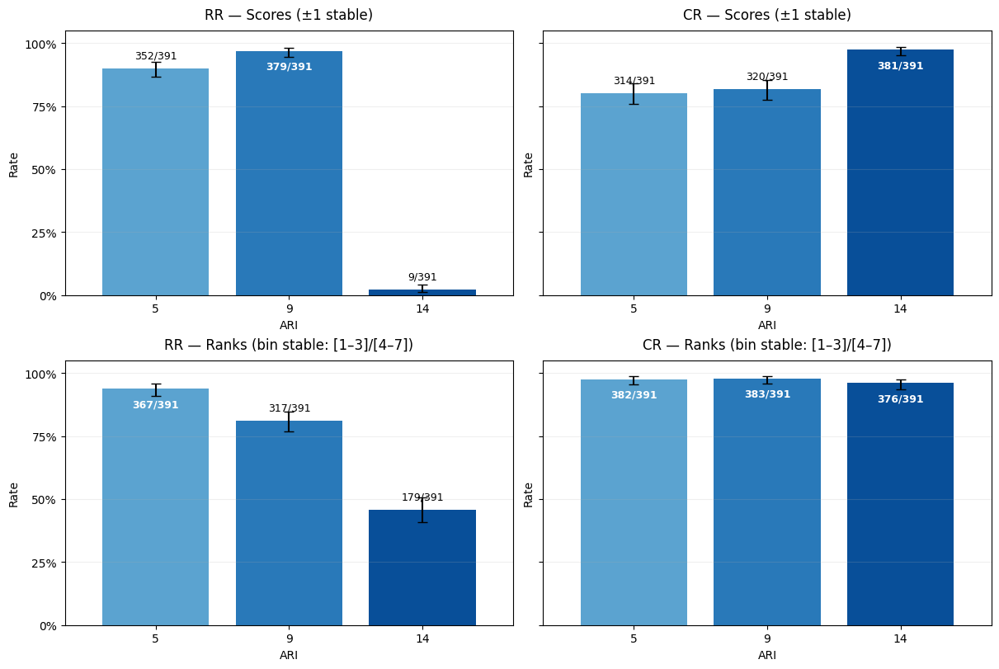

In [53]:
# 1) Baseline trend (no perturbation)
# plot_baseline_trend_scores(
#     score_df_baseline,
#     score_cols=('Score_ARI_5','Score_ARI_9','Score_ARI_14')
# )
# plot_baseline_trend_rankquality(
#     rank_df_baseline,
#     rank_cols=('Rank_ARI_5','Rank_ARI_9','Rank_ARI_14')
# )

# 2) RR/CR grid — use the dicts you computed earlier
# rr_score = {5:{'rate':..., 'k':..., 'n':..., 'ci':(...)}, 9:{...}, 14:{...}}
# cr_score, rr_rank, cr_rank similarly.
plot_rr_cr_grid(rr_score, cr_score, rr_rank, cr_rank)


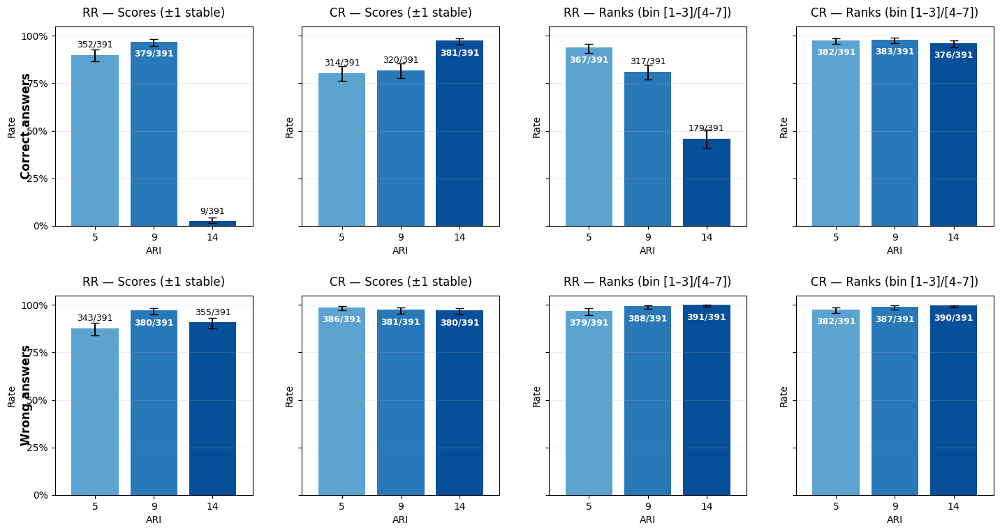

In [41]:
# You already have the 'correct' dicts:
# rr_score, cr_score, rr_rank, cr_rank  (for Correct answers)

# Build WRONG dicts (baseline/repeat/perturbed DataFrames must be aligned row-wise)
(rr_score_wrong, cr_score_wrong,
 rr_rank_wrong,  cr_rank_wrong) = build_wrong_answer_rr_cr_dicts(
    score_df_baseline, score_df_repeat, score_df_perturbed,
    rank_df_baseline,  rank_df_repeat,  rank_df_perturbed,
    eps=1.0
)

# Plot 2×4 grid (Correct on top, Wrong at bottom)
plot_rr_cr_grid_both(rr_score, cr_score, rr_rank, cr_rank,
                     rr_score_wrong, cr_score_wrong, rr_rank_wrong, cr_rank_wrong)


In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from scipy.stats import norm

# -------------------------
# I/O convenience
# -------------------------
def _read_df(x):
    if isinstance(x, str):
        return pd.read_csv(x)
    return x.copy()

# -------------------------
# Proportion CI (Wilson)
# -------------------------
def wilson_ci(k, n, alpha=0.05):
    if n == 0: return (np.nan, np.nan)
    z = norm.ppf(1 - alpha/2)
    p = k / n
    denom = 1 + z**2/n
    center = (p + z*z/(2*n)) / denom
    half = z*np.sqrt((p*(1-p)/n) + (z*z/(4*n*n))) / denom
    return (center - half, center + half)

# -------------------------
# Metric kernels (per ARI column)
# -------------------------
def rr_scoring_per_ari(base, pert, score_col, eps=1.0):
    s0 = base[score_col].astype(float).to_numpy()
    s1 = pert[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - s1) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_scoring_per_ari(base, repeat, score_col, eps=1.0):
    s0 = base[score_col].astype(float).to_numpy()
    sR = repeat[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - sR) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def rr_ranking_bin_per_ari(base, pert, rank_col):
    r0 = base[rank_col].astype(int).to_numpy()
    r1 = pert[rank_col].astype(int).to_numpy()
    bin0 = (r0 <= 3)  # Top bin [1–3]
    bin1 = (r1 <= 3)
    stable = (bin0 == bin1)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_ranking_bin_per_ari(base, repeat, rank_col):
    r0 = base[rank_col].astype(int).to_numpy()
    rR = repeat[rank_col].astype(int).to_numpy()
    bin0 = (r0 <= 3)
    binR = (rR <= 3)
    stable = (bin0 == binR)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

# -------------------------
# Build RR/CR dicts (Correct + Wrong)
# -------------------------
_CORR_SCORE = {5:'Score_ARI_5', 9:'Score_ARI_9', 14:'Score_ARI_14'}
_WRONG_SCORE = {5:'Score_Wrong_Answer_ARI_5', 9:'Score_Wrong_Answer_ARI_9', 14:'Score_Wrong_Answer_ARI_14'}
_CORR_RANK  = {5:'Rank_ARI_5',  9:'Rank_ARI_9',  14:'Rank_ARI_14'}
_WRONG_RANK = {5:'Rank_Wrong_Answer_ARI_5', 9:'Rank_Wrong_Answer_ARI_9', 14:'Rank_Wrong_Answer_ARI_14'}

def build_rr_dicts(
    score_base, score_pert, rank_base, rank_pert, order=(5,9,14), eps=1.0
):
    rr_score_correct = {a: rr_scoring_per_ari(score_base, score_pert, _CORR_SCORE[a], eps=eps) for a in order}
    rr_score_wrong   = {a: rr_scoring_per_ari(score_base, score_pert, _WRONG_SCORE[a], eps=eps) for a in order}
    rr_rank_correct  = {a: rr_ranking_bin_per_ari(rank_base, rank_pert, _CORR_RANK[a]) for a in order}
    rr_rank_wrong    = {a: rr_ranking_bin_per_ari(rank_base, rank_pert, _WRONG_RANK[a]) for a in order}
    return rr_score_correct, rr_score_wrong, rr_rank_correct, rr_rank_wrong

def build_cr_dicts(
    score_base, score_repeat, rank_base, rank_repeat, order=(5,9,14), eps=1.0
):
    cr_score_correct = {a: cr_scoring_per_ari(score_base, score_repeat, _CORR_SCORE[a], eps=eps) for a in order}
    cr_score_wrong   = {a: cr_scoring_per_ari(score_base, score_repeat, _WRONG_SCORE[a], eps=eps) for a in order}
    cr_rank_correct  = {a: cr_ranking_bin_per_ari(rank_base, rank_repeat, _CORR_RANK[a]) for a in order}
    cr_rank_wrong    = {a: cr_ranking_bin_per_ari(rank_base, rank_repeat, _WRONG_RANK[a]) for a in order}
    return cr_score_correct, cr_score_wrong, cr_rank_correct, cr_rank_wrong

# -------------------------
# Bar plot (with headroom & smart labels)
# -------------------------
def _plot_rate_bars(rate_dict, title, ax=None, top_pad=0.06, inside_thresh=0.92):
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,4))
    order = [5,9,14]
    rates = [rate_dict[a]['rate'] for a in order]
    lo_err = [max(0.0, rates[i] - rate_dict[order[i]]['ci'][0]) for i in range(3)]
    hi_err = [max(0.0, rate_dict[order[i]]['ci'][1] - rates[i]) for i in range(3)]

    cmap = plt.get_cmap("Blues")
    cols = {5: cmap(0.55), 9: cmap(0.72), 14: cmap(0.88)}

    ax.bar([str(a) for a in order], rates,
           yerr=[lo_err, hi_err], capsize=4,
           color=[cols[a] for a in order], edgecolor='none')

    max_bar = max(r + h for r, h in zip(rates, hi_err))
    y_top = max_bar + top_pad
    if y_top <= 1.0:
        ax.set_ylim(0, max(0.8, min(0.98, y_top)))
    else:
        ax.set_ylim(0, 1.05)
        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_xlabel("ARI"); ax.set_ylabel("Rate")
    ax.set_title(title, pad=10)

    for xi, a in enumerate(order):
        k, n = rate_dict[a]['k'], rate_dict[a]['n']
        y = rates[xi]
        if y >= inside_thresh:
            ax.text(xi, y - 0.04, f"{k}/{n}", ha='center', va='top',
                    fontsize=9, color='white', fontweight='bold', clip_on=False)
        else:
            y_annot = min(y + 0.03, ax.get_ylim()[1] - 0.03)
            ax.text(xi, y_annot, f"{k}/{n}", ha='center', va='bottom', fontsize=9)
    ax.grid(True, axis='y', alpha=0.2)
    ax.margins(x=0.10)
    return ax



In [43]:

def plot_rr_grid(
    rr_score_correct, rr_score_wrong, rr_rank_correct, rr_rank_wrong,
    label_suffix="", left_pad=0.24, row_label_offset=-0.34
):
    # Use manual layout (no constrained_layout)
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)

    _plot_rate_bars(rr_score_correct, f"RR — Scores (±1 stable){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,0])
    _plot_rate_bars(rr_rank_correct,  f"RR — Ranks (bin [1–3]/[4–7]){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,1])
    _plot_rate_bars(rr_score_wrong,   f"RR — Scores (Wrong, ±1 stable){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,0])
    _plot_rate_bars(rr_rank_wrong,    f"RR — Ranks (Wrong, bin [1–3]/[4–7]){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,1])

    # Light grid + small x-margins
    for ax in axes.ravel():
        ax.grid(True, axis='y', alpha=0.2)
        ax.margins(x=0.10)

    # Make room on the left for row labels
    fig.subplots_adjust(left=left_pad, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)

    # Row labels: pinned to leftmost axes of each row with negative x in Axes coords
    axes[0,0].text(row_label_offset, 0.5, "Correct answers",
                   transform=axes[0,0].transAxes, rotation=90,
                   va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(row_label_offset, 0.5, "Wrong answers",
                   transform=axes[1,0].transAxes, rotation=90,
                   va='center', ha='right', fontsize=12, fontweight='bold')

    plt.show()


def plot_cr_grid(
    cr_score_correct, cr_score_wrong, cr_rank_correct, cr_rank_wrong,
    label_suffix="", left_pad=0.24, row_label_offset=-0.34
):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)

    _plot_rate_bars(cr_score_correct, f"CR — Scores (±1 stable){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,0])
    _plot_rate_bars(cr_rank_correct,  f"CR — Ranks (bin [1–3]/[4–7]){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,1])
    _plot_rate_bars(cr_score_wrong,   f"CR — Scores (Wrong, ±1 stable){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,0])
    _plot_rate_bars(cr_rank_wrong,    f"CR — Ranks (Wrong, bin [1–3]/[4–7]){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,1])

    for ax in axes.ravel():
        ax.grid(True, axis='y', alpha=0.2)
        ax.margins(x=0.10)

    fig.subplots_adjust(left=left_pad, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)

    axes[0,0].text(row_label_offset, 0.5, "Correct answers",
                   transform=axes[0,0].transAxes, rotation=90,
                   va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(row_label_offset, 0.5, "Wrong answers",
                   transform=axes[1,0].transAxes, rotation=90,
                   va='center', ha='right', fontsize=12, fontweight='bold')

    plt.show()


In [44]:

# -------------------------
# File-based convenience wrappers
# -------------------------
def plot_rr_grid_from_files(
    score_baseline, score_perturbed, rank_baseline, rank_perturbed,
    *, label_suffix="", eps=1.0, order=(5,9,14)
):
    s0 = _read_df(score_baseline); s1 = _read_df(score_perturbed)
    r0 = _read_df(rank_baseline);  r1 = _read_df(rank_perturbed)
    rr_sc_c, rr_sc_w, rr_rk_c, rr_rk_w = build_rr_dicts(s0, s1, r0, r1, order=order, eps=eps)
    plot_rr_grid(rr_sc_c, rr_sc_w, rr_rk_c, rr_rk_w, label_suffix=label_suffix)

def plot_cr_grid_from_files(
    score_baseline, score_repeat, rank_baseline, rank_repeat,
    *, label_suffix="", eps=1.0, order=(5,9,14)
):
    s0 = _read_df(score_baseline); sR = _read_df(score_repeat)
    r0 = _read_df(rank_baseline);  rR = _read_df(rank_repeat)
    cr_sc_c, cr_sc_w, cr_rk_c, cr_rk_w = build_cr_dicts(s0, sR, r0, rR, order=order, eps=eps)
    plot_cr_grid(cr_sc_c, cr_sc_w, cr_rk_c, cr_rk_w, label_suffix=label_suffix)


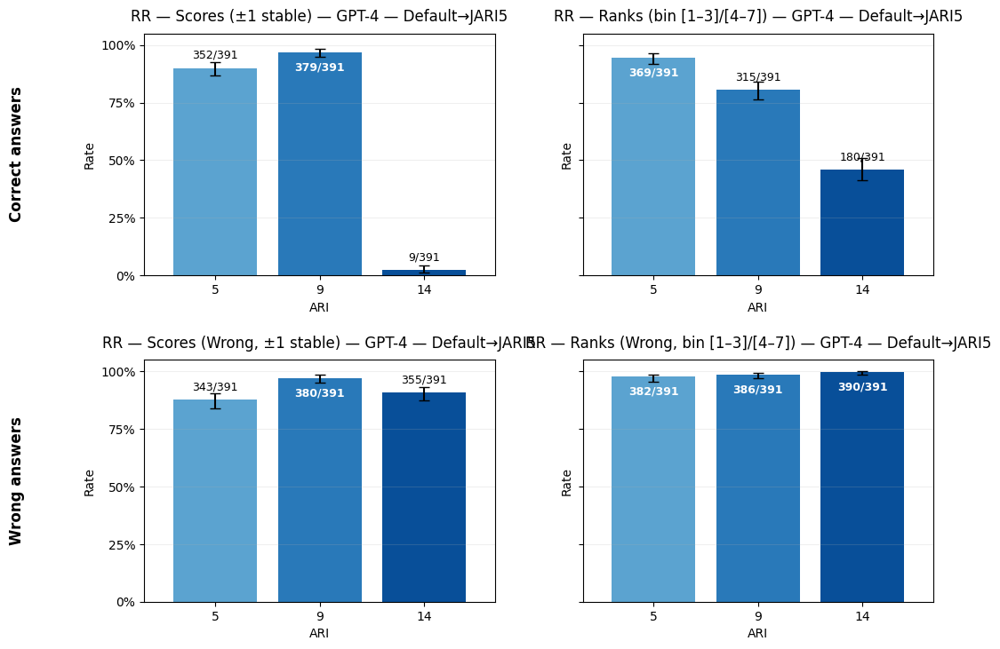

In [45]:
# Robustness-only grid (baseline vs perturbed)
plot_rr_grid_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_perturbed="../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_perturbed="../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→JARI5",
    eps=1.0
)




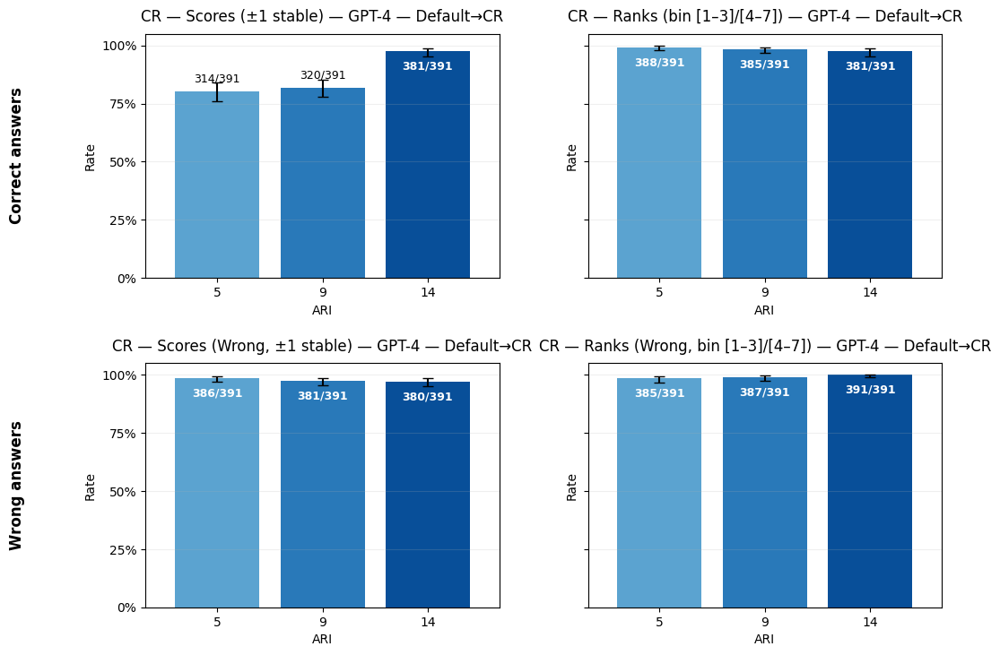

In [46]:
# Consistency-only grid (baseline vs repeat)
plot_cr_grid_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_repeat  ="../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_repeat   ="../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→CR",
    eps=1.0
)

In [47]:
# --- Exact-match kernels (per ARI)
def rr_scoring_exact_per_ari(base, pert, score_col, tol=1e-9):
    s0 = base[score_col].astype(float).to_numpy()
    s1 = pert[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - s1) <= tol)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_scoring_exact_per_ari(base, repeat, score_col, tol=1e-9):
    s0 = base[score_col].astype(float).to_numpy()
    sR = repeat[score_col].astype(float).to_numpy()
    stable = (np.abs(s0 - sR) <= tol)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def rr_ranking_exact_per_ari(base, pert, rank_col):
    r0 = base[rank_col].astype(int).to_numpy()
    r1 = pert[rank_col].astype(int).to_numpy()
    stable = (r0 == r1)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_ranking_exact_per_ari(base, repeat, rank_col):
    r0 = base[rank_col].astype(int).to_numpy()
    rR = repeat[rank_col].astype(int).to_numpy()
    stable = (r0 == rR)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def build_rr_exact_dicts(score_base, score_pert, rank_base, rank_pert, order=(5,9,14), tol=1e-9):
    rr_score_exact_correct = {a: rr_scoring_exact_per_ari(score_base, score_pert, _CORR_SCORE[a], tol=tol) for a in order}
    rr_score_exact_wrong   = {a: rr_scoring_exact_per_ari(score_base, score_pert, _WRONG_SCORE[a], tol=tol) for a in order}
    rr_rank_exact_correct  = {a: rr_ranking_exact_per_ari(rank_base, rank_pert, _CORR_RANK[a]) for a in order}
    rr_rank_exact_wrong    = {a: rr_ranking_exact_per_ari(rank_base, rank_pert, _WRONG_RANK[a]) for a in order}
    return rr_score_exact_correct, rr_score_exact_wrong, rr_rank_exact_correct, rr_rank_exact_wrong

def build_cr_exact_dicts(score_base, score_repeat, rank_base, rank_repeat, order=(5,9,14), tol=1e-9):
    cr_score_exact_correct = {a: cr_scoring_exact_per_ari(score_base, score_repeat, _CORR_SCORE[a], tol=tol) for a in order}
    cr_score_exact_wrong   = {a: cr_scoring_exact_per_ari(score_base, score_repeat, _WRONG_SCORE[a], tol=tol) for a in order}
    cr_rank_exact_correct  = {a: cr_ranking_exact_per_ari(rank_base, rank_repeat, _CORR_RANK[a]) for a in order}
    cr_rank_exact_wrong    = {a: cr_ranking_exact_per_ari(rank_base, rank_repeat, _WRONG_RANK[a]) for a in order}
    return cr_score_exact_correct, cr_score_exact_wrong, cr_rank_exact_correct, cr_rank_exact_wrong

# --- Exact-match grid plots (same layout as RR/CR)
def plot_rr_grid_exact(
    rr_sc_exact_c, rr_sc_exact_w, rr_rk_exact_c, rr_rk_exact_w,
    label_suffix="", left_pad=0.24, row_label_offset=-0.34
):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)
    _plot_rate_bars(rr_sc_exact_c, f"RR — Scores (Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,0])
    _plot_rate_bars(rr_rk_exact_c, f"RR — Ranks (Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,1])
    _plot_rate_bars(rr_sc_exact_w, f"RR — Scores (Wrong, Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,0])
    _plot_rate_bars(rr_rk_exact_w, f"RR — Ranks (Wrong, Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,1])
    for ax in axes.ravel():
        ax.grid(True, axis='y', alpha=0.2); ax.margins(x=0.10)
    fig.subplots_adjust(left=left_pad, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)
    axes[0,0].text(row_label_offset, 0.5, "Correct answers", transform=axes[0,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(row_label_offset, 0.5, "Wrong answers", transform=axes[1,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    plt.show()

def plot_cr_grid_exact(
    cr_sc_exact_c, cr_sc_exact_w, cr_rk_exact_c, cr_rk_exact_w,
    label_suffix="", left_pad=0.24, row_label_offset=-0.34
):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)
    _plot_rate_bars(cr_sc_exact_c, f"CR — Scores (Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,0])
    _plot_rate_bars(cr_rk_exact_c, f"CR — Ranks (Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[0,1])
    _plot_rate_bars(cr_sc_exact_w, f"CR — Scores (Wrong, Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,0])
    _plot_rate_bars(cr_rk_exact_w, f"CR — Ranks (Wrong, Exact){f' — {label_suffix}' if label_suffix else ''}", ax=axes[1,1])
    for ax in axes.ravel():
        ax.grid(True, axis='y', alpha=0.2); ax.margins(x=0.10)
    fig.subplots_adjust(left=left_pad, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)
    axes[0,0].text(row_label_offset, 0.5, "Correct answers", transform=axes[0,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(row_label_offset, 0.5, "Wrong answers", transform=axes[1,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    plt.show()

# --- File-based wrappers for exact-match
def plot_rr_grid_exact_from_files(
    score_baseline, score_perturbed, rank_baseline, rank_perturbed,
    *, label_suffix="", tol=1e-9, order=(5,9,14)
):
    s0 = _read_df(score_baseline); s1 = _read_df(score_perturbed)
    r0 = _read_df(rank_baseline);  r1 = _read_df(rank_perturbed)
    rr_sc_e_c, rr_sc_e_w, rr_rk_e_c, rr_rk_e_w = build_rr_exact_dicts(s0, s1, r0, r1, order=order, tol=tol)
    plot_rr_grid_exact(rr_sc_e_c, rr_sc_e_w, rr_rk_e_c, rr_rk_e_w, label_suffix=label_suffix)

def plot_cr_grid_exact_from_files(
    score_baseline, score_repeat, rank_baseline, rank_repeat,
    *, label_suffix="", tol=1e-9, order=(5,9,14)
):
    s0 = _read_df(score_baseline); sR = _read_df(score_repeat)
    r0 = _read_df(rank_baseline);  rR = _read_df(rank_repeat)
    cr_sc_e_c, cr_sc_e_w, cr_rk_e_c, cr_rk_e_w = build_cr_exact_dicts(s0, sR, r0, rR, order=order, tol=tol)
    plot_cr_grid_exact(cr_sc_e_c, cr_sc_e_w, cr_rk_e_c, cr_rk_e_w, label_suffix=label_suffix)


In [48]:
# --- Top-1 identity stability (who is the winner stays the winner?)
def _infer_rank_cols(df):
    # Prefer the full 7 if present; gracefully degrade to what's available.
    preferred = ['Rank_Ref',
                 _CORR_RANK[5], _CORR_RANK[9], _CORR_RANK[14],
                 _WRONG_RANK[5], _WRONG_RANK[9], _WRONG_RANK[14]]
    return [c for c in preferred if c in df.columns]

def _top1_set(row, cols):
    vals = row[cols].astype(float)
    m = vals.min()
    # Return the set of column names that achieve the min (tie-aware)
    return frozenset(vals.index[vals == m].tolist())

def top1_stability_rr(rank_base, rank_pert, rank_cols=None):
    if rank_cols is None:
        rank_cols = _infer_rank_cols(rank_base)
    s0 = rank_base[rank_cols]
    s1 = rank_pert[rank_cols]
    sets0 = s0.apply(lambda r: _top1_set(r, rank_cols), axis=1)
    sets1 = s1.apply(lambda r: _top1_set(r, rank_cols), axis=1)
    stable = (sets0 == sets1).to_numpy()
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n), 'rank_cols': rank_cols}

def top1_stability_cr(rank_base, rank_repeat, rank_cols=None):
    if rank_cols is None:
        rank_cols = _infer_rank_cols(rank_base)
    s0 = rank_base[rank_cols]
    sR = rank_repeat[rank_cols]
    sets0 = s0.apply(lambda r: _top1_set(r, rank_cols), axis=1)
    setsR = sR.apply(lambda r: _top1_set(r, rank_cols), axis=1)
    stable = (sets0 == setsR).to_numpy()
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n), 'rank_cols': rank_cols}

def _plot_single_rate(metric, title, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(4,4))
    rate, (lo, hi), k, n = metric['rate'], metric['ci'], metric['k'], metric['n']
    lo_err = max(0.0, rate - lo); hi_err = max(0.0, hi - rate)
    ax.bar(['Top-1'], [rate], yerr=[[lo_err], [hi_err]], capsize=4)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_ylim(0, max(0.8, min(0.98, rate + hi_err + 0.06)))
    ax.set_ylabel("Rate"); ax.set_title(title, pad=10)
    y = rate
    if y >= 0.92:
        ax.text(0, y - 0.04, f"{k}/{n}", ha='center', va='top',
                fontsize=9, color='white', fontweight='bold', clip_on=False)
    else:
        ax.text(0, min(y + 0.03, ax.get_ylim()[1] - 0.03), f"{k}/{n}",
                ha='center', va='bottom', fontsize=9)
    ax.grid(True, axis='y', alpha=0.2)
    ax.margins(x=0.15)
    return ax

# --- File-based helpers for Top-1 stability
def plot_top1_rr_from_files(rank_baseline, rank_perturbed, *, label_suffix=""):
    r0 = _read_df(rank_baseline); r1 = _read_df(rank_perturbed)
    met = top1_stability_rr(r0, r1)
    _ = _plot_single_rate(met, f"RR — Top-1 identity{f' — {label_suffix}' if label_suffix else ''}")
    plt.show()
    return met

def plot_top1_cr_from_files(rank_baseline, rank_repeat, *, label_suffix=""):
    r0 = _read_df(rank_baseline); rR = _read_df(rank_repeat)
    met = top1_stability_cr(r0, rR)
    _ = _plot_single_rate(met, f"CR — Top-1 identity{f' — {label_suffix}' if label_suffix else ''}")
    plt.show()
    return met



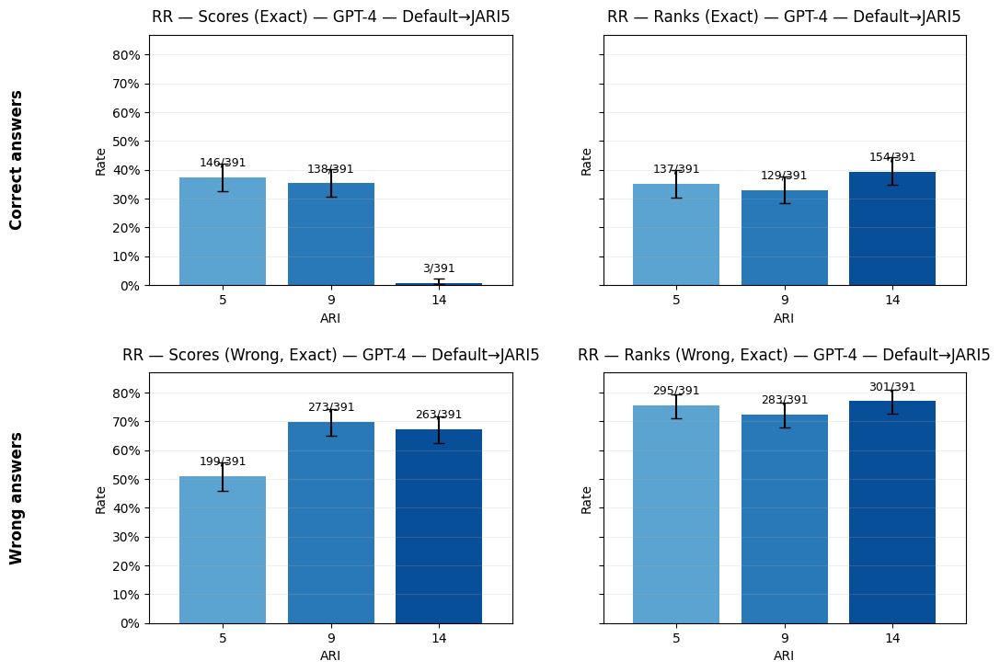

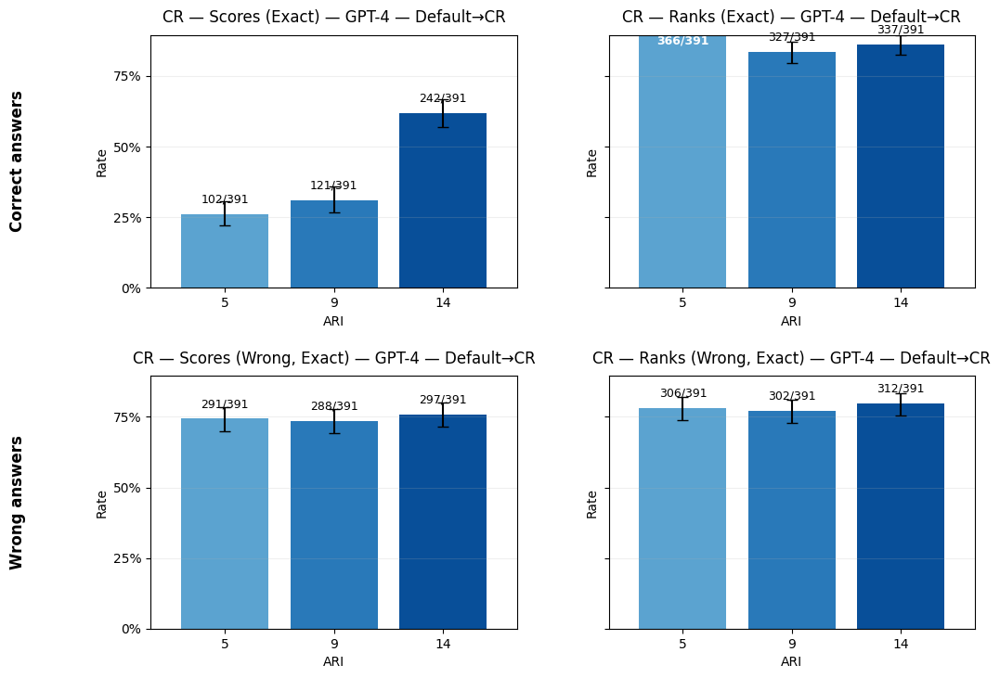

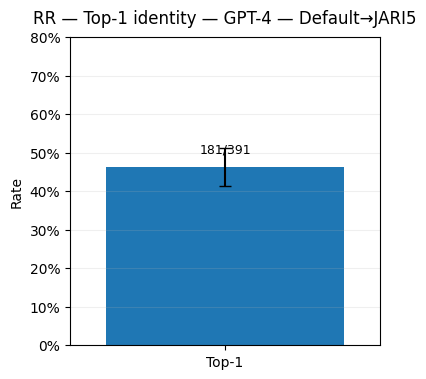

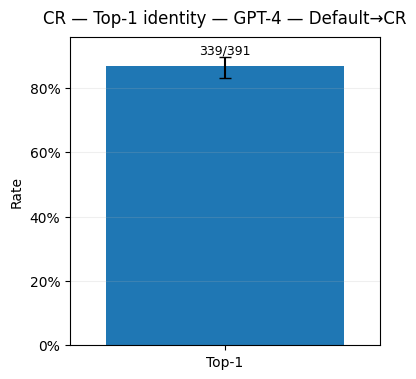

In [49]:
# 1) Robustness: exact-match grids for scores and ranks
plot_rr_grid_exact_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_perturbed="../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_perturbed="../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→JARI5",
    tol=1e-9
)

# 2) Consistency: exact-match grids for scores and ranks
plot_cr_grid_exact_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_repeat  ="../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_repeat   ="../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→CR",
    tol=1e-9
)

# 3) Top-1 identity stability (single-bar plots)
_ = plot_top1_rr_from_files(
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_perturbed="../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→JARI5"
)
_ = plot_top1_cr_from_files(
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_repeat   ="../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→CR"
)


In [50]:
# =========================
# Top-k stability (RR/CR)
# =========================

def _infer_rank_cols(df):
    preferred = ['Rank_Ref',
                 _CORR_RANK[5], _CORR_RANK[9], _CORR_RANK[14],
                 _WRONG_RANK[5], _WRONG_RANK[9], _WRONG_RANK[14]]
    return [c for c in preferred if c in df.columns]

def _topk_set(row, cols, k, tie='expand'):
    vals = row[cols].astype(float)
    # stable, deterministic tie-break by column order
    order = sorted(cols, key=lambda c: (vals[c], cols.index(c)))
    if tie == 'expand':
        # include everyone tied with the k-th element
        kth_val = vals[order[k-1]]
        S = [c for c in cols if vals[c] < kth_val] + [c for c in cols if vals[c] == kth_val]
        return frozenset(S)
    elif tie == 'truncate':
        return frozenset(order[:k])
    else:
        raise ValueError("tie must be 'expand' or 'truncate'")

def _topk_order(row, cols, k):
    vals = row[cols].astype(float)
    order = sorted(cols, key=lambda c: (vals[c], cols.index(c)))
    return tuple(order[:k])

def _topk_metrics(df0, df1, cols, k, mode='set', tau=1.0, tie='expand'):
    """
    mode: 'set' (identical sets), 'order' (identical sequence), 'overlap' (|A∩B|/|A∪B| >= tau)
    tau : threshold for 'overlap' (e.g., 0.8). For exact set-equality use tau=1.0 or mode='set'.
    """
    assert mode in {'set','order','overlap'}
    A_sets, B_sets, stable = [], [], []
    jacc = []  # Jaccard for reporting (also meaningful in 'overlap' mode)

    if mode == 'order':
        A_top = df0.apply(lambda r: _topk_order(r, cols, k), axis=1)
        B_top = df1.apply(lambda r: _topk_order(r, cols, k), axis=1)
        stable = (A_top == B_top).to_numpy()
        # Jaccard for info
        for a, b in zip(A_top, B_top):
            aS, bS = set(a), set(b)
            jacc.append(len(aS & bS) / len(aS | bS))
    else:
        A_top = df0.apply(lambda r: _topk_set(r, cols, k, tie=tie), axis=1)
        B_top = df1.apply(lambda r: _topk_set(r, cols, k, tie=tie), axis=1)
        for a, b in zip(A_top, B_top):
            if mode == 'set':
                stable.append(a == b)
            else:  # overlap
                inter = len(a & b); union = len(a | b)
                j = (inter / union) if union else 1.0
                jacc.append(j)
                stable.append(j >= tau)
        stable = np.array(stable, dtype=bool)
        if mode in {'set','overlap'} and not jacc:
            # fill jacc for 'set' just for reporting
            for a, b in zip(A_top, B_top):
                inter = len(a & b); union = len(a | b)
                jacc.append((inter/union) if union else 1.0)

    k_ok = int(stable.sum()); n = int(stable.size)
    return {
        'rate': k_ok/n if n else np.nan,
        'k': k_ok, 'n': n,
        'ci': wilson_ci(k_ok, n),
        'avg_jaccard': float(np.mean(jacc)) if jacc else np.nan,
        'mode': mode, 'k_top': k, 'tau': tau, 'tie': tie, 'cols': cols,
    }

def topk_stability_rr(rank_baseline, rank_perturbed, k=3, rank_cols=None, mode='set', tau=1.0, tie='expand'):
    r0 = _read_df(rank_baseline); r1 = _read_df(rank_perturbed)
    if rank_cols is None:
        rank_cols = [c for c in _infer_rank_cols(r0) if c in r1.columns]
    return _topk_metrics(r0, r1, rank_cols, k, mode=mode, tau=tau, tie=tie)

def topk_stability_cr(rank_baseline, rank_repeat, k=3, rank_cols=None, mode='set', tau=1.0, tie='expand'):
    r0 = _read_df(rank_baseline); rR = _read_df(rank_repeat)
    if rank_cols is None:
        rank_cols = [c for c in _infer_rank_cols(r0) if c in rR.columns]
    return _topk_metrics(r0, rR, rank_cols, k, mode=mode, tau=tau, tie=tie)

# Small plot helper (single bar with CI), same look as your Top-1
def plot_topk_rate(metric, label_suffix=""):
    fig, ax = plt.subplots(figsize=(4,4))
    rate, (lo, hi), k_ok, n = metric['rate'], metric['ci'], metric['k'], metric['n']
    lo_err, hi_err = max(0.0, rate-lo), max(0.0, hi-rate)
    txt = f"Top-{metric['k_top']} ({metric['mode']}{'' if metric['mode']!='overlap' else f', τ={metric['tau']:.2f}'})"
    ax.bar([txt], [rate], yerr=[[lo_err],[hi_err]], capsize=4)
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_ylim(0, max(0.8, min(0.98, rate + hi_err + 0.06)))
    ax.set_ylabel("Rate"); ax.set_title(f"{'RR' if 'Default→' in label_suffix else 'CR'} — Top-k stability — {label_suffix}", pad=10)
    y = rate
    if y >= 0.92:
        ax.text(0, y - 0.04, f"{k_ok}/{n}", ha='center', va='top', fontsize=9, color='white', fontweight='bold')
    else:
        ax.text(0, min(y + 0.03, ax.get_ylim()[1]-0.03), f"{k_ok}/{n}", ha='center', va='bottom', fontsize=9)
    ax.grid(True, axis='y', alpha=0.2); ax.margins(x=0.15)
    plt.show()
    return metric


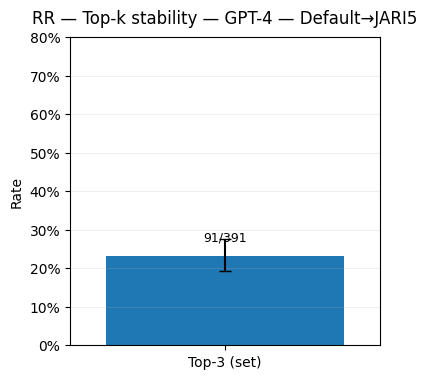

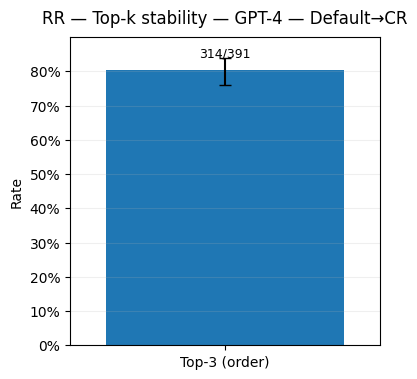

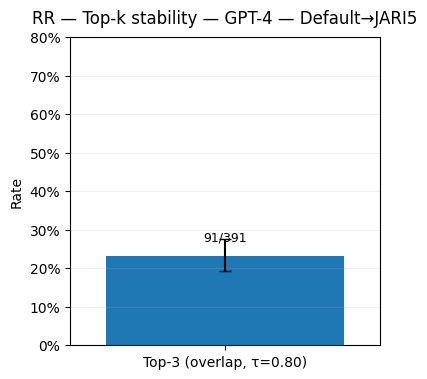

{'rate': 0.23273657289002558,
 'k': 91,
 'n': 391,
 'ci': (np.float64(0.19357447989701382), np.float64(0.27709914028401356)),
 'avg_jaccard': 0.6117647058823529,
 'mode': 'overlap',
 'k_top': 3,
 'tau': 0.8,
 'tie': 'expand',
 'cols': ['Rank_Ref',
  'Rank_ARI_5',
  'Rank_ARI_9',
  'Rank_ARI_14',
  'Rank_Wrong_Answer_ARI_5',
  'Rank_Wrong_Answer_ARI_9',
  'Rank_Wrong_Answer_ARI_14']}

In [51]:
# RR, Top-3 strict set-identity
m_rr_t3 = topk_stability_rr(
    "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    "../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    k=3, mode='set', tie='expand'
)
plot_topk_rate(m_rr_t3, label_suffix="GPT-4 — Default→JARI5")

# CR, Top-3 order-identity (very strict)
m_cr_t3_ord = topk_stability_cr(
    "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    "../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv",
    k=3, mode='order'
)
plot_topk_rate(m_cr_t3_ord, label_suffix="GPT-4 — Default→CR")

# RR, Top-3 overlap ≥ 0.8 (tolerant)
m_rr_t3_ov = topk_stability_rr(
    "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    "../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    k=3, mode='overlap', tau=0.8, tie='expand'
)
plot_topk_rate(m_rr_t3_ov, label_suffix="GPT-4 — Default→JARI5")


In [52]:
cols = ['Rank_Ref','Rank_ARI_5','Rank_ARI_9','Rank_ARI_14']
m_rr_t3_correct = topk_stability_rr(r0_path, r1_path, k=3, rank_cols=cols, mode='set')


NameError: name 'r0_path' is not defined

In [79]:
# --- Generic per-column kernels (works for ARI 5/9/14 and the Reference) ---

def rr_scoring_per_col(base, pert, col, eps=1.0):
    s0 = base[col].astype(float).to_numpy()
    s1 = pert[col].astype(float).to_numpy()
    stable = (np.abs(s0 - s1) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_scoring_per_col(base, repeat, col, eps=1.0):
    s0 = base[col].astype(float).to_numpy()
    sR = repeat[col].astype(float).to_numpy()
    stable = (np.abs(s0 - sR) <= eps)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def rr_ranking_bin_per_col(base, pert, col, top_k=3):
    """Bin stability with configurable split: top bin=[1..top_k], low bin=[top_k+1..7]."""
    r0 = base[col].astype(int).to_numpy()
    r1 = pert[col].astype(int).to_numpy()
    b0 = (r0 <= top_k)
    b1 = (r1 <= top_k)
    stable = (b0 == b1)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}

def cr_ranking_bin_per_col(base, repeat, col, top_k=3):
    r0 = base[col].astype(int).to_numpy()
    rR = repeat[col].astype(int).to_numpy()
    b0 = (r0 <= top_k)
    bR = (rR <= top_k)
    stable = (b0 == bR)
    k, n = int(stable.sum()), int(stable.size)
    return {'rate': k/n, 'k': k, 'n': n, 'ci': wilson_ci(k, n)}


In [80]:
# Column maps
_CORR_SCORE = {5:'Score_ARI_5', 9:'Score_ARI_9', 14:'Score_ARI_14'}
_WRONG_SCORE = {5:'Score_Wrong_Answer_ARI_5', 9:'Score_Wrong_Answer_ARI_9', 14:'Score_Wrong_Answer_ARI_14'}
_CORR_RANK  = {5:'Rank_ARI_5',  9:'Rank_ARI_9',  14:'Rank_ARI_14'}
_WRONG_RANK = {5:'Rank_Wrong_Answer_ARI_5', 9:'Rank_Wrong_Answer_ARI_9', 14:'Rank_Wrong_Answer_ARI_14'}

_REF_SCORE = 'Score_Ref_Answer'
_REF_RANK  = 'Rank_Ref'

def build_rr_dicts(score_base, score_pert, rank_base, rank_pert, *,
                   order=(5,9,14), eps=1.0, top_k=3, include_ref=False):
    rr_score_correct = {a: rr_scoring_per_col(score_base, score_pert, _CORR_SCORE[a], eps=eps) for a in order}
    rr_score_wrong   = {a: rr_scoring_per_col(score_base, score_pert, _WRONG_SCORE[a], eps=eps) for a in order}
    rr_rank_correct  = {a: rr_ranking_bin_per_col(rank_base, rank_pert, _CORR_RANK[a], top_k=top_k) for a in order}
    rr_rank_wrong    = {a: rr_ranking_bin_per_col(rank_base, rank_pert, _WRONG_RANK[a], top_k=top_k) for a in order}
    if include_ref:
        rr_score_correct['Ref'] = rr_scoring_per_col(score_base, score_pert, _REF_SCORE, eps=eps)
        rr_rank_correct['Ref']  = rr_ranking_bin_per_col(rank_base, rank_pert, _REF_RANK, top_k=top_k)
    return rr_score_correct, rr_score_wrong, rr_rank_correct, rr_rank_wrong

def build_cr_dicts(score_base, score_repeat, rank_base, rank_repeat, *,
                   order=(5,9,14), eps=1.0, top_k=3, include_ref=False):
    cr_score_correct = {a: cr_scoring_per_col(score_base, score_repeat, _CORR_SCORE[a], eps=eps) for a in order}
    cr_score_wrong   = {a: cr_scoring_per_col(score_base, score_repeat, _WRONG_SCORE[a], eps=eps) for a in order}
    cr_rank_correct  = {a: cr_ranking_bin_per_col(rank_base, rank_repeat, _CORR_RANK[a], top_k=top_k) for a in order}
    cr_rank_wrong    = {a: cr_ranking_bin_per_col(rank_base, rank_repeat, _WRONG_RANK[a], top_k=top_k) for a in order}
    if include_ref:
        cr_score_correct['Ref'] = cr_scoring_per_col(score_base, score_repeat, _REF_SCORE, eps=eps)
        cr_rank_correct['Ref']  = cr_ranking_bin_per_col(rank_base, rank_repeat, _REF_RANK, top_k=top_k)
    return cr_score_correct, cr_score_wrong, cr_rank_correct, cr_rank_wrong


In [81]:
def _plot_rate_bars(rate_dict, title, ax=None, order=(5,9,14), label_map=None,
                    top_pad=0.06, inside_thresh=0.92):
    """
    order can include 'Ref', e.g., order=(5,9,14,'Ref').
    label_map maps keys -> shown x tick labels (optional).
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,4))

    keys = list(order)
    vals  = [rate_dict[k]['rate'] if k in rate_dict else np.nan for k in keys]
    los   = [max(0.0, vals[i] - rate_dict[keys[i]]['ci'][0]) if keys[i] in rate_dict else 0 for i in range(len(keys))]
    his   = [max(0.0, rate_dict[keys[i]]['ci'][1] - vals[i]) if keys[i] in rate_dict else 0 for i in range(len(keys))]

    cmap = plt.get_cmap("Blues")
    # spread colors over the number of bars
    cols = [cmap(0.55 + 0.35*i/max(1, len(keys)-1)) for i in range(len(keys))]

    xticklabels = [str(k) if label_map is None else label_map.get(k, str(k)) for k in keys]
    xi = np.arange(len(keys))
    ax.bar(xi, vals, yerr=[los, his], capsize=4, color=cols, edgecolor='none')
    ax.set_xticks(xi); ax.set_xticklabels(xticklabels)

    max_bar = np.nanmax([v + h for v, h in zip(vals, his) if not np.isnan(v)]) if np.any(~np.isnan(vals)) else 1.0
    y_top = max_bar + top_pad
    ax.set_ylim(0, min(0.98, max(0.8, y_top)))
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_xlabel("ARI / Ref"); ax.set_ylabel("Rate")
    ax.set_title(title, pad=10)

    for i, k in enumerate(keys):
        if k not in rate_dict: continue
        kcnt, n = rate_dict[k]['k'], rate_dict[k]['n']
        y = vals[i]
        if y >= inside_thresh:
            ax.text(i, y - 0.04, f"{kcnt}/{n}", ha='center', va='top',
                    fontsize=9, color='white', fontweight='bold', clip_on=False)
        else:
            y_annot = min(y + 0.03, ax.get_ylim()[1] - 0.03)
            ax.text(i, y_annot, f"{kcnt}/{n}", ha='center', va='bottom', fontsize=9)
    ax.grid(True, axis='y', alpha=0.2)
    ax.margins(x=0.10)
    return ax


In [82]:
def plot_rr_grid_from_files(
    score_baseline, score_perturbed, rank_baseline, rank_perturbed,
    *, label_suffix="", eps=1.0, order=(5,9,14,'Ref'), top_k=4
):
    s0 = _read_df(score_baseline); s1 = _read_df(score_perturbed)
    r0 = _read_df(rank_baseline);  r1 = _read_df(rank_perturbed)
    rr_sc_c, rr_sc_w, rr_rk_c, rr_rk_w = build_rr_dicts(
        s0, s1, r0, r1, order=tuple([x for x in order if x != 'Ref']), eps=eps, top_k=top_k, include_ref=('Ref' in order)
    )
    # 2×2 grid (Correct/Wrong × Scores/Ranks)
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)
    _plot_rate_bars(rr_sc_c, f"RR — Scores (±{eps:g}) — {label_suffix}", ax=axes[0,0], order=order)
    _plot_rate_bars(rr_rk_c, f"RR — Ranks (bin [1–{top_k}]/[{top_k+1}–7]) — {label_suffix}", ax=axes[0,1], order=order)
    _plot_rate_bars(rr_sc_w, f"RR — Scores (Wrong, ±{eps:g}) — {label_suffix}", ax=axes[1,0], order=[k for k in order if k!='Ref'])
    _plot_rate_bars(rr_rk_w, f"RR — Ranks (Wrong, bin [1–{top_k}]/[{top_k+1}–7]) — {label_suffix}",
                    ax=axes[1,1], order=[k for k in order if k!='Ref'])
    fig.subplots_adjust(left=0.24, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)
    axes[0,0].text(-0.34, 0.5, "Correct answers", transform=axes[0,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(-0.34, 0.5, "Wrong answers", transform=axes[1,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    plt.show()

def plot_cr_grid_from_files(
    score_baseline, score_repeat, rank_baseline, rank_repeat,
    *, label_suffix="", eps=1.0, order=(5,9,14,'Ref'), top_k=4
):
    s0 = _read_df(score_baseline); sR = _read_df(score_repeat)
    r0 = _read_df(rank_baseline);  rR = _read_df(rank_repeat)
    cr_sc_c, cr_sc_w, cr_rk_c, cr_rk_w = build_cr_dicts(
        s0, sR, r0, rR, order=tuple([x for x in order if x != 'Ref']), eps=eps, top_k=top_k, include_ref=('Ref' in order)
    )
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharey=True, constrained_layout=False)
    _plot_rate_bars(cr_sc_c, f"CR — Scores (±{eps:g}) — {label_suffix}", ax=axes[0,0], order=order)
    _plot_rate_bars(cr_rk_c, f"CR — Ranks (bin [1–{top_k}]/[{top_k+1}–7]) — {label_suffix}", ax=axes[0,1], order=order)
    _plot_rate_bars(cr_sc_w, f"CR — Scores (Wrong, ±{eps:g}) — {label_suffix}", ax=axes[1,0], order=[k for k in order if k!='Ref'])
    _plot_rate_bars(cr_rk_w, f"CR — Ranks (Wrong, bin [1–{top_k}]/[{top_k+1}–7]) — {label_suffix}",
                    ax=axes[1,1], order=[k for k in order if k!='Ref'])
    fig.subplots_adjust(left=0.24, right=0.98, top=0.90, bottom=0.10, wspace=0.25, hspace=0.35)
    axes[0,0].text(-0.34, 0.5, "Correct answers", transform=axes[0,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    axes[1,0].text(-0.34, 0.5, "Wrong answers", transform=axes[1,0].transAxes,
                   rotation=90, va='center', ha='right', fontsize=12, fontweight='bold')
    plt.show()


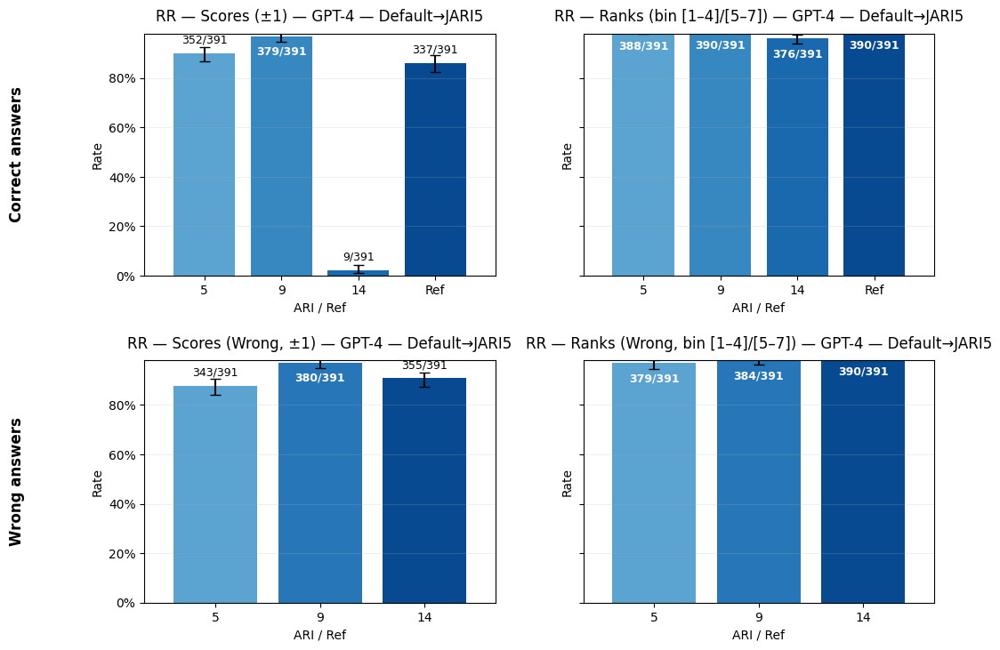

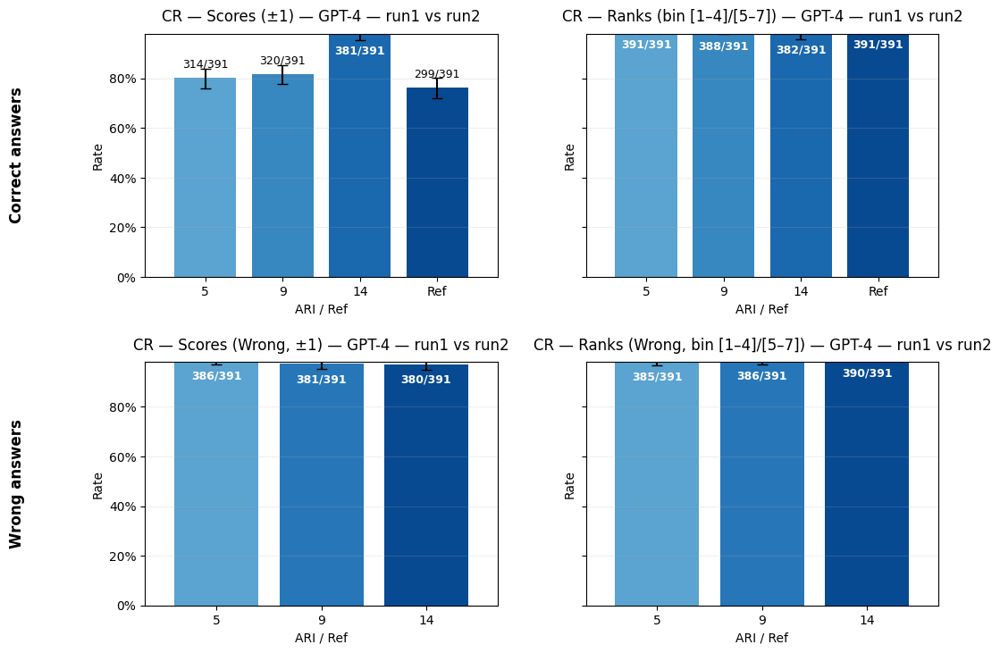

In [83]:
# RR: baseline vs JARI-perturbed, bin = [1–4]/[5–7], include Reference
plot_rr_grid_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_perturbed="../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_perturbed="../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv",
    label_suffix="GPT-4 — Default→JARI5",
    eps=1.0,
    order=(5,9,14,'Ref'),
    top_k=4
)

# CR: baseline vs repeat, same bin/tolerance, include Reference
plot_cr_grid_from_files(
    score_baseline="../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv",
    score_repeat  ="../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv",
    rank_baseline ="../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv",
    rank_repeat   ="../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv",
    label_suffix="GPT-4 — run1 vs run2",
    eps=1.0,
    order=(5,9,14,'Ref'),
    top_k=4
)


In [54]:
# ============================================
# Reliability suite: RR/CR for scores & ranks
# ============================================
import os
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from scipy.stats import norm

# -------------------------
# I/O + CI
# -------------------------
def _read_df(x):
    if isinstance(x, str):
        return pd.read_csv(x)
    return x.copy()

def wilson_ci(k, n, alpha=0.05):
    if n == 0:
        return (np.nan, np.nan)
    z = norm.ppf(1 - alpha/2)
    p = k / n
    denom = 1 + z**2/n
    center = (p + z*z/(2*n)) / denom
    half = z*np.sqrt((p*(1-p)/n) + (z*z/(4*n*n))) / denom
    return (center - half, center + half)

def _append_or_write(df, out_path):
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    if out_path.exists():
        old = pd.read_csv(out_path)
        cols = sorted(set(old.columns) | set(df.columns))
        old = old.reindex(columns=cols)
        df  = df.reindex(columns=cols)
        pd.concat([old, df], ignore_index=True).to_csv(out_path, index=False)
    else:
        df.to_csv(out_path, index=False)

# -------------------------
# Column maps (override per-call if needed)
# -------------------------
DEF_SCORE_CORR = {5:'Score_ARI_5', 9:'Score_ARI_9', 14:'Score_ARI_14'}
DEF_SCORE_WRNG = {5:'Score_Wrong_Answer_ARI_5', 9:'Score_Wrong_Answer_ARI_9', 14:'Score_Wrong_Answer_ARI_14'}
DEF_RANK_CORR  = {5:'Rank_ARI_5',  9:'Rank_ARI_9',  14:'Rank_ARI_14'}
DEF_RANK_WRNG  = {5:'Rank_Wrong_Answer_ARI_5', 9:'Rank_Wrong_Answer_ARI_9', 14:'Rank_Wrong_Answer_ARI_14'}

# -------------------------
# Metric kernels
# -------------------------
def _score_exact(A, B, col):
    s0 = A[col].astype(float).to_numpy()
    s1 = B[col].astype(float).to_numpy()
    mask = ~np.isnan(s0) & ~np.isnan(s1)
    if mask.sum() == 0: return 0, 0
    return int((s0[mask] == s1[mask]).sum()), int(mask.sum())

def _score_eps(A, B, col, eps=1.0):
    s0 = A[col].astype(float).to_numpy()
    s1 = B[col].astype(float).to_numpy()
    mask = ~np.isnan(s0) & ~np.isnan(s1)
    if mask.sum() == 0: return 0, 0
    return int((np.abs(s0[mask] - s1[mask]) <= eps).sum()), int(mask.sum())

def _rank_bin_top3(A, B, col):
    r0 = A[col].astype(float).to_numpy()
    r1 = B[col].astype(float).to_numpy()
    mask = ~np.isnan(r0) & ~np.isnan(r1)
    if mask.sum() == 0: return 0, 0
    r0 = r0[mask].astype(int); r1 = r1[mask].astype(int)
    return int(((r0 <= 3) == (r1 <= 3)).sum()), int(mask.sum())

def _rank_exact(A, B, col):
    r0 = A[col].astype(float).to_numpy()
    r1 = B[col].astype(float).to_numpy()
    mask = ~np.isnan(r0) & ~np.isnan(r1)
    if mask.sum() == 0: return 0, 0
    r0 = r0[mask].astype(int); r1 = r1[mask].astype(int)
    return int((r0 == r1).sum()), int(mask.sum())

def _rank_top1_identity(A, B, corr_col, wrong_col):
    """
    Two-candidate Top-1 (correct vs wrong) per row, per ARI.
    Stable if winner (correct=1 / wrong=0) is same in A and B; ties excluded.
    """
    rc0 = A[corr_col].astype(float).to_numpy()
    rw0 = A[wrong_col].astype(float).to_numpy()
    rc1 = B[corr_col].astype(float).to_numpy()
    rw1 = B[wrong_col].astype(float).to_numpy()
    mask = ~np.isnan(rc0) & ~np.isnan(rw0) & ~np.isnan(rc1) & ~np.isnan(rw1)
    if mask.sum() == 0: return 0, 0
    rc0, rw0, rc1, rw1 = rc0[mask].astype(int), rw0[mask].astype(int), rc1[mask].astype(int), rw1[mask].astype(int)
    w0 = np.where(rc0 < rw0, 1, np.where(rc0 > rw0, 0, -1))
    w1 = np.where(rc1 < rw1, 1, np.where(rc1 > rw1, 0, -1))
    non_tie = (w0 != -1) & (w1 != -1)
    if non_tie.sum() == 0: return 0, 0
    return int((w0[non_tie] == w1[non_tie]).sum()), int(non_tie.sum())

# -------------------------
# Row builder for CSV
# -------------------------
def _mk_row(model, exp_name, mode, metric, group, ari, k, n, alpha=0.05, extras=None):
    lo, hi = wilson_ci(k, n, alpha=alpha)
    row = dict(
        model=model, exp_name=exp_name, mode=mode, metric=metric,
        group=group, ARI=ari, k=int(k), n=int(n),
        rate=(k/n) if n else np.nan, ci_low=lo, ci_high=hi
    )
    if extras: row.update(extras)
    return row


In [55]:

# -------------------------
# RR (scores & ranks) → DF + CSV + plots
# -------------------------
def rr_pointwise_report_and_plots(
    model_name, exp_name,
    score_base, score_pert,
    *, eps=1.0, ari_order=(5,9,14),
    cols_correct=DEF_SCORE_CORR, cols_wrong=DEF_SCORE_WRNG,
    out_dir="./results", plots_dir="./plots"
):
    A = _read_df(score_base); B = _read_df(score_pert)
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for ari in ari_order:
            col = cmap[ari]
            k0, n0 = _score_exact(A, B, col)
            rows.append(_mk_row(model_name, exp_name, 'RR', 'score_exact', group, ari, k0, n0))
            k1, n1 = _score_eps(A, B, col, eps=eps)
            rows.append(_mk_row(model_name, exp_name, 'RR', f'score_eps{int(eps)}', group, ari, k1, n1))
    df = pd.DataFrame(rows)
    _append_or_write(df, Path(out_dir) / f"RR_pointwise_scores_{model_name}.csv")
    _plot_scores_grid(df, title=f"RR — Scores — {model_name} — {exp_name}", save_to=Path(plots_dir)/f"RR_scores_{model_name}_{exp_name}.png")
    return df

def rr_listwise_report_and_plots(
    model_name, exp_name,
    rank_base, rank_pert,
    *, ari_order=(5,9,14),
    cols_correct=DEF_RANK_CORR, cols_wrong=DEF_RANK_WRNG,
    out_dir="./results", plots_dir="./plots"
):
    A = _read_df(rank_base); B = _read_df(rank_pert)
    rows = []
    # Per-group rank_bin & rank_exact
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for ari in ari_order:
            col = cmap[ari]
            k_bin, n_bin = _rank_bin_top3(A, B, col)
            rows.append(_mk_row(model_name, exp_name, 'RR', 'rank_bin_top3', group, ari, k_bin, n_bin))
            k_exa, n_exa = _rank_exact(A, B, col)
            rows.append(_mk_row(model_name, exp_name, 'RR', 'rank_exact', group, ari, k_exa, n_exa))
    # Top-1 (needs both columns per ARI)
    for ari in ari_order:
        k_t1, n_t1 = _rank_top1_identity(A, B, cols_correct[ari], cols_wrong[ari])
        rows.append(_mk_row(model_name, exp_name, 'RR', 'rank_top1', 'Both', ari, k_t1, n_t1))
    df = pd.DataFrame(rows)
    _append_or_write(df, Path(out_dir) / f"RR_listwise_ranks_{model_name}.csv")
    _plot_ranks_grid(df, title=f"RR — Ranks — {model_name} — {exp_name}", save_to=Path(plots_dir)/f"RR_ranks_{model_name}_{exp_name}.png")
    _plot_top1(df[df['metric']=='rank_top1'], title=f"RR — Top-1 — {model_name} — {exp_name}", save_to=Path(plots_dir)/f"RR_top1_{model_name}_{exp_name}.png")
    return df

# -------------------------
# CR (scores & ranks) → DF + CSV + plots
# -------------------------
def cr_pointwise_report_and_plots(
    model_name, phase,
    score_base, score_repeat,
    *, eps=1.0, ari_order=(5,9,14),
    cols_correct=DEF_SCORE_CORR, cols_wrong=DEF_SCORE_WRNG,
    out_dir="./results", plots_dir="./plots"
):
    A = _read_df(score_base); R = _read_df(score_repeat)
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for ari in ari_order:
            col = cmap[ari]
            k0, n0 = _score_exact(A, R, col)
            rows.append(_mk_row(model_name, f"CR-{phase}", 'CR', 'score_exact', group, ari, k0, n0))
            k1, n1 = _score_eps(A, R, col, eps=eps)
            rows.append(_mk_row(model_name, f"CR-{phase}", 'CR', f'score_eps{int(eps)}', group, ari, k1, n1))
    df = pd.DataFrame(rows)
    _append_or_write(df, Path(out_dir) / f"CR_all_{model_name}.csv")
    _plot_scores_grid(df, title=f"CR — Scores — {model_name} — {phase}", save_to=Path(plots_dir)/f"CR_scores_{model_name}_{phase}.png")
    return df

def cr_listwise_report_and_plots(
    model_name, phase,
    rank_base, rank_repeat,
    *, ari_order=(5,9,14),
    cols_correct=DEF_RANK_CORR, cols_wrong=DEF_RANK_WRNG,
    out_dir="./results", plots_dir="./plots"
):
    A = _read_df(rank_base); R = _read_df(rank_repeat)
    rows = []
    for group, cmap in [('Correct', cols_correct), ('Wrong', cols_wrong)]:
        for ari in ari_order:
            col = cmap[ari]
            k_bin, n_bin = _rank_bin_top3(A, R, col)
            rows.append(_mk_row(model_name, f"CR-{phase}", 'CR', 'rank_bin_top3', group, ari, k_bin, n_bin))
            k_exa, n_exa = _rank_exact(A, R, col)
            rows.append(_mk_row(model_name, f"CR-{phase}", 'CR', 'rank_exact', group, ari, k_exa, n_exa))
    for ari in ari_order:
        k_t1, n_t1 = _rank_top1_identity(A, R, cols_correct[ari], cols_wrong[ari])
        rows.append(_mk_row(model_name, f"CR-{phase}", 'CR', 'rank_top1', 'Both', ari, k_t1, n_t1))
    df = pd.DataFrame(rows)
    _append_or_write(df, Path(out_dir) / f"CR_all_{model_name}.csv")
    _plot_ranks_grid(df, title=f"CR — Ranks — {model_name} — {phase}", save_to=Path(plots_dir)/f"CR_ranks_{model_name}_{phase}.png")
    _plot_top1(df[df['metric']=='rank_top1'], title=f"CR — Top-1 — {model_name} — {phase}", save_to=Path(plots_dir)/f"CR_top1_{model_name}_{phase}.png")
    return df



In [ ]:
# -------------------------
# Plot helpers (work off the returned DF)
# -------------------------
def _plot_rate_bars(ax, subdf, order=(5,9,14), title="", inside_thresh=0.92, top_pad=0.06):
    # subdf has rows for one metric & one group across ARIs
    rates, loerr, hierr, labels, kn = [], [], [], [], []
    for a in order:
        row = subdf[subdf['ARI']==a]
        if len(row)==0:
            r, lo, hi, k, n = np.nan, np.nan, np.nan, 0, 0
        else:
            r = float(row['rate'].values[0])
            lo = float(row['ci_low'].values[0]); hi = float(row['ci_high'].values[0])
            k  = int(row['k'].values[0]);       n  = int(row['n'].values[0])
        rates.append(r); loerr.append(max(0, r-lo if pd.notna(r) and pd.notna(lo) else 0))
        hierr.append(max(0, hi-r if pd.notna(r) and pd.notna(hi) else 0))
        labels.append(str(a)); kn.append((k,n))

    ax.bar(labels, rates, yerr=[loerr, hierr], capsize=4)
    y_top = np.nanmax([r+h for r,h in zip(rates, hierr)]) if len(rates) else 0.0
    if np.isfinite(y_top):
        ax.set_ylim(0, max(0.8, min(0.98, y_top + top_pad)))
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=1.0, decimals=0))
    ax.set_title(title, pad=8)
    ax.set_xlabel("ARI"); ax.set_ylabel("Rate")
    for xi,(r,(k,n)) in enumerate(zip(rates, kn)):
        if not np.isfinite(r): continue
        if r >= inside_thresh:
            ax.text(xi, r-0.04, f"{k}/{n}", ha='center', va='top', color='white', fontweight='bold')
        else:
            ax.text(xi, min(r+0.03, ax.get_ylim()[1]-0.03), f"{k}/{n}", ha='center', va='bottom')
    ax.grid(True, axis='y', alpha=0.2); ax.margins(x=0.10)

def _plot_scores_grid(df, title, save_to=None):
    # Pick the one eps metric present (e.g., score_eps1 or score_eps2)
    eps_metric = [m for m in df['metric'].unique() if str(m).startswith('score_eps')]
    eps_metric = eps_metric[0] if eps_metric else 'score_eps1'
    fig, axes = plt.subplots(2, 2, figsize=(12,8), constrained_layout=False, sharey=True)
    for ax,(metric,group,ttl) in zip(
        axes.ravel(),
        [( 'score_exact','Correct','Exact — Correct'),
         ( eps_metric,    'Correct','±1 — Correct'),
         ( 'score_exact','Wrong',  'Exact — Wrong'),
         ( eps_metric,    'Wrong',  '±1 — Wrong')]
    ):
        sub = df[(df['metric']==metric) & (df['group']==group)]
        _plot_rate_bars(ax, sub, title=ttl)
    fig.suptitle(title, y=0.98, fontsize=14, fontweight='bold')
    fig.subplots_adjust(left=0.08, right=0.98, top=0.92, bottom=0.08, wspace=0.25, hspace=0.35)
    if save_to: Path(save_to).parent.mkdir(parents=True, exist_ok=True); fig.savefig(save_to, dpi=200)
    plt.close(fig)

def _plot_ranks_grid(df, title, save_to=None):
    fig, axes = plt.subplots(2, 2, figsize=(12,8), constrained_layout=False, sharey=True)
    for ax,(metric,group,ttl) in zip(
        axes.ravel(),
        [( 'rank_bin_top3','Correct','Bin [1–3] — Correct'),
         ( 'rank_exact',   'Correct','Exact — Correct'),
         ( 'rank_bin_top3','Wrong',  'Bin [1–3] — Wrong'),
         ( 'rank_exact',   'Wrong',  'Exact — Wrong')]
    ):
        sub = df[(df['metric']==metric) & (df['group']==group)]
        _plot_rate_bars(ax, sub, title=ttl)
    fig.suptitle(title, y=0.98, fontsize=14, fontweight='bold')
    fig.subplots_adjust(left=0.08, right=0.98, top=0.92, bottom=0.08, wspace=0.25, hspace=0.35)
    if save_to: Path(save_to).parent.mkdir(parents=True, exist_ok=True); fig.savefig(save_to, dpi=200)
    plt.close(fig)

def _plot_top1(df_top1, title, save_to=None):
    # bars across ARI (group == 'Both', metric == 'rank_top1')
    order = [5,9,14]
    fig, ax = plt.subplots(figsize=(6,4))
    _plot_rate_bars(ax, df_top1.sort_values('ARI'), order=order, title="Top-1 identity")
    ax.set_title(title, pad=10)
    if save_to: Path(save_to).parent.mkdir(parents=True, exist_ok=True); fig.savefig(save_to, dpi=200)
    plt.close(fig)

# =========================
# ---------- USAGE ----------
# Replace ONLY the paths; keep calls as-is.
# =========================
if __name__ == "__main__":
    # ---- Example paths (REPLACE with your files) ----
    MODEL = "GPT-4"
    OUT_DIR = "./results"
    PLOTS_DIR = "./plots"

    # RR: Default → JARI5 (baseline)
    RR_JARI5_BASE_SCORE_A = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    RR_JARI5_BASE_SCORE_B = "../resultFiles/GPT4/Jari/Score/gpt4_jari5_all_score_baseline1.csv"
    RR_JARI5_BASE_RANK_A  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv"
    RR_JARI5_BASE_RANK_B  = "../resultFiles/GPT4/Jari/Rank/gpt4_jari5_ref_ari_rank_baseline1.csv"

    # (Optional) more experiments — just repeat the two calls below with exp_name changed:
    #   exp_name = "JARI9-baseline", "JARI14-baseline", "JARI5-cot", "JARI9-cot", "JARI14-cot", ...
    rr_pointwise_report_and_plots(
        MODEL, "JARI5-baseline",
        RR_JARI5_BASE_SCORE_A, RR_JARI5_BASE_SCORE_B,
        eps=1.0, out_dir=OUT_DIR, plots_dir=PLOTS_DIR
    )
    rr_listwise_report_and_plots(
        MODEL, "JARI5-baseline",
        RR_JARI5_BASE_RANK_A, RR_JARI5_BASE_RANK_B,
        out_dir=OUT_DIR, plots_dir=PLOTS_DIR
    )

    # CR: Default (baseline) → repeat
    CR_BASE_SCORE_A = "../resultFiles/GPT4/Default/Score/filtered_all_score_baseline1.csv"
    CR_BASE_SCORE_R = "../resultFiles/GPT4/CR/Score/gpt4_cr_score_baseline1.csv"
    CR_BASE_RANK_A  = "../resultFiles/GPT4/Default/Rank/gpt4_filtered_ref_ari_rank_baseline1.csv"
    CR_BASE_RANK_R  = "../resultFiles/GPT4/CR/Rank/gpt4_cr_judge_rank_baseline1.csv"

    cr_pointwise_report_and_plots(
        MODEL, "baseline",
        CR_BASE_SCORE_A, CR_BASE_SCORE_R,
        eps=1.0, out_dir=OUT_DIR, plots_dir=PLOTS_DIR
    )
    cr_listwise_report_and_plots(
        MODEL, "baseline",
        CR_BASE_RANK_A, CR_BASE_RANK_R,
        out_dir=OUT_DIR, plots_dir=PLOTS_DIR
    )

    # (Optional) CR for CoT phase (replace with your CoT default & CoT repeat files)
    # cr_pointwise_report_and_plots(MODEL, "cot", SCORE_COT_DEFAULT, SCORE_COT_REPEAT, eps=1.0, out_dir=OUT_DIR, plots_dir=PLOTS_DIR)
    # cr_listwise_report_and_plots (MODEL, "cot", RANK_COT_DEFAULT,  RANK_COT_REPEAT,  out_dir=OUT_DIR, plots_dir=PLOTS_DIR)
